# 1.	Análisis Exploratorio de Datos (EDA):

# 1.Importando librerias

In [243]:
import pandas as pd
import numpy as np
import io

In [244]:
!pip install matplotlib
!pip install seaborn
!pip install plotly

In [245]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [246]:
%matplotlib inline

[Ejemplos Graficos matplotlib](https://matplotlib.org/stable/plot_types/index.html)


[Ejemplos Gráficos seabonr](https://seaborn.pydata.org/examples/index.html/)


[Ejemplos Gráficos ploty](https://plotly.com/python//)

In [247]:
import datetime
import warnings
warnings.filterwarnings('ignore')

# 2.Lectura csv en drive

In [248]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [249]:
# Detectando nans desde el comienzo
# na_filter -> muestra valores nulos
# keep_default_na -> interpreta todas las cadenas de caracteres 'NaN', 'NULL', 'N/A', etc. como nulos
df_alojamiento= pd.read_csv('/content/drive/MyDrive/Hosting/Hosting/data/alojamientos-turisticos-sample.csv', na_filter = True, keep_default_na = True)
display(df_alojamiento.head(5))
print(df_alojamiento.shape)

,apartment_id,md5,name,description,host_id,neighborhood_overview,neighbourhood_name,neighbourhood_district,latitude,longitude,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,is_instant_bookable,reviews_per_month,country,city,insert_date
0,36187629,66fff4225feb2ddf104ea38f76e4bff1,Piso reformado excelente ubicacion,Apartamento reformado hace dos meses en el Cab...,261787331,NaN,BETERO,POBLATS MARITIMS,3.947.149,-3.346,...,10.0,10.0,10.0,10.0,NaN,True,0.22,spain,valencia,2019-12-31
1,5388904,48790b4dd865e98cc1f5302a2bba1a50,Nice Room in a Penthouse,The apartment is fully equipped. Large bathroo...,20843074,NaN,la Nova Esquerra de l'Eixample,Eixample,4.138.353,215.388,...,8.0,10.0,10.0,10.0,NaN,False,0.01,spain,barcelona,2021-01-12
2,39982406,d3a60e8898bd8ddce4325c8d3d6af7c8,LUXURY 5 BEDROOM APARTMENT IN MONCLOA-ARAVACA,Luxury Apartment located in a priveleged zone ...,308267305,Very quiet residential area in a Posh area of ...,El Plantío,Moncloa - Aravaca,4.046.614,-380.948,...,NaN,NaN,NaN,NaN,VT-12318,True,NaN,spain,madrid,2020-01-10
3,19344018,e2f33bae8c814924e8ce7e6efa8e7245,Habitación zona Atocha,Pareja joven alquila habitación para semana de...,135531703,NaN,Palos de Moguer,Arganzuela,4.040.507.011.669.010,-3.693.182.634.598.120,...,NaN,NaN,NaN,NaN,NaN,True,NaN,spain,madrid,2019-01-14
4,17218380,11295740bea58c9ae080a459cc8094c5,Spacious villa for rent with private pool,This large holiday home is located in a quiet ...,8345284,L'Escala has a strategic location - everything...,L'Escala,NaN,4.210.782.265.163.360,3.141.601.421.913.330,...,8.0,9.0,8.0,8.0,HUTG-020958,True,0.29,spain,girona,2018-10-20


(10000, 40)


keep_default_na: If keep_default_na is True, and na_values are not specified, only the default NaN values are used for parsing. Ver "na_values".

# 3.Compresión de la estructura de los datos

## Definir las características de los apartamentos:

*  Ubicación: Las columnas ‘country’, ‘city’, ‘neighbourhood_name’, ‘latitude’ y ‘longitude’ proporcionan información sobre la ubicación del apartamento.

*  Información del alojamiento: Las columnas ‘room_type’, ‘accommodates’, ‘bathrooms’, ‘bedrooms’, ‘beds’, ‘amenities_list’, ‘minimum_nights’, ‘maximum_nights’, ‘availability_30’, ‘availability_60’, ‘availability_90’, y ‘availability_365’ proporcionan detalles sobre el alojamiento, como el tipo de habitación, el número de personas que puede alojar, el número de baños, dormitorios y camas, las comodidades disponibles, y la disponibilidad del alojamiento.

*  Información del anfitrión: Las columnas ‘host_id’ y ‘is_instant_bookable’ proporcionan información sobre el anfitrión del alojamiento.

*  Información de las reseñas: Las columnas ‘number_of_reviews’, ‘first_review_date’, ‘last_review_date’, ‘review_scores_rating’, ‘reviews_per_month’, y ‘review_media’ proporcionan información sobre las reseñas del alojamiento.

* Información adicional: Las columnas ‘apartment_id’, ‘name’, ‘price’, ‘license’, y ‘first_review_date_year’ proporcionan información adicional sobre el alojamiento

## Hipotesis planteadas:

1. Ubicación y precio: Los apartamentos en ciudades más grandes o populares podrían tener precios más altos.

2. Tipo de habitación y precio: Los apartamentos enteros podrían tener precios más altos que las habitaciones privadas o compartidas.

3. Número de servicios y precio: Los apartamentos con más  servicios podrían tener precios más altos.

4. Número de reseñas y puntuación de las reseñas: Los apartamentos con más reseñas podrían tener puntuaciones de reseñas más altas.

5. Capacidad de alojamiento y número de baños/dormitorios/camas: Los apartamentos que pueden alojar a más personas podrían tener más baños, dormitorios y camas.

6. Disponibilidad y precio: Los apartamentos con mayor disponibilidad podrían tener precios más bajos.

7. Disponibilidad inmediata y precio: Los apartamentos con disponibilidad inmediata podrían tener precios más altos.

## Analisis del DF

In [250]:
# Primeros registros
df_alojamiento.head()

,apartment_id,md5,name,description,host_id,neighborhood_overview,neighbourhood_name,neighbourhood_district,latitude,longitude,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,is_instant_bookable,reviews_per_month,country,city,insert_date
0,36187629,66fff4225feb2ddf104ea38f76e4bff1,Piso reformado excelente ubicacion,Apartamento reformado hace dos meses en el Cab...,261787331,NaN,BETERO,POBLATS MARITIMS,3.947.149,-3.346,...,10.0,10.0,10.0,10.0,NaN,True,0.22,spain,valencia,2019-12-31
1,5388904,48790b4dd865e98cc1f5302a2bba1a50,Nice Room in a Penthouse,The apartment is fully equipped. Large bathroo...,20843074,NaN,la Nova Esquerra de l'Eixample,Eixample,4.138.353,215.388,...,8.0,10.0,10.0,10.0,NaN,False,0.01,spain,barcelona,2021-01-12
2,39982406,d3a60e8898bd8ddce4325c8d3d6af7c8,LUXURY 5 BEDROOM APARTMENT IN MONCLOA-ARAVACA,Luxury Apartment located in a priveleged zone ...,308267305,Very quiet residential area in a Posh area of ...,El Plantío,Moncloa - Aravaca,4.046.614,-380.948,...,NaN,NaN,NaN,NaN,VT-12318,True,NaN,spain,madrid,2020-01-10
3,19344018,e2f33bae8c814924e8ce7e6efa8e7245,Habitación zona Atocha,Pareja joven alquila habitación para semana de...,135531703,NaN,Palos de Moguer,Arganzuela,4.040.507.011.669.010,-3.693.182.634.598.120,...,NaN,NaN,NaN,NaN,NaN,True,NaN,spain,madrid,2019-01-14
4,17218380,11295740bea58c9ae080a459cc8094c5,Spacious villa for rent with private pool,This large holiday home is located in a quiet ...,8345284,L'Escala has a strategic location - everything...,L'Escala,NaN,4.210.782.265.163.360,3.141.601.421.913.330,...,8.0,9.0,8.0,8.0,HUTG-020958,True,0.29,spain,girona,2018-10-20


In [251]:
#podemos ver cuantas filas y columnas tiene el dataframe
df_alojamiento.shape

(10000, 40)

In [252]:
# Podemos ver las columas del data frame:
# print(df_alojamiento.columns)
print(df_alojamiento.columns.tolist())

['apartment_id', 'md5', 'name', 'description', 'host_id', 'neighborhood_overview', 'neighbourhood_name', 'neighbourhood_district', 'latitude', 'longitude', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities_list', 'price', 'minimum_nights', 'maximum_nights', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'first_review_date', 'last_review_date', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'license', 'is_instant_bookable', 'reviews_per_month', 'country', 'city', 'insert_date']


In [253]:
# Podemos visualizr toda la información de una fila concreta con .loc

df_alojamiento.loc[5, :]

apartment_id                                                            30808704
md5                                             8a04ff34abb53d484d162962a1b4b6f3
name                            Habitación en Madrid! <<Wifi>>Perfecto para 2!!!
description                    Habitación con todo lo que necesitas para tu c...
host_id                                                                115839544
neighborhood_overview          Barrio de Antaño en Madrid, lleno de bares y l...
neighbourhood_name                                                  Vista Alegre
neighbourhood_district                                               Carabanchel
latitude                                                               4.038.349
longitude                                                               -374.807
room_type                                                           Private room
accommodates                                                                   2
bathrooms                   

# 4.Conteo de variables numéricas y categóricas

## Revisión duplicados

In [254]:
# Valores unicos apartment_id
apartamentos_unicos=df_alojamiento["apartment_id"].nunique()
print(apartamentos_unicos)

9650


In [255]:
valores_repetidos=  10000-apartamentos_unicos

print(valores_repetidos)

350


In [256]:
# Revisar duplicados
duplicates = df_alojamiento[df_alojamiento.duplicated(subset=['apartment_id'], keep=False)]

# Ordenar por 'apartment_id'
duplicates = duplicates.sort_values(by='apartment_id')
# Muestra los duplicados
print("Duplicados:")
display(duplicates)

Duplicados:


,apartment_id,md5,name,description,host_id,neighborhood_overview,neighbourhood_name,neighbourhood_district,latitude,longitude,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,is_instant_bookable,reviews_per_month,country,city,insert_date
9231,144471,de6ada54d9c6a59b912e02022ef28e5d,★BEST ZONE★PL.CATALUÑA ★ROOM X 2★BATHROOM +WIFI,HELLO PEOPLE :=) are you on vacation? or busi...,700165,NaN,Sant Antoni,Eixample,41.382.255.182.832,21.589.821.922.580.000,...,9.0,9.0,9.0,8.0,NaN,False,0.38,spain,barcelona,2018-10-10
5012,144471,de6ada54d9c6a59b912e02022ef28e5d,★BEST ZONE★PL.CATALUÑA ★ROOM X 2★BATHROOM +WIFI,HELLO PEOPLE :=) are you on vacation? or busi...,700165,NaN,Sant Antoni,Eixample,41.382.255.182.832,21.589.821.922.580.000,...,9.0,9.0,9.0,8.0,NaN,False,0.42,spain,barcelona,2017-09-12
7788,157327,62cf09bd10100503993f5bb01906f4c6,House in Llofriu (Costa Brava),New rebuilt and furnished house pool bbq If yo...,755634,Lovely and helpful neighborhood if necessay,Forallac,NaN,419.453.104.508.447,31.124.706.133.604.000,...,10.0,10.0,8.0,8.0,NaN,False,0.03,spain,girona,2018-08-30
3732,157327,62cf09bd10100503993f5bb01906f4c6,House in Llofriu (Costa Brava),New rebuilt and furnished house pool bbq If yo...,755634,Lovely and helpful neighborhood if necessay,Forallac,NaN,4.194.531,311.247,...,10.0,10.0,8.0,8.0,NaN,False,0.02,spain,girona,2020-04-30
7125,343864,75e2a9d18daef8003f4a15583cd8557f,3 BD APT IN THE HEART OF GRACIA,A spacious and comfortable 3 bedrooms apartmen...,1744516,"The neighbourhood is richly cultural, from the...",la Vila de Gràcia,Gràcia,4.140.655.847.630.310,2.157.316.108.363.430,...,10.0,9.0,10.0,9.0,HUTB-009898,True,0.13,spain,barcelona,2018-11-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4655,42922000,6b70f3a4fdb619307029f6b4b6d8d886,Hostal Bruselas Hab. #7 con baño privado y balcón,Hostal Bruselas se encuentra en el distrito Ce...,335917627,Estamos cerca de todo tipo de atractivo turíst...,Centro,NaN,3.672.431,-441.679,...,NaN,NaN,NaN,NaN,H/MA/02195,True,NaN,spain,malaga,2020-06-30
8537,43193627,67d4b6d0259b0a0b0e3f22626ea878cc,Recoletos IX,"Consta de dos dormitorios, dos baños, un aseo ...",247570318,Ubicado en uno de los barrios más distinguidos...,Recoletos,Salamanca,4.042.218,-368.956,...,NaN,NaN,NaN,NaN,NaN,False,NaN,spain,madrid,2020-11-06
6976,43193627,67d4b6d0259b0a0b0e3f22626ea878cc,Recoletos IX,"Consta de dos dormitorios, dos baños, un aseo ...",247570318,Ubicado en uno de los barrios más distinguidos...,Recoletos,Salamanca,404.214,-369.009,...,NaN,NaN,NaN,NaN,NaN,False,NaN,spain,madrid,2020-04-17
5750,43897607,87f5b686fb2d72b35257fe30604df59e,Finca rural Els Ametllers,Hermosa Villa rural en Finca de almendros y ol...,351241882,"Es muy tranquilo, paz absoluta",Inca,NaN,3.969.593,292.502,...,NaN,NaN,NaN,NaN,NaN,True,NaN,spain,mallorca,2020-10-21


In [257]:
# Contar cuántos duplicados hay
total_duplicados = duplicates.shape[0]
print(f"Total de duplicados: {total_duplicados}")

# Identificar los duplicados únicos (información idéntica)
duplicados_unicos = duplicates[duplicates.duplicated(subset=df_alojamiento.columns.difference(['apartment_id'])) == False]

# Contar cuántos duplicados únicos hay
total_duplicados_unicos = duplicados_unicos.shape[0]
print(f"Total de duplicados únicos: {total_duplicados_unicos}")

Total de duplicados: 692
Total de duplicados únicos: 692


In [258]:
# Agrupa por 'apartment_id' y cuenta las filas en cada grupo
conteo_por_apartment_id = duplicates.groupby('apartment_id').size()

# Filtra los grupos que tienen al menos una diferencia
grupos_con_diferencias = conteo_por_apartment_id[conteo_por_apartment_id > 1]

# Cuantos tienen la misma información
apartamentos_misma_info = conteo_por_apartment_id.size - grupos_con_diferencias.size

# Cuantos tienen diferencias
apartamentos_con_diferencias = grupos_con_diferencias.size

print(f"Total de apartment_id: {conteo_por_apartment_id.size}")
print(f"Apartamentos con la misma información: {apartamentos_misma_info}")
print(f"Apartamentos con diferencias: {apartamentos_con_diferencias}")
print(f"Si el resultado final es  {apartamentos_con_diferencias}, significa que hay  {apartamentos_con_diferencias} 'apartment_id' duplicados que tienen al menos una diferencia.")
print(f"Si el resultado final es {apartamentos_con_diferencias}, significa que hay {valores_repetidos - apartamentos_con_diferencias} 'apartment_id' duplicados que tienen la misma información.")


# Explicación:
#     conteo_por_apartment_id: Contando cuántas veces aparece cada 'apartment_id' en los duplicados.

#     grupos_con_diferencias: Filtrar los grupos (es decir, 'apartment_id' duplicados) que tienen al menos una diferencia.

#     apartamentos_misma_info: Restar la cantidad de grupos (apartamentos) con diferencias del total de 'apartment_id' duplicados. Esto debería ser la cantidad de 'apartment_id' que tienen la misma información.

#     apartamentos_con_diferencias: Es la cantidad de grupos (apartamentos) que tienen al menos una diferencia.

Total de apartment_id: 342
Apartamentos con la misma información: 0
Apartamentos con diferencias: 342
Si el resultado final es  342, significa que hay  342 'apartment_id' duplicados que tienen al menos una diferencia.
Si el resultado final es 342, significa que hay 8 'apartment_id' duplicados que tienen la misma información.


In [259]:
# Exportar a un archivo CSV
# duplicates.to_csv('duplicates.csv', index=False, encoding='utf-8')
duplicates.to_csv('duplicates.csv', index=False, encoding='latin-1', errors='replace')
print("\nDuplicados exportados a 'duplicates.csv'.")


Duplicados exportados a 'duplicates.csv'.


In [260]:
# Agrupa por 'apartment_id' y encuentra las columnas con diferencias
differences_by_id = duplicates.groupby('apartment_id').apply(lambda x: x.nunique() > 1)  #Se agrupa el DataFrame por la columna 'apartment_id', lo que significa que estamos creando grupos de filas que tienen el mismo 'apartment_id'.
#explicacion
# groupby('apartment_id') : Agrupa el DataFrame por 'apartment_id', creando grupos de filas con el mismo 'apartment_id'.
#.apply(lambda x: x.nunique() > 1): Para cada grupo, verifica si cada columna tiene más de un valor único. Retorna un DataFrame booleano indicando si cada columna tiene diferencias dentro del grupo.
# differences_by_id: el resultado  final son valores booleanos, indicando si cada columna tiene más de un valor único para cada 'apartment_id'.


In [261]:
# Mostrar las diferencias por 'apartment_id'
for apartment_id, differences in differences_by_id.iterrows():
    print(f"\nDiferencias para apartment_id={apartment_id}:")

    # Obtener las columnas con diferencias
    different_columns = differences[differences].index

    if len(different_columns) > 0:
        print(f"Son diferentes las columnas: {', '.join(different_columns)}")
    else:
        print("No hay diferencias en ninguna columna.")

    #  mostrar la información detallada
    display(duplicates[duplicates['apartment_id'] == apartment_id][different_columns])

# Explicacion

#     differences[differences].index: Esto selecciona las columnas que tienen diferencias (valores True en differences) y obtiene sus índices.

#     len(different_columns) > 0: Verifica si hay al menos una columna diferente. Si es cierto, se imprime un mensaje indicando las columnas diferentes. Si es falso, se imprime "No hay diferencias en ninguna columna."

#     display(duplicates[duplicates['apartment_id'] == apartment_id][different_columns]): Muestra la información detallada solo para el 'apartment_id' actual y las columnas diferentes.


Diferencias para apartment_id=144471:
Son diferentes las columnas: amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
9231,"{Wifi,""Wheelchair accessible"",Elevator,Heating...",49.0,19.0,49,79.0,354,34,2018-08-15,88.0,0.38,2018-10-10
5012,"{""Wireless Internet"",""Wheelchair accessible"",E...",47.0,22.0,52,82.0,357,32,2016-08-04,87.0,0.42,2017-09-12



Diferencias para apartment_id=157327:
Son diferentes las columnas: latitude, longitude, amenities_list, maximum_nights, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,amenities_list,maximum_nights,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
7788,419.453.104.508.447,31.124.706.133.604.000,"{TV,""Air conditioning"",Pool,Kitchen,""Free park...",60.0,26.0,56,86.0,361,0.03,2018-08-30
3732,4.194.531,311.247,"{TV,""Air conditioning"",Pool,Kitchen,""Free park...",90.0,27.0,57,87.0,362,0.02,2020-04-30



Diferencias para apartment_id=343864:
Son diferentes las columnas: amenities_list, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, is_instant_bookable, reviews_per_month, insert_date


,amenities_list,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,is_instant_bookable,reviews_per_month,insert_date
7125,"{TV,Wifi,Kitchen,""Buzzer/wireless intercom"",He...",3,0.0,5,35.0,307,7,2018-10-14,94.0,True,0.13,2018-11-07
6159,"{TV,""Wireless Internet"",Kitchen,""Buzzer/wirele...",2,9.0,28,58.0,333,4,2017-03-07,95.0,False,0.11,2017-06-05



Diferencias para apartment_id=503253:
Son diferentes las columnas: amenities_list, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, insert_date


,amenities_list,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,insert_date
9190,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",7,30.0,23.0,53,83.0,322,2019-01-28
3889,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",5,1125.0,12.0,39,58.0,294,2018-04-18



Diferencias para apartment_id=886569:
Son diferentes las columnas: description, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, insert_date


,description,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,insert_date
2260,"Accommodation with lots of character, located ...","[""Beachfront"", ""Cooking basics"", ""Microwave"", ...",15.0,45,75.0,260,5,2020-08-24,92.0,9.0,2021-02-11
7522,"Accommodation with lots of character, located ...","{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",11.0,40,44.0,199,4,2019-06-22,95.0,10.0,2020-06-25



Diferencias para apartment_id=927430:
Son diferentes las columnas: latitude, longitude, maximum_nights, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,maximum_nights,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
8413,3.740.087.475.522.590,-5.995.381.098.191.260,90.0,21.0,47,72.0,347,0.09,2018-10-18
8119,3.740.087,-599.538,95.0,24.0,44,67.0,342,0.07,2020-01-30



Diferencias para apartment_id=961665:
Son diferentes las columnas: amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
2478,"[""TV"", ""Kitchen"", ""Private entrance"", ""Heating...",61.0,1.0,1,1.0,1,127,2020-08-21,1.43,2020-08-28
6057,"[""Dishes and silverware"", ""Garden or backyard""...",54.0,29.0,59,89.0,364,132,2020-10-31,1.45,2020-11-08



Diferencias para apartment_id=1097523:
Son diferentes las columnas: description, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_location, review_scores_value, reviews_per_month, insert_date


,description,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_location,review_scores_value,reviews_per_month,insert_date
2978,"Beautiful, modern, elegant, bright, sunny floo...",5.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",120.0,8.0,23,46.0,313,263,2019-02-21,86.0,9.0,9.0,10.0,9.0,3.93,2019-03-08
8436,"Beautiful, modern, elegant, bright, sunny floo...",4.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",60.0,21.0,51,81.0,354,305,2019-10-17,85.0,8.0,8.0,9.0,8.0,4.06,2019-11-09



Diferencias para apartment_id=1199380:
Son diferentes las columnas: latitude, longitude, bathrooms, beds, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, reviews_per_month, insert_date


,latitude,longitude,bathrooms,beds,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,reviews_per_month,insert_date
2632,4.139.263,217.091,2.0,1.0,11.0,35,65.0,340,212,2019-10-13,10.0,2.75,2019-10-16
9289,4.139.262.966.550.940,2.170.911.033.363.160,1.0,2.0,12.0,30,60.0,330,173,2018-08-24,9.0,2.72,2018-09-11



Diferencias para apartment_id=1387193:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,reviews_per_month,insert_date
7761,2.0,17,47.0,79,51,2018-09-05,91.0,9.0,0.82,2018-09-11
4265,11.0,32,62.0,68,56,2018-10-23,92.0,10.0,0.88,2018-11-07



Diferencias para apartment_id=1527831:
Son diferentes las columnas: description, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
6500,"Central PENTHOUSE apartment with two bedrooms,...",4.139.271,217.278,160.0,8.0,29,43.0,206,40,2019-09-27,0.71,2019-10-16
8379,Very bright penthouse apartment with two-room ...,41.392.709.271.114.700,2.172.776.576.269.680,170.0,4.0,14,39.0,236,24,2019-01-11,0.51,2019-01-14



Diferencias para apartment_id=1624014:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, review_scores_communication, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,review_scores_communication,reviews_per_month,insert_date
275,Beautiful apartment to Enjoy the real Barcelona,Recently refurbished modern and spacious 3 bed...,4.138.453,215.418,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",160.0,90.0,16.0,46,76.0,334,141,2020-01-06,91.0,10.0,10.0,1.98,2020-02-16
9814,Brand-New Low Priced Large Apt 6p,Recently refurbished modern and spacious 3 bed...,4.138.453.265.842.710,21.541.818.779.409.600,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",187.0,1125.0,0.0,17,47.0,322,51,2016-12-04,89.0,9.0,9.0,1.53,2017-01-04



Diferencias para apartment_id=1719170:
Son diferentes las columnas: description, latitude, longitude, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,latitude,longitude,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
3853,The apartment has 2 double rooms ( with 2 ...,4.138.937.859.489.130,21.560.685.963.169.400,104.0,1125.0,6.0,7,16.0,276,102,2018-03-08,2.05,2018-04-12
8393,The apartment has 2 double rooms ( with 2 ...,4.138.938,215.607,110.0,1124.0,7.0,15,23.0,267,123,2019-03-03,1.99,2019-04-10



Diferencias para apartment_id=1808014:
Son diferentes las columnas: latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,review_scores_value,reviews_per_month,insert_date
6994,3.739.728,-59.923,"{TV,Wifi,""Air conditioning"",Kitchen,""Buzzer/wi...",80.0,11.0,24,46.0,316,11,2019-03-10,93.0,10.0,10.0,0.21,2019-03-28
942,3.739.728.279.266.950,-5.992.303.080.889.660,"{TV,Wifi,""Air conditioning"",Kitchen,""Buzzer/wi...",95.0,7.0,23,51.0,291,8,2018-03-04,90.0,9.0,9.0,0.20,2018-04-21



Diferencias para apartment_id=1895368:
Son diferentes las columnas: latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, is_instant_bookable, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,is_instant_bookable,reviews_per_month,insert_date
6804,3.960.686,310.852,"{TV,""Cable TV"",Internet,Wifi,Pool,Kitchen,""Fre...",277.0,22.0,38,56.0,303,True,0.04,2020-05-28
6775,39.606.860.898.222,3.108.524.362.830.840,"{TV,""Cable TV"",Internet,""Wireless Internet"",Po...",264.0,30.0,60,82.0,315,False,0.10,2017-03-15



Diferencias para apartment_id=2152440:
Son diferentes las columnas: description, latitude, longitude, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,latitude,longitude,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
4566,Apartment with compulsory tourist license in B...,414.006,216.055,2.0,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",125.0,15.0,41,59.0,167,299,2020-03-05,3.94,2020-04-16
1726,Tourist compulsory license in Barcelona HUTB-0...,4.140.060.403.925.950,21.605.522.582.235.400,3.0,"{TV,Internet,""Wireless Internet"",""Air conditio...",110.0,2.0,23,38.0,295,166,2017-10-06,3.69,2017-10-07



Diferencias para apartment_id=2344485:
Son diferentes las columnas: latitude, longitude, amenities_list, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,amenities_list,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
9189,4.138.873,217.712,"{TV,Wifi,Kitchen,""Pets allowed"",Cat(s),Heating...",8.0,3.0,29,59.0,59,54,2019-06-29,97.0,9.0,9.0,1.88,2019-07-10
2615,41.388.730.722.622.000,21.771.242.960.088.400,"{TV,Wifi,Kitchen,Cat(s),Heating,""Family/kid fr...",30.0,11.0,23,42.0,132,13,2018-04-28,98.0,10.0,10.0,0.88,2018-05-14



Diferencias para apartment_id=2391858:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_communication, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_communication,reviews_per_month,insert_date
5024,41.408.452.809.904.200,2.144.646.630.706.770,"{TV,Internet,Wifi,Kitchen,Elevator,""Buzzer/wir...",19.0,49,73.0,348,88,2018-10-22,88.0,9.0,10.0,1.60,2018-12-10
4286,4.140.845,214.465,"{TV,Internet,Wifi,Kitchen,Elevator,""Buzzer/wir...",30.0,60,72.0,330,105,2020-03-07,89.0,10.0,9.0,1.46,2020-05-11



Diferencias para apartment_id=2450287:
Son diferentes las columnas: description, amenities_list, price, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,amenities_list,price,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
8541,Son Ramonet Petit is an ancient country house ...,"{Wifi,Pool,Kitchen,""Free parking on premises"",...",55.0,46,70.0,222,68,2019-10-02,0.98,2020-05-28
6253,Son Ramonet Petit is an ancient country house ...,"[""Pool"", ""Washer"", ""Free parking on premises"",...",75.0,40,40.0,244,71,2020-09-12,0.97,2020-09-19



Diferencias para apartment_id=2514285:
Son diferentes las columnas: availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2298,60,90.0,344,0.31,2019-12-31
1109,40,41.0,312,0.29,2020-05-28



Diferencias para apartment_id=2544674:
Son diferentes las columnas: availability_90, availability_365, reviews_per_month, insert_date


,availability_90,availability_365,reviews_per_month,insert_date
166,0.0,68,1.18,2019-11-29
179,9.0,100,1.16,2019-12-31



Diferencias para apartment_id=2569061:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
9772,3.738.794.977.749.770,-5.989.048.288.077.390,5.0,32,59.0,312,169,2018-12-09,3.01,2018-12-21
9353,3.738.795,-598.905,13.0,20,24.0,179,189,2019-05-19,3.08,2019-05-29



Diferencias para apartment_id=2658193:
Son diferentes las columnas: latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
5142,4.137.626.877.895.440,21.131.933.142.286.000,"{TV,Internet,""Wireless Internet"",""Air conditio...",14.0,0.0,0,0.0,251,6,2017-01-15,97.0,10.0,10.0,0.13,2018-02-07
2967,4.137.627,211.319,"{TV,Internet,Wifi,""Air conditioning"",""Wheelcha...",15.0,15.0,45,75.0,350,8,2019-08-23,98.0,9.0,9.0,0.11,2020-06-13



Diferencias para apartment_id=2797209:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
9199,413.987,2.1616,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",0.0,0,0.0,0,227,2019-09-19,3.16,2020-04-16
4405,41.398.701.238.261.400,21.616.025.719.212.900,"{TV,Wifi,""Air conditioning"",Kitchen,Breakfast,...",12.0,25,55.0,143,184,2018-04-07,3.90,2018-04-12



Diferencias para apartment_id=2992207:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,availability_30,availability_60,availability_90,availability_365,insert_date
4930,3.740.177.242.246.130,-5.992.534.443.073.810,1.0,1,1.0,1,2018-10-18
3013,3.740.177,-599.253,0.0,0,0.0,0,2019-04-27



Diferencias para apartment_id=3163230:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, accommodates, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, is_instant_bookable, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,accommodates,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,is_instant_bookable,reviews_per_month,insert_date
4914,PISO PARA 5 EN SAGRADA FAMILIA,Piso muy lindo y comodo que puede acoger hasta...,El sector es muy agradable y podeis visitar la...,414.008.991.878.566,2.175.709.621.395.780,5,"{TV,""Wireless Internet"",Kitchen,""Elevator in b...",90.0,7,365.0,0.0,0,0.0,196,38,2017-05-18,True,1.05,2017-06-05
3696,Apartment in Sagrada Familia for 4 - WIFI,Bel appartement à 100 m de La Sagrada Familia....,Situé dans le quartier emblématique de La Sagr...,414.009,217.571,4,"[""Dedicated workspace"", ""Oven"", ""Cooking basic...",60.0,15,330.0,1.0,31,61.0,336,39,2019-10-10,False,0.49,2021-01-12



Diferencias para apartment_id=3250010:
Son diferentes las columnas: latitude, longitude, price, availability_30, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,latitude,longitude,price,availability_30,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
1722,4.171.735,293.378,95.0,26.0,77.0,236,62,2020-03-08,97.0,0.90,2020-03-26
2807,4.171.775,293.291,94.0,19.0,67.0,67,54,2019-09-06,98.0,0.86,2019-09-30



Diferencias para apartment_id=3269446:
Son diferentes las columnas: reviews_per_month, insert_date


,reviews_per_month,insert_date
2676,0.03,2020-05-11
315,0.05,2019-06-07



Diferencias para apartment_id=3478893:
Son diferentes las columnas: availability_90, availability_365, reviews_per_month, insert_date


,availability_90,availability_365,reviews_per_month,insert_date
9111,6.0,94,3.52,2019-02-06
2503,0.0,74,3.57,2019-01-14



Diferencias para apartment_id=3559666:
Son diferentes las columnas: description, neighbourhood_name, neighbourhood_district, latitude, longitude, amenities_list, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,description,neighbourhood_name,neighbourhood_district,latitude,longitude,amenities_list,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
643,HUTB-009 306. Facing the Drassanes (Maritime M...,el Poble Sec,Sants-Montjuïc,4.137.453.472.870.740,2.175.775.691.387.290,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,7.0,9,17.0,234,82,2016-12-23,95.0,9.0,2.92,2017-01-04
611,HUTB-009 306. Facing the Drassanes (Maritime M...,el Raval,Ciutat Vella,4.137.483,217.504,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",3,3.0,15,25.0,100,226,2020-02-26,97.0,10.0,3.38,2020-03-16



Diferencias para apartment_id=3634997:
Son diferentes las columnas: name, description, latitude, longitude, beds, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_location, reviews_per_month, insert_date


,name,description,latitude,longitude,beds,amenities_list,price,minimum_nights,availability_30,availability_60,...,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_location,reviews_per_month,insert_date
310,"Elegant Apt in Eixample, near Paseo de Gracia",Elegant and Original 160 sqm apartment - 12 pe...,4.139.315.038.865.600,21.717.478.107.630.000,9.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",300.0,2,11.0,19,...,147,34,2018-03-02,83.0,8.0,9.0,10.0,9.0,0.74,2018-05-14
5999,Vintage - Passeig de Gracia,This splendid artistic and elegant 160 m2 apar...,4.138.986,2.1671,10.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",119.0,3,5.0,18,...,239,69,2019-10-14,77.0,7.0,8.0,9.0,10.0,1.09,2019-10-16



Diferencias para apartment_id=3658759:
Son diferentes las columnas: description, neighbourhood_name, neighbourhood_district, latitude, longitude, beds, amenities_list, insert_date


,description,neighbourhood_name,neighbourhood_district,latitude,longitude,beds,amenities_list,insert_date
1855,". LUNA: Nuestra suite de 23,5 m2 dispone de un...",MESTALLA,EL PLA DEL REAL,3.947.253,-36.556,0.0,"[""Elevator"", ""Wifi"", ""Dryer"", ""Washer"", ""Shamp...",2020-10-24
3598,". LUNA: Nuestra suite de 23,5 m2 dispone de un...",EL PLA DEL REMEI,L'EIXAMPLE,3.947.237,-36.747,1.0,"{TV,Wifi,Elevator,Heating,""Family/kid friendly...",2019-05-01



Diferencias para apartment_id=3770072:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, beds, amenities_list, price, maximum_nights, availability_30, availability_60, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_communication, review_scores_location, license, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,beds,amenities_list,price,maximum_nights,availability_30,availability_60,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_communication,review_scores_location,license,reviews_per_month,insert_date
7364,BOUTIQUE APT. W/ ROOF TOP TERRACE,Newly renovated one bedroom apartment (sleeps ...,The apartment is located in the safe neighborh...,4.138.042.003.012.520,2.161.484.897.425.910,3.0,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",80.0,1125.0,10.0,24,251,43,2017-01-06,93.0,9.0,9.0,"02-2012-1471, HUTB 004320",1.43,2017-02-09
6061,Redesigned Apartment with Exclusive Rooftop Te...,Soak up the sun while surrounded by Barcelona'...,Sant Antoni has become a bustling Barcelona ce...,4.138.031,2.1622,2.0,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",100.0,30.0,0.0,18,283,129,2019-10-26,96.0,10.0,10.0,HUTB-004320,2.03,2019-11-09



Diferencias para apartment_id=3942375:
Son diferentes las columnas: latitude, longitude, beds, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, license, reviews_per_month, insert_date


,latitude,longitude,beds,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,license,reviews_per_month,insert_date
8399,4.141.498,214.491,6.0,4,10.0,241,108,2019-05-28,HUTB-012129,1.90,2019-06-07
27,4.141.498.444.885.710,2.144.910.081.873.340,5.0,7,12.0,270,67,2018-06-27,HUTB – 012129,1.47,2018-07-10



Diferencias para apartment_id=4026797:
Son diferentes las columnas: amenities_list, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_checkin, review_scores_communication, reviews_per_month, insert_date


,amenities_list,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_checkin,review_scores_communication,reviews_per_month,insert_date
1811,"{TV,Kitchen,""Smoking allowed"",""Pets allowed"",""...",7,27.0,57,87.0,362,2,2018-08-25,70.0,10.0,10.0,10.0,0.31,2019-02-19
4074,"{TV,Kitchen,""Smoking allowed"",""Pets allowed"",""...",2,30.0,60,90.0,181,3,2019-08-10,73.0,9.0,9.0,9.0,0.23,2019-08-31



Diferencias para apartment_id=4340187:
Son diferentes las columnas: latitude, longitude, accommodates, amenities_list, price, minimum_nights, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,accommodates,amenities_list,price,minimum_nights,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
4321,4.040.851.388.056.500,-3.720.536.933.863.870,3,"{TV,Internet,""Wireless Internet"",""Air conditio...",59.0,5,1,1.0,79,15,2018-01-05,0.41,2018-01-17
3175,4.040.851,-372.054,2,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,H...",63.0,6,0,0.0,125,20,2019-06-21,0.32,2020-02-18



Diferencias para apartment_id=4810134:
Son diferentes las columnas: latitude, longitude, price, availability_30, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,price,availability_30,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
5096,4.140.143,216.338,24.0,5.0,34.0,235,62,2019-06-19,1.13,2019-07-10
8069,4.140.143.102.241.270,2.163.380.230.870.090,20.0,0.0,46.0,321,55,2019-01-01,1.11,2019-02-06



Diferencias para apartment_id=4927074:
Son diferentes las columnas: reviews_per_month, insert_date


,reviews_per_month,insert_date
8368,1.43,2019-02-19
5207,1.29,2019-07-29



Diferencias para apartment_id=4970715:
Son diferentes las columnas: description, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, license, is_instant_bookable, reviews_per_month, insert_date


,description,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,license,is_instant_bookable,reviews_per_month,insert_date
1389,Quiet and renovated. Perfect apartment for hol...,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",77.0,3,10.0,27,57.0,316,3,2017-11-24,87.0,9.0,HUTB006018-33,False,0.15,2018-01-17
6998,Quiet and renovated. Perfect apartment for hol...,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",60.0,1,26.0,51,81.0,342,14,2018-12-08,84.0,10.0,HUTB-006018,True,0.44,2019-01-14



Diferencias para apartment_id=5080749:
Son diferentes las columnas: latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, is_instant_bookable, insert_date


,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,is_instant_bookable,insert_date
4705,4.138.231.872.602.870,2.161.004.021.242.980,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",160.0,3,5.0,9,28.0,303,0,False,2018-06-09
5079,4.138.232,2.161,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",191.0,1,28.0,58,88.0,238,2,True,2020-07-17



Diferencias para apartment_id=5121791:
Son diferentes las columnas: description, amenities_list, insert_date


,description,amenities_list,insert_date
9498,Habitación grande y balcón propio. Muy luminos...,{},2020-02-16
8335,Habitación grande y balcón propio. Muy luminos...,[],2020-08-24



Diferencias para apartment_id=5138812:
Son diferentes las columnas: description, amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
1566,Casa particular en Cala Mesquida de 100 m2. co...,"{TV,Wifi,Kitchen,""Smoking allowed"",""Free stree...",0.0,1,31.0,249,0.11,2019-12-31
9787,Casa particular en Cala Mesquida de 100 m2. co...,"[""Heating"", ""Hair dryer"", ""Coffee maker"", ""Coo...",23.0,53,83.0,303,0.09,2021-01-31



Diferencias para apartment_id=5141070:
Son diferentes las columnas: latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
2252,4.139.197,216.713,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",60.0,30.0,60,90.0,239,46,2020-03-13,90.0,0.72,2020-05-11
5326,4.139.196.998.541.280,21.671.283.422.345.000,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",155.0,10.0,24,54.0,80,10,2018-05-09,92.0,0.23,2018-09-11



Diferencias para apartment_id=5454114:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
2840,25.0,50,73.0,296,2019-12-31
1054,18.0,41,71.0,298,2019-11-30



Diferencias para apartment_id=5722694:
Son diferentes las columnas: latitude, longitude, bedrooms, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, reviews_per_month, insert_date


,latitude,longitude,bedrooms,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,reviews_per_month,insert_date
8361,4.040.917,-370.167,2.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,H...",16.0,35,35.0,81,88,2020-03-08,88.0,10.0,10.0,10.0,10.0,10.0,1.41,2020-06-13
4020,4.040.916.691.999.710,-3.701.673.867.693.170,1.0,"{TV,Internet,Wifi,Kitchen,Heating,Washer,Essen...",0.0,0,16.0,291,51,2017-11-01,84.0,9.0,9.0,9.0,9.0,9.0,1.38,2018-05-14



Diferencias para apartment_id=5732628:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
785,"{TV,Internet,Wifi,""Air conditioning"",""Wheelcha...",29.0,59,89.0,226,5.07,2020-05-30
2669,"{TV,Internet,Wifi,""Air conditioning"",""Wheelcha...",18.0,43,73.0,328,5.26,2020-03-23



Diferencias para apartment_id=6103525:
Son diferentes las columnas: insert_date


,insert_date
7521,2017-09-12
5837,2017-11-13



Diferencias para apartment_id=6191684:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_communication, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_communication,reviews_per_month,insert_date
7515,Villa Gaudi is located in a quiet street in th...,4.171.881,287.957,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",11.0,41,70.0,77,1,2018-09-01,8.0,0.08,2019-09-30
3064,Villa Gaudi is located in a quiet street in th...,4.171.958,2.8806,"[""Dishwasher"", ""Dishes and silverware"", ""Bed l...",18.0,42,72.0,305,2,2020-08-01,9.0,0.07,2020-11-28



Diferencias para apartment_id=6257970:
Son diferentes las columnas: amenities_list, reviews_per_month, insert_date


,amenities_list,reviews_per_month,insert_date
9965,"{TV,Internet,Wifi,""Wheelchair accessible"",Kitc...",0.02,2020-01-10
7545,"[""Essentials"", ""Wifi"", ""Kitchen"", ""Elevator"", ...",0.01,2020-11-06



Diferencias para apartment_id=6397577:
Son diferentes las columnas: description, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,description,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
8424,"Apartamentos Vista Alegre les ofrece , aparta...","{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",9.0,19,49.0,101,5,2018-04-05,92.0,8.0,0.34,2018-04-12
1300,Vista Alegre Apartments offers apartments with...,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",8.0,26,56.0,331,6,2018-05-07,93.0,9.0,0.38,2018-05-14



Diferencias para apartment_id=6584564:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_value, is_instant_bookable, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,amenities_list,price,maximum_nights,availability_30,availability_60,...,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_value,is_instant_bookable,reviews_per_month,insert_date
440,"The Best Location in BCN, Double room and balcony","This private “cosy double room"" is located in ...",El Born has grown into being one of the most f...,4.138.371,218.272,"[""Kitchen"", ""Lock on bedroom door"", ""TV"", ""Wif...",47.0,15.0,30.0,60,...,2020-03-09,85.0,9.0,8.0,10.0,10.0,9.0,True,1.17,2020-12-16
9212,Double room w/ balcony in El Born,"This private “cosy double room"" is located in ...",El Born has grown into being one of the most f...,4.138.371.334.580.510,21.827.246.991.079.600,"{TV,Internet,""Wireless Internet"",Kitchen,Heati...",25.0,1125.0,23.0,53,...,2017-06-10,79.0,8.0,7.0,9.0,9.0,8.0,False,1.00,2017-07-06



Diferencias para apartment_id=6653030:
Son diferentes las columnas: neighbourhood_name, neighbourhood_district, latitude, longitude, amenities_list, insert_date


,neighbourhood_name,neighbourhood_district,latitude,longitude,amenities_list,insert_date
1309,Sant Antoni,Eixample,4.137.539,215.603,"[""Essentials"", ""Wifi"", ""Kitchen"", ""Elevator"", ...",2020-11-06
2565,el Poble Sec,Sants-Montjuïc,4.137.415,215.647,"[""Essentials"", ""TV"", ""Kitchen"", ""Wifi"", ""Eleva...",2020-09-12



Diferencias para apartment_id=6723465:
Son diferentes las columnas: description, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_checkin, reviews_per_month, insert_date


,description,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_checkin,reviews_per_month,insert_date
451,"Located on one of Barcelona’s central streets,...","{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",100.0,15.0,30,60.0,327,74,2019-12-26,10.0,1.36,2020-01-10
9058,"Located on one of Barcelona’s central streets,...","[""Shampoo"", ""Washer"", ""Elevator"", ""Wifi"", ""Hig...",152.0,0.0,0,2.0,2,77,2020-02-23,9.0,1.21,2020-10-12



Diferencias para apartment_id=6763803:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,reviews_per_month,insert_date
2393,4.136.764.352.256.050,2.134.819.997.777.450,"{Wifi,""Wheelchair accessible"",""Smoking allowed...",30.0,58,88.0,178,55,2017-08-16,92.0,9.0,1.55,2018-05-14
5811,4.136.764,213.482,"{Wifi,""Wheelchair accessible"",""Smoking allowed...",0.0,0,4.0,94,61,2019-05-04,93.0,10.0,1.26,2019-06-07



Diferencias para apartment_id=6921005:
Son diferentes las columnas: latitude, longitude, beds, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,latitude,longitude,beds,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
6414,404.278.863.678.084,-36.328.230.713.138.900,2.0,7.0,7,17.0,291,7,2018-05-03,91.0,9.0,0.17,2018-12-10
680,4.042.789,-363.282,1.0,0.0,0,0.0,259,19,2019-07-27,92.0,10.0,0.31,2020-07-17



Diferencias para apartment_id=6986979:
Son diferentes las columnas: latitude, longitude, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6504,4.141.393,220.602,15,45.0,320,0.4,2019-09-17
6132,4.141.393.358.185.940,22.060.159.656.597.600,0,0.0,177,0.6,2018-04-12



Diferencias para apartment_id=7029540:
Son diferentes las columnas: name, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_checkin, reviews_per_month, insert_date


,name,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_checkin,reviews_per_month,insert_date
8196,It´s great feeling like at home!!!!,4.041.381,-369.791,35.0,19.0,19,19.0,54,28,2019-03-03,91.0,9.0,9.0,0.93,2019-03-08
9758,It´s great feeling like at home!!!,4.041.380.793.151.060,-3.697.905.147.441.020,27.0,30.0,50,50.0,272,19,2018-07-14,94.0,10.0,10.0,0.79,2018-09-11



Diferencias para apartment_id=8031140:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,reviews_per_month,insert_date
3022,4.043.705,-368.187,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",25.0,55,68.0,119,88,2020-03-03,91.0,10.0,1.55,2020-07-17
4946,40.437.052.588.335.200,-3.681.873.111.824.830,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",17.0,34,34.0,80,67,2018-12-26,89.0,9.0,1.71,2019-02-06



Diferencias para apartment_id=8659944:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
7072,4.043.667,-371.567,"{TV,Internet,Wifi,Kitchen,Doorman,Elevator,""Bu...",8.0,34,64.0,64,135,2019-11-24,2.59,2020-01-10
9830,40.436.668.062.823.900,-37.156.677.720.455.600,"{TV,Internet,""Wireless Internet"",Kitchen,Doorm...",9.0,31,55.0,326,111,2017-11-05,3.98,2018-01-17



Diferencias para apartment_id=8713265:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,reviews_per_month,insert_date
5793,30.0,60,90.0,365,126,2019-11-03,8.0,2.57,2020-01-10
4383,18.0,45,73.0,348,117,2019-09-10,9.0,2.60,2019-09-17



Diferencias para apartment_id=8747669:
Son diferentes las columnas: description, amenities_list, availability_60, availability_90, availability_365, insert_date


,description,amenities_list,availability_60,availability_90,availability_365,insert_date
4521,Beautiful apartment located in central Barcelo...,"{TV,Internet,""Wireless Internet"",""Air conditio...",60,90.0,365,2017-07-06
1453,In case this apartment is suitable for you ple...,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",57,87.0,362,2018-04-12



Diferencias para apartment_id=8858054:
Son diferentes las columnas: description, accommodates, bedrooms, beds, amenities_list, minimum_nights, maximum_nights, reviews_per_month, insert_date


,description,accommodates,bedrooms,beds,amenities_list,minimum_nights,maximum_nights,reviews_per_month,insert_date
6071,"My apartment is cozy and very personal, fully ...",3,2.0,3.0,"[""Oven"", ""Coffee maker"", ""Long term stays allo...",14,30.0,0.60,2020-12-17
1752,"My apartment is cozy and very personal, fully ...",2,1.0,2.0,"{TV,Wifi,Kitchen,Heating,""Family/kid friendly""...",3,89.0,0.83,2019-08-12



Diferencias para apartment_id=9124729:
Son diferentes las columnas: amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_cleanliness, reviews_per_month, insert_date


,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_cleanliness,reviews_per_month,insert_date
5039,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",145.0,30.0,22.0,49,79.0,345,225,2019-12-19,10.0,4.46,2019-12-31
7177,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",167.0,1125.0,14.0,20,38.0,284,202,2019-03-30,9.0,4.79,2019-04-27



Diferencias para apartment_id=9124815:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
3989,Tamariu is one of the most beautiful coves in ...,4.191.705,3.2055,"{TV,Internet,Wifi,Kitchen,""Paid parking off pr...",7.0,14,31.0,306,32,2019-06-21,93.0,10.0,0.78,2019-06-30
2815,Tamariu is one of the most beautiful coves in ...,4.191.705.228.022.930,3.205.500.219.861.590,"{TV,Internet,Wifi,Kitchen,""Smoking allowed"",""P...",9.0,31,61.0,336,27,2018-06-23,91.0,9.0,0.90,2018-07-31



Diferencias para apartment_id=9250389:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2528,"[""Baby bath"", ""Free street parking"", ""Shampoo""...",0.0,0,0.0,227,2.36,2020-10-12
4252,"[""Host greets you"", ""Laptop-friendly workspace...",23.0,53,83.0,351,2.33,2020-11-06



Diferencias para apartment_id=9619438:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
7695,128 Sineu Mallorca,Peace and relaxation can be found in this beau...,3.966.033.062.564.240,3.011.555.689.537.440,"{TV,""Cable TV"",Internet,Wifi,Pool,Kitchen,""Fre...",132.0,1,28.0,29,29.0,288,0.04,2018-10-17
4826,128 Sineu Villa in Mallorca,This very nice villa in quiet location on a lo...,3.966.175.762.564.240,3.011.603.689.537.440,"{TV,""Cable TV"",Internet,""Wireless Internet"",Po...",130.0,7,15.0,33,38.0,260,0.13,2017-03-15



Diferencias para apartment_id=9639977:
Son diferentes las columnas: latitude, longitude, beds, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,latitude,longitude,beds,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
5075,40.414.663.268.918.000,-3.701.998.132.415.280,3.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",6.0,18,25.0,264,29,2018-02-20,99.0,1.01,2018-04-12
2157,4.041.466,-3.702,4.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",11.0,19,49.0,313,46,2019-10-05,97.0,0.96,2019-11-09



Diferencias para apartment_id=10005342:
Son diferentes las columnas: latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_checkin, review_scores_location, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_checkin,review_scores_location,review_scores_value,reviews_per_month,insert_date
2273,4.138.608.243.390.670,217.975.931.911.034,31.0,6.0,36,66.0,246,60,2018-02-10,76.0,8.0,9.0,9.0,7.0,1.98,2018-07-10
7765,4.138.608,217.976,30.0,0.0,0,7.0,282,69,2019-05-03,78.0,9.0,10.0,10.0,8.0,1.70,2019-05-14
6503,4.138.608.243.390.670,217.975.931.911.034,31.0,1.0,31,61.0,241,62,2018-08-13,76.0,8.0,9.0,9.0,7.0,1.92,2018-09-11



Diferencias para apartment_id=10052599:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,reviews_per_month,insert_date
936,7.0,30,54.0,254,12,2020-01-13,8.0,0.27,2020-02-16
4682,27.0,54,84.0,255,15,2020-02-21,9.0,0.33,2020-03-16



Diferencias para apartment_id=10088939:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_value, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_value,reviews_per_month,insert_date
602,"{TV,""Cable TV"",Wifi,Pool,Kitchen,""Free parking...",0.0,5,8.0,16,45,2019-10-04,10.0,0.94,2020-06-25
1832,"{TV,""Cable TV"",Wifi,Pool,Kitchen,""Free parking...",13.0,18,26.0,53,33,2018-10-05,9.0,0.98,2019-04-24



Diferencias para apartment_id=10332631:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
4638,"BEAUTIFUL HOUSE WITH INFINITY POOL, CONSTRUCTE...",3.942.758,274.459,"[""TV"", ""Kitchen"", ""Air conditioning"", ""Pool"", ...",300.0,363,30,2020-08-09,93.0,0.58,2020-08-28
2161,"BEAUTIFUL HOUSE WITH INFINITY POOL, CONSTRUCTE...",3.942.758.441.942.960,2.744.586.784.095.640,"{TV,Internet,Wifi,""Air conditioning"",Pool,Kitc...",200.0,325,21,2018-10-29,90.0,0.71,2018-11-20



Diferencias para apartment_id=10420923:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
1540,22.0,37,67.0,88,17,2019-01-03,98.0,0.52,2019-03-25
7801,17.0,19,19.0,94,19,2019-05-08,97.0,0.54,2019-05-27



Diferencias para apartment_id=10505309:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1734,8.0,12,25.0,172,73,2019-06-03,1.94,2019-06-27
9139,13.0,17,17.0,196,84,2019-09-22,2.06,2019-09-28



Diferencias para apartment_id=10713417:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, is_instant_bookable, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,is_instant_bookable,reviews_per_month,insert_date
8705,Room in the center of barcelona just 2 minutes...,41.387.991.479.356.400,2.176.038.017.047.330,"{""Wireless Internet"",Kitchen,""Smoking allowed""...",33.0,1,0.0,0,30.0,305,27,2017-09-08,95.0,False,1.38,2017-10-07
4293,Room in the center of barcelona just 2 minutes...,41.387.991.479.356.400,2.176.038.017.047.330,"{Wifi,Kitchen,""Smoking allowed"",""Pets allowed""...",37.0,2,0.0,0,7.0,282,68,2018-09-30,96.0,True,2.14,2018-10-10
5862,Room in the center of barcelona just 2 minutes...,4.138.799,217.604,"{Wifi,Kitchen,""Smoking allowed"",""Pets allowed""...",37.0,2,26.0,56,86.0,355,72,2019-01-20,96.0,False,1.96,2019-03-08



Diferencias para apartment_id=10789641:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
3239,0.0,0,0.0,0,108,2019-04-29,2.84,2019-05-14
3834,2.0,2,2.0,2,120,2019-07-28,2.92,2019-08-12



Diferencias para apartment_id=10806296:
Son diferentes las columnas: name, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,name,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
9653,Trendy apartment in the center of Triana,3.738.415,-600.637,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,""F...",165.0,26.0,54,84.0,359,26,2020-01-03,97.0,10.0,0.58,2020-02-29
878,Trendy and confortable apartment for 4 in the ...,3.738.414.735.791.800,-6.006.372.628.675.360,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,""F...",160.0,29.0,56,86.0,361,20,2018-08-10,96.0,9.0,0.63,2019-01-29



Diferencias para apartment_id=10943554:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
494,5.0,7,37.0,273,0.28,2019-12-31
8661,16.0,46,65.0,302,0.26,2020-04-23



Diferencias para apartment_id=11049959:
Son diferentes las columnas: latitude, longitude, amenities_list, reviews_per_month, insert_date


,latitude,longitude,amenities_list,reviews_per_month,insert_date
1110,4.042.423,-371.036,"{Internet,Wifi,""Air conditioning"",Kitchen,Door...",0.15,2020-07-17
9342,4.042.422.779.731.570,-3.710.362.367.484.020,"{Internet,Wifi,""Air conditioning"",Kitchen,Door...",0.27,2018-08-14



Diferencias para apartment_id=11253321:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_location, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_location,reviews_per_month,insert_date
1159,3.738.809.410.061.250,-5.989.602.421.793.610,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,H...",8.0,14,35.0,301,72,2018-04-03,10.0,2.35,2018-08-27
7284,3.738.809,-59.896,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,H...",4.0,12,22.0,287,74,2019-03-08,9.0,1.77,2019-07-29



Diferencias para apartment_id=11520183:
Son diferentes las columnas: latitude, longitude, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
2871,4.041.777,-370.387,7,30.0,60,90.0,267,133,2020-03-02,2.67,2020-05-14
8319,404.173,-370.504,3,20.0,29,36.0,198,128,2020-01-07,2.80,2020-01-10



Diferencias para apartment_id=11545918:
Son diferentes las columnas: description, latitude, longitude, accommodates, beds, amenities_list, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, review_scores_value, reviews_per_month, insert_date


,description,latitude,longitude,accommodates,beds,amenities_list,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,review_scores_value,reviews_per_month,insert_date
9554,front de mer .sur un promontoire .très belle v...,4.183.604.198.964.870,309.137.456.530.772,4,3.0,"{TV,Internet,Wifi,""Wheelchair accessible"",Pool...",365,6,2018-08-26,87.0,8.0,8.0,0.23,2018-10-20
7485,front de mer . sur promontoire . vue panoramiq...,4.183.604,309.137,5,5.0,"[""Kitchen"", ""Heating"", ""Washer"", ""Hangers"", ""I...",334,8,2020-08-29,88.0,9.0,9.0,0.15,2020-12-31



Diferencias para apartment_id=11715525:
Son diferentes las columnas: description, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
4053,"Newly renovated apartment with high ceilings, ...","{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",50.0,3.0,7,7.0,86,91,2020-01-04,1.89,2020-02-29
8973,"Newly renovated apartment with high ceilings, ...","[""Heating"", ""Washer"", ""First aid kit"", ""Microw...",51.0,14.0,31,61.0,151,93,2020-08-09,1.72,2020-08-30



Diferencias para apartment_id=11749547:
Son diferentes las columnas: description, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, reviews_per_month, insert_date


,description,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,reviews_per_month,insert_date
435,Die 200 Jahre alte Finca wurde liebevoll resta...,"{TV,Wifi,Pool,Kitchen,""Free street parking"",He...",220.0,8.0,27,57.0,332,7,2019-07-26,100.0,10.0,0.27,2019-09-28
7618,Die 200 Jahre alte Finca wurde liebevoll resta...,"[""Hot water"", ""Patio or balcony"", ""Laptop-frie...",180.0,30.0,60,90.0,365,8,2020-08-22,98.0,9.0,0.21,2020-10-21



Diferencias para apartment_id=11840499:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
472,3.670.525,-443.649,29.0,59,89.0,89,0.34,2019-02-24
3499,3.670.524.640.470.710,-44.364.850.610.635.700,19.0,49,79.0,79,0.41,2018-08-29



Diferencias para apartment_id=11989301:
Son diferentes las columnas: description, latitude, longitude, accommodates, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, is_instant_bookable, reviews_per_month, insert_date


,description,latitude,longitude,accommodates,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,is_instant_bookable,reviews_per_month,insert_date
1617,Relájate y desconecta mientras la cálida luz v...,3.947.303,-37.589,2,"[""Air conditioning"", ""Room-darkening shades"", ...",53.0,365.0,0.0,0,0.0,190,194,2020-09-27,False,3.58,2020-09-28
5087,Relájate y desconecta mientras la cálida luz v...,3.947.199,-37.668,4,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,""...",65.0,31.0,7.0,11,30.0,271,178,2019-12-16,True,3.94,2019-12-31



Diferencias para apartment_id=12036000:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
6144,2.0,20,50.0,325,85,2019-07-02,2.15,2019-07-29
5473,0.0,0,0.0,0,98,2019-11-03,2.24,2019-11-30



Diferencias para apartment_id=12140710:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
2042,3.959.388,321.917,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",137,10,2019-08-24,0.23,2019-12-31
6868,3.959.388.426.287.640,3.219.171.725.181.320,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",134,8,2018-10-28,0.27,2018-11-20



Diferencias para apartment_id=12144391:
Son diferentes las columnas: description, neighborhood_overview, bathrooms, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,description,neighborhood_overview,bathrooms,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
5506,Llers is a small Catalan village between sea a...,"Nature, culture and climate of Catalunya here ...",2.0,"[""Kitchen"", ""Host greets you"", ""Garden or back...",165.0,2,0.0,0,0.0,146,129,2020-08-23,10.0,9.0,2.25,2020-12-31
9220,Llers is a small Catalan village between sea a...,"Nature, culture and climate of Catalunya here ...",1.0,"{Wifi,Pool,Kitchen,""Free parking on premises"",...",85.0,1,3.0,13,34.0,309,97,2019-06-30,9.0,10.0,2.49,2019-06-30



Diferencias para apartment_id=12145784:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, is_instant_bookable, insert_date


,description,neighborhood_overview,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,is_instant_bookable,insert_date
9122,"The carefully decorated ""Casa Mozart"" is locat...",The small picturesque seaside village of Cala ...,"{TV,""Cable TV"",""Wireless Internet"",Pool,Kitche...",20.0,43,48.0,197,0,False,2017-03-15
708,"The carefully decorated ""Casa Mozart"" is locat...",The small picturesque seaside village of Cala ...,"{TV,""Cable TV"",Wifi,Pool,Kitchen,""Free parking...",18.0,48,78.0,243,8,True,2018-12-18



Diferencias para apartment_id=12167208:
Son diferentes las columnas: amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
4993,"[""Iron"", ""Oven"", ""High chair"", ""Host greets yo...",433.0,28.0,58,88.0,211,0.92,2020-12-19
4725,"[""Garden or backyard"", ""First aid kit"", ""Cooki...",395.0,29.0,55,85.0,179,0.89,2021-02-11



Diferencias para apartment_id=12183630:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
2012,30.0,49,79.0,282,2019-03-25
755,0.0,14,44.0,319,2019-07-25



Diferencias para apartment_id=12400956:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6129,13.0,13,13.0,13,1.47,2018-11-07
299,8.0,30,30.0,30,1.52,2018-10-10



Diferencias para apartment_id=12514998:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_location, review_scores_value, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_location,review_scores_value,reviews_per_month,insert_date
1711,Habitación y trato familiar.,Alquiler de I habitacion para una o dos person...,"A destacar, la amabilidad de sus vecinos. Zona...",3.740.549,-598.286,"{Wifi,""Air conditioning"",""Pets allowed"",""Free ...",0.0,11,11.0,229,126,2019-04-23,8.0,9.0,3.46,2019-04-27
9852,Alquiler de habitaciones.,Alquiler de I habitacion para una o dos person...,"A destacar, la amabilidad de sus vecinos. Zona...",3.740.549.488.279.370,-59.828.556.849.037.400,"{Wifi,""Air conditioning"",""Free parking on prem...",13.0,43,58.0,333,91,2018-10-01,9.0,10.0,3.03,2018-10-18



Diferencias para apartment_id=12943964:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,description,latitude,longitude,amenities_list,price,availability_60,availability_90,availability_365,number_of_reviews,insert_date
9710,MINIMUM STAY 32 NIGHTS This charming apartment...,4.137.403,214.788,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,H...",50.0,0,0.0,142,1,2020-02-16
9492,This charming apartment in Barcelona is locate...,41.374.034.504.463.000,2.147.884.374.143.110,"{TV,""Wireless Internet"",Kitchen,""Elevator in b...",54.0,12,12.0,256,0,2017-04-08



Diferencias para apartment_id=13050229:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
7123,9.0,39,69.0,189,2019-03-30
9200,30.0,60,90.0,173,2019-04-29



Diferencias para apartment_id=13166575:
Son diferentes las columnas: name, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, reviews_per_month, insert_date


,name,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,reviews_per_month,insert_date
4770,Olivia Luxury Apartment,30.0,57,87.0,362,2,2016-10-23,80.0,10.0,9.0,0.34,2017-01-04
9470,Olivia Luxury Apartment HUTB-010003,7.0,30,56.0,331,5,2017-02-19,88.0,9.0,10.0,0.51,2017-05-07



Diferencias para apartment_id=13214848:
Son diferentes las columnas: description, latitude, longitude, beds, amenities_list, availability_30, availability_60, availability_90, availability_365, is_instant_bookable, reviews_per_month, insert_date


,description,latitude,longitude,beds,amenities_list,availability_30,availability_60,availability_90,availability_365,is_instant_bookable,reviews_per_month,insert_date
6836,Book your vacation in 2 minutes!!!<br /><br />...,3.936.576,293.433,6.0,"[""Garden or backyard"", ""BBQ grill"", ""Beachfron...",0.0,0,0.0,0,False,0.05,2021-02-11
7460,Book your vacation in 2 minutes!!! The calenda...,3.936.529,293.415,8.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",1.0,23,53.0,328,True,0.08,2019-07-25



Diferencias para apartment_id=13359409:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
42,7.0,35,49.0,139,89,2018-09-27,96.0,3.22,2018-10-10
9866,4.0,21,33.0,33,72,2018-05-23,95.0,3.06,2018-06-09



Diferencias para apartment_id=13490930:
Son diferentes las columnas: number_of_reviews, insert_date


,number_of_reviews,insert_date
8032,0,2019-02-17
4463,1,2019-09-28



Diferencias para apartment_id=13507538:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
3038,This lovely villa is located close to the vill...,4.187.692,306.633,"{TV,Internet,Wifi,Pool,Kitchen,""Free street pa...",188.0,0.0,0,0.0,169,0.18,2019-11-30
3109,This lovely villa is located close to the vill...,4.187.455,306.616,"[""Hangers"", ""Washer"", ""Kitchen"", ""Lockbox"", ""I...",104.0,15.0,45,75.0,229,0.13,2020-12-31



Diferencias para apartment_id=13617801:
Son diferentes las columnas: amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1691,"{TV,""Air conditioning"",Pool,Kitchen,""Free park...",68.0,3,25.0,49,66.0,341,44,2018-10-03,1.25,2019-05-29
7712,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",79.0,2,0.0,0,0.0,180,55,2019-09-06,1.14,2020-06-29



Diferencias para apartment_id=13629014:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, is_instant_bookable, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,is_instant_bookable,reviews_per_month,insert_date
257,27.0,12.0,12,12.0,12,8,2017-08-01,71.0,8.0,True,0.59,2017-08-06
3232,24.0,1.0,1,1.0,1,9,2017-08-16,75.0,9.0,False,0.61,2017-09-12



Diferencias para apartment_id=13686874:
Son diferentes las columnas: amenities_list, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,amenities_list,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
6760,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",41,54.0,55,18,2018-07-29,88.0,0.51,2019-05-29
7740,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",59,89.0,89,20,2019-08-21,89.0,0.42,2020-05-28



Diferencias para apartment_id=13760759:
Son diferentes las columnas: name, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,name,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6340,Agusmar - Adults Only (Over 35 years) or Families,394.916,273.934,333.0,1.0,3,10.0,215,0.12,2019-07-25
5394,Agusmar - Adults Only or Families,3.949.159.641.136.960,27.393.374.446.272.100,300.0,0.0,12,42.0,210,0.26,2018-11-20



Diferencias para apartment_id=13966456:
Son diferentes las columnas: name, description, amenities_list, price, maximum_nights, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_communication, reviews_per_month, insert_date


,name,description,amenities_list,price,maximum_nights,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_communication,reviews_per_month,insert_date
5023,Cozy double room in Gracia,Double room in Gracia in the week of national ...,"{""Wireless Internet"",Kitchen,Breakfast,""Elevat...",34.0,1125.0,2,2016-08-18,80.0,6.0,10.0,0.22,2017-05-07
719,Double room in Gracia,Double room in Gracia in the week of national ...,"{""Wireless Internet"",Kitchen,Breakfast,Elevato...",43.0,15.0,3,2017-08-22,87.0,7.0,9.0,0.23,2017-09-12
5085,Double room in Gracia,Double room in Gracia in the week of national ...,"{Wifi,Kitchen,""Smoking allowed"",Breakfast,Elev...",43.0,15.0,3,2017-08-22,87.0,7.0,9.0,0.11,2018-10-10



Diferencias para apartment_id=14193050:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
6252,3.0,6,7.0,44,2019-05-27
2144,0.0,10,25.0,113,2019-02-17



Diferencias para apartment_id=14216618:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_value, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_value,reviews_per_month,insert_date
9405,The price includes: - 18 square meter double r...,41.393.221.100.142.100,2.165.124.007.765.160,"{Wifi,""Air conditioning"",Kitchen,Elevator,Heat...",80.0,2.0,7,24.0,299,87,2018-08-12,10.0,3.56,2018-08-14
4012,The price includes:<br />- 18 square meter dou...,4.139.307,2.1655,"[""Kitchen"", ""Microwave"", ""Elevator"", ""Coffee m...",70.0,30.0,60,90.0,365,151,2020-01-06,9.0,2.85,2020-12-16



Diferencias para apartment_id=14288527:
Son diferentes las columnas: description, neighborhood_overview, neighbourhood_name, latitude, longitude, room_type, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_location, reviews_per_month, insert_date


,description,neighborhood_overview,neighbourhood_name,latitude,longitude,room_type,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_location,reviews_per_month,insert_date
1878,-The accommodation meets the Sanitary Cleaning...,The apartmen is located in a tranquil and quie...,Centro,3.672.807,-44.055,Entire home/apt,"[""Free street parking"", ""Garden or backyard"", ...",67.0,31.0,19.0,49,79.0,160,237,2020-10-12,10.0,4.43,2020-12-30
5953,"Great penthouse with terrace, overlooking the ...","The chalet is located in a residential area, v...",Este,3.672.765.582.541.800,-4.405.910.275.953.070,Private room,"{TV,Internet,""Wireless Internet"",Pool,""Free pa...",44.0,15.0,14.0,18,40.0,41,102,2017-11-21,9.0,6.47,2017-11-25



Diferencias para apartment_id=14325567:
Son diferentes las columnas: latitude, longitude, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,latitude,longitude,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
7778,4.236.227.701.198.180,31.438.476.148.903.900,116,21,2018-11-07,0.75,2018-11-26
363,4.236.228,314.385,0,20,2018-09-01,0.58,2019-05-29



Diferencias para apartment_id=14326808:
Son diferentes las columnas: description, neighbourhood_name, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,neighbourhood_name,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
1512,Apto. interior acogedor y luminoso con capacid...,San Lorenzo,3.739.824,-599.636,"[""TV"", ""Elevator"", ""Kitchen"", ""Hair dryer"", ""H...",75.0,25.0,55,60.0,60,0.04,2020-10-29
8139,Apartamento interior acogedor y luminoso con c...,San Vicente,3.739.671,-599.787,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,""...",115.0,15.0,28,54.0,309,0.06,2019-12-31
871,Apartamento interior acogedor y luminoso con c...,San Vicente,3.739.671,-599.787,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,""...",115.0,3.0,13,13.0,129,0.11,2019-04-27



Diferencias para apartment_id=14460617:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
3845,"{Wifi,Kitchen,Elevator,""Family/kid friendly"",W...",13.0,43,73.0,348,34,2018-11-01,1.04,2019-05-01
9989,"{Wifi,Kitchen,Elevator,""Family/kid friendly"",W...",0.0,0,24.0,299,35,2019-12-02,0.83,2020-01-31



Diferencias para apartment_id=14582385:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, is_instant_bookable, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,is_instant_bookable,reviews_per_month,insert_date
7324,Turist license: VT1881. Bright beautiful attic...,"English: Area sol, callao , opera, center ... ...",4.041.678,-370.454,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",52.0,2,30.0,29.0,59,89.0,89,247,2020-02-27,True,5.34,2020-06-13
7487,Turist license: VT1881. Bright beautiful attic...,"English:<br />Area sol, callao , opera, center...",4.041.678,-370.454,"[""Cable TV"", ""Shampoo"", ""Room-darkening shades...",57.0,2,30.0,2.0,23,45.0,135,247,2020-02-27,True,4.88,2020-10-17
8566,Turist license: VT1881. Bright beautiful attic...,"English: Area sol, callao , opera, center ... ...",4.041.592,-370.497,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",62.0,3,14.0,5.0,15,26.0,26,186,2019-02-25,False,6.05,2019-03-08



Diferencias para apartment_id=14662418:
Son diferentes las columnas: amenities_list, reviews_per_month, insert_date


,amenities_list,reviews_per_month,insert_date
3357,"{TV,Wifi,Kitchen,""Smoking allowed"",Heating,Was...",0.11,2020-07-17
9279,"{TV,Wifi,Kitchen,""Smoking allowed"",Heating,Was...",0.15,2019-05-14



Diferencias para apartment_id=14734390:
Son diferentes las columnas: description, amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
8736,Modern 1 bedroom penthouse with private terrac...,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets allo...",10.0,40,70.0,160,0.04,2018-09-11
5191,HUTB 004101,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",13.0,34,57.0,317,0.26,2017-03-06



Diferencias para apartment_id=15203351:
Son diferentes las columnas: price, minimum_nights, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
9315,65.0,5,0.0,0,7.0,7,0.98,2019-10-16
1844,70.0,2,4.0,4,12.0,72,0.91,2020-01-10



Diferencias para apartment_id=15215147:
Son diferentes las columnas: description, amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,description,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
1607,Wohnfläche: ca. 274qm Grundstück: ca. 1.000qm ...,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",30.0,60,90.0,351,2019-11-28
6907,Wohnfläche: 274qm Grundstück: 1.000qm Wohn-/Es...,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",23.0,42,64.0,320,2019-03-25



Diferencias para apartment_id=15402794:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1816,Single bedroom in a symbolic building in the ...,The location is perfect for discovering the hi...,"[""Shampoo"", ""Fire extinguisher"", ""Elevator"", ""...",19.0,28.0,55,85.0,360,105,2020-08-15,2.20,2020-09-28
3059,Single bedroom in a symbolic building in the ...,The location is perfect for discovering the hi...,"{Wifi,Elevator,Heating,""Family/kid friendly"",""...",15.0,26.0,50,69.0,313,103,2020-03-09,2.47,2020-03-26
88,Single bedroom in a symbolic building in the ...,The location is perfect for discovering the hi...,"{Wifi,Elevator,Heating,""Family/kid friendly"",""...",15.0,8.0,25,50.0,297,85,2019-07-01,2.54,2019-07-31



Diferencias para apartment_id=15507285:
Son diferentes las columnas: name, description, neighborhood_overview, bathrooms, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,name,description,neighborhood_overview,bathrooms,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
32,"Double Bedroom / Private bathroom, Sagrada Fam...",Hello! Welcome to a spacious flat of 80 m2 nex...,"The neighborhood is very nice, there are sever...",2.0,"{Wifi,Kitchen,""Smoking allowed"",Heating,""Famil...",59.0,6.0,5.0,31,61.0,68,64,2019-11-04,95.0,10.0,1.68,2019-12-10
4875,Great Double Room next to Sagrada Familia,Hello! Welcome to a spacious flat of 80 m2 nex...,"The neighborhood is very nice, there are sever...",1.0,"{Wifi,Kitchen,""Smoking allowed"",Heating,""Famil...",41.0,8.0,11.0,12,12.0,12,47,2019-02-10,96.0,9.0,1.62,2019-03-08



Diferencias para apartment_id=15579708:
Son diferentes las columnas: beds, amenities_list, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_value, reviews_per_month, insert_date


,beds,amenities_list,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_value,reviews_per_month,insert_date
983,3.0,"{TV,Wifi,Kitchen,""Free parking on premises"",He...",1125.0,11.0,41,71.0,346,3,2018-11-04,93.0,10.0,9.0,0.10,2019-07-29
155,4.0,"{TV,Wifi,Kitchen,""Free parking on premises"",He...",30.0,30.0,60,90.0,365,5,2019-11-17,96.0,9.0,10.0,0.13,2020-05-28



Diferencias para apartment_id=15628078:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,...,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,insert_date
312,ATIC BCN CENTRAL TERRACE,ATIC BCN CENTRAL TERRACE is one of our best ap...,"Eixample, or “the extension,” is noted for its...",4.137.708,215.514,155.0,8.0,23,49.0,155,...,2018-09-26,60.0,7.0,7.0,7.0,6.0,8.0,6.0,0.19,2019-04-10
2083,Central Terrace,El Bcn Central Terrace es un apartamento ubica...,"To the North of the city centre lies EIXAMPLE,...",4.137.707.859.835.450,21.551.449.572.936.700,140.0,10.0,29,46.0,126,...,2018-05-27,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.37,2018-08-14



Diferencias para apartment_id=15700116:
Son diferentes las columnas: latitude, longitude, accommodates, bathrooms, bedrooms, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, review_scores_checkin, reviews_per_month, insert_date


,latitude,longitude,accommodates,bathrooms,bedrooms,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,review_scores_checkin,reviews_per_month,insert_date
4532,414.073,218.685,4,1.0,1.0,2.0,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",90.0,5.0,10,15.0,194,59,2019-03-04,9.0,9.0,2.07,2019-03-08
5531,4.140.797,218.657,8,2.0,3.0,4.0,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",140.0,14.0,28,33.0,42,105,2020-03-15,10.0,10.0,2.49,2020-04-16



Diferencias para apartment_id=15716926:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
3863,Nur 500 Meter von dem Hotelrestaurant „San Sal...,Artà Artà ist eine von 53 Gemeinden auf Mallor...,3.963.790.163.150.980,3.415.534.964.985.680,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",269.0,29.0,59,89.0,300,2018-12-18
2720,Nur 500 Meter von dem Hotelrestaurant „San Sal...,Artà<br />Artà ist eine von 53 Gemeinden auf M...,396.379,341.553,"[""TV"", ""Kitchen"", ""Heating"", ""Hangers"", ""Air c...",338.0,1.0,1,1.0,1,2020-08-28



Diferencias para apartment_id=15787767:
Son diferentes las columnas: description, latitude, longitude, accommodates, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, review_scores_location, reviews_per_month, insert_date


,description,latitude,longitude,accommodates,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,review_scores_location,reviews_per_month,insert_date
3431,"Central apartment, completely renovated and fu...",3.672.767,-441.175,5,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",23.0,49,79.0,294,32,2018-09-19,10.0,10.0,1.15,2019-02-24
4381,"Central apartment, completely renovated and fu...",3.672.908,-441.146,6,"[""First aid kit"", ""Washer"", ""Hangers"", ""Wifi"",...",0.0,0,0.0,167,37,2019-08-18,9.0,9.0,0.77,2020-10-30



Diferencias para apartment_id=15800164:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2414,80.0,25.0,55,85.0,353,0.08,2019-09-30
1360,75.0,24.0,43,72.0,215,0.07,2020-04-30



Diferencias para apartment_id=15800817:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
952,Nice king size bedroom in our well located and...,Beautiful neighbourhood with a great selection...,4.138.240.786.487.990,2.182.659.416.111.780,"{""Wireless Internet"",Kitchen,""Family/kid frien...",45.0,10.0,40,63.0,118,50,2017-09-23,98.0,4.56,2017-10-07
4397,Nice king size bedroom in our well located and...,Beautiful neighborhood with a great selection ...,4.138.241,218.266,"{Wifi,Kitchen,""Smoking allowed"",Heating,""Famil...",40.0,2.0,9,34.0,124,156,2019-10-30,96.0,4.29,2019-11-09



Diferencias para apartment_id=15885378:
Son diferentes las columnas: description, latitude, longitude, availability_90, availability_365, number_of_reviews, reviews_per_month, insert_date


,description,latitude,longitude,availability_90,availability_365,number_of_reviews,reviews_per_month,insert_date
101,"Apartment located in the centre of Llafranc, i...",4.189.412.196.696.000,31.944.782.323.690.100,1.0,186,5,0.16,2018-11-26
9773,"Apartment **located in the centre of Llafranc,...",4.189.412,319.448,0.0,0,4,0.10,2019-05-29



Diferencias para apartment_id=15907725:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,reviews_per_month,insert_date
3369,The idyllic Finca Can Frit is located just 5 k...,"The village of Santa Margalida, which has a po...",3.973.802,310.908,"[""Cooking basics"", ""BBQ grill"", ""Iron"", ""Crib""...",34.0,13.0,43,62.0,181,3,2020-09-09,93.0,8.0,0.07,2021-02-11
3914,The idyllic Finca Can Frit is located just 5 k...,"The village of Santa Margalida, which has a po...",397.387,311.022,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",92.0,2.0,3,12.0,27,2,2018-06-16,100.0,9.0,0.09,2019-07-25



Diferencias para apartment_id=15984990:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1403,Luxury Apartment behind Royal Palace,"Luxury apartment with 100 m2, located in a ped...","Not noisy at all, quiet area with lot of resta...",40.416.168.105.928.100,-3.711.633.711.908.260,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",100.0,1,19.0,28,28.0,117,46,2018-05-27,2.36,2018-07-10
7975,Walk to the Royal Palace from a Vibrant Apartment,Cook in a sleek kitchen with minimalist cabine...,"Steps away from the Royal Palace, this apartme...",4.041.841,-37.112,"[""Paid parking off premises"", ""Smoke alarm"", ""...",180.0,4,29.0,59,89.0,179,80,2020-02-29,1.60,2021-01-12



Diferencias para apartment_id=16140518:
Son diferentes las columnas: amenities_list, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, reviews_per_month, insert_date


,amenities_list,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,reviews_per_month,insert_date
7229,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",17,42.0,312,99,2018-08-18,96.0,10.0,4.77,2018-08-29
7503,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",15,40.0,313,105,2018-09-28,95.0,9.0,4.82,2018-09-29



Diferencias para apartment_id=16257364:
Son diferentes las columnas: name, description, bathrooms, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, is_instant_bookable, reviews_per_month, insert_date


,name,description,bathrooms,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,is_instant_bookable,reviews_per_month,insert_date
8974,"2J""COZY & DOWNTOWN ROOM / HABITACION CÉNTRICA""","Lugares de interés: el centro de la ciudad, pa...",2.0,"{Internet,Wifi,""Paid parking off premises"",Ele...",35.0,27.0,57,85.0,85,96,2018-07-15,92.0,9.0,True,4.49,2018-09-11
4576,"1""COZY & DOWNTOWN ROOM / HABITACION CÉNTRICA""","Lugares de interés: el centro de la ciudad, pa...",1.0,"{Internet,Wifi,Kitchen,""Paid parking off premi...",38.0,21.0,51,81.0,192,82,2018-04-17,93.0,10.0,False,4.72,2018-05-14



Diferencias para apartment_id=16307967:
Son diferentes las columnas: name, description, neighborhood_overview, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, is_instant_bookable, insert_date


,name,description,neighborhood_overview,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,is_instant_bookable,insert_date
9441,Habitación Moderna,"Es un piso de diseño recientemente reformado, ...",Siendo un barrio residencial de clase media co...,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",52.0,1125.0,30.0,60,90.0,365,False,2017-10-07
3720,Luminosa y moderna habitación con cama doble!!,"Habitación exterior con cama doble y AA/CC, co...",Este apartamento se sitúa en un barrio residen...,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,H...",31.0,180.0,0.0,0,17.0,292,True,2019-02-06



Diferencias para apartment_id=16378860:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
4667,69.0,15.0,25,31.0,178,0.21,2019-02-17
3876,94.0,3.0,10,25.0,300,0.17,2019-05-27



Diferencias para apartment_id=16384978:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
1404,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",3.0,17,44.0,218,13,2018-03-26,91.0,9.0,1.45,2018-04-12
7498,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",5.0,13,33.0,83,25,2018-07-29,88.0,10.0,1.91,2018-08-14



Diferencias para apartment_id=16486504:
Son diferentes las columnas: availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6737,30,58.0,324,0.11,2019-03-08
396,20,45.0,315,0.08,2019-07-10



Diferencias para apartment_id=16592689:
Son diferentes las columnas: description, latitude, longitude, beds, amenities_list, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, review_scores_value, is_instant_bookable, reviews_per_month, insert_date


,description,latitude,longitude,beds,amenities_list,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,review_scores_value,is_instant_bookable,reviews_per_month,insert_date
464,Die Penthouse Ferienwohnung befindet sich in P...,3.984.069.212.114.080,313.351.140.598.294,4.0,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,""...",5,2.0,19,43.0,318,3,2018-05-14,7.0,9.0,False,0.20,2018-07-29
4536,Die Penthouse Ferienwohnung befindet direkt an...,3.984.069,313.351,0.0,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,""...",3,30.0,50,61.0,271,6,2019-08-14,8.0,8.0,True,0.18,2020-02-29



Diferencias para apartment_id=16608404:
Son diferentes las columnas: latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
4287,4.241.844.168.668.660,18.787.607.572.660.000,120.0,5.0,5,5.0,214,0.27,2018-11-26
8261,4.241.844,187.876,170.0,29.0,59,89.0,364,0.11,2020-04-30



Diferencias para apartment_id=16718731:
Son diferentes las columnas: name, latitude, longitude, beds, amenities_list, price, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, license, insert_date


,name,latitude,longitude,beds,amenities_list,price,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,license,insert_date
2199,Espai i temps per gaudir de la natura al pirineu,4.216.169.513.776.070,2.130.982.400.894.730,8.0,"{TV,Wifi,Kitchen,""Free parking on premises"",Br...",200.0,50,77.0,342,1,2017-07-31,PG-000190-07,2018-04-21
3209,"Masia La Font, gaudir de la natura al pirineu",421.617,213.098,10.0,"{TV,Wifi,Kitchen,""Free parking on premises"",""F...",175.0,41,68.0,339,3,2019-08-22,PG-000190,2019-09-30



Diferencias para apartment_id=16732821:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, accommodates, bedrooms, beds, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_365, number_of_reviews, is_instant_bookable, insert_date


,name,description,neighborhood_overview,latitude,longitude,accommodates,bedrooms,beds,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_365,number_of_reviews,is_instant_bookable,insert_date
3524,"Luxury 4 bed/5 bath flat, 5 min from Pg de Gracia",Luxury in Gràcia! Inscription/license number i...,"Gracia hosts small houses, many of them with t...",4.140.022,215.718,9,4.0,5.0,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",387.0,4,30.0,24.0,39,169,85,True,2020-03-16
7067,"Maison Boutique, the Luxury in Gràcia!",Luxury in Gràcia! Recently renovated apartmen...,You are welcome to the neighborhood of Gracia....,41.399.641.484.264.000,2.156.851.823.764.600,12,5.0,8.0,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",150.0,2,1125.0,4.0,31,79,0,False,2017-02-09



Diferencias para apartment_id=16789407:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, minimum_nights, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,minimum_nights,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
8757,My apartment is too big just for me. That's wh...,Gracia is one of the most lively neighborhoods...,4.140.041,216.699,"[""Elevator"", ""Refrigerator"", ""Stove"", ""Washer""...",20.0,2,0.0,0,19,2020-02-18,98.0,9.0,10.0,0.40,2020-12-16
3370,My apartment is too big just for me. That's wh...,Gracia is one of the most lively neighborhoods...,4.140.020.116.153.220,2.166.803.650.745.740,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",25.0,6,7.0,7,3,2017-05-05,100.0,10.0,9.0,0.39,2017-09-12



Diferencias para apartment_id=16909943:
Son diferentes las columnas: name, description, latitude, longitude, accommodates, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, reviews_per_month, insert_date


,name,description,latitude,longitude,accommodates,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,reviews_per_month,insert_date
7582,"Santa Cruz Terrace. 1-bedroom, private terrace",Recently refurbished one-bedroom apartment wit...,3.738.477,-599.082,2,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",93.0,29.0,59,75.0,226,70,2019-06-16,97.0,9.0,2.42,2019-06-29
9629,Santa Cruz Terrace : Nice views,Santa Cruz terrace is a one-bedroom holiday a...,3.738.477.385.777.000,-5.990.818.679.127.880,4,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,""F...",80.0,8.0,15,34.0,289,32,2018-07-16,98.0,10.0,1.79,2018-07-31



Diferencias para apartment_id=17041460:
Son diferentes las columnas: name, description, latitude, longitude, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, reviews_per_month, insert_date


,name,description,latitude,longitude,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,reviews_per_month,insert_date
9543,Excelente piso en Triana + PARKING (10€/noche),"Bonito y moderno apartamento, recién reformado...",3.738.264,-600.447,13.0,28,30.0,292,162,2019-07-12,98.0,10.0,5.46,2019-07-29
6479,Excelente piso en Triana + PARKING (10€/día),"Bonito y moderno apartamento, recién reformado...",37.382.642.094.377.400,-60.044.702.936.053,6.0,20,33.0,306,100,2018-07-29,97.0,9.0,5.69,2018-07-31



Diferencias para apartment_id=17186218:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
4243,4.166.252.735.832.350,27.821.883.443.646.200,"{TV,Wifi,Pool,Kitchen,""Pets allowed"",Elevator,...",22.0,52,82.0,357,0.47,2018-09-28
1079,4.166.253,278.219,"{TV,Wifi,Pool,Kitchen,""Pets allowed"",Elevator,...",3.0,24,54.0,268,0.04,2020-06-29



Diferencias para apartment_id=17281949:
Son diferentes las columnas: latitude, longitude, availability_30, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_cleanliness, reviews_per_month, insert_date


,latitude,longitude,availability_30,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_cleanliness,reviews_per_month,insert_date
3653,3.671.455.719.530.260,-4.424.942.074.766.430,15.0,58.0,213,51,2019-01-09,10.0,2.20,2019-01-30
5038,3.671.456,-442.494,10.0,69.0,245,71,2019-08-28,9.0,2.27,2019-09-30



Diferencias para apartment_id=17471259:
Son diferentes las columnas: latitude, longitude, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,latitude,longitude,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
7756,4.138.679.345.436.530,21.807.141.535.048.900,"{TV,Internet,""Air conditioning"",Heating,Washer...",50.0,1125.0,2.0,23,53.0,323,0,2017-10-07
3534,4.138.679,218.071,"{TV,Wifi,""Air conditioning"",Heating,Washer,Dry...",65.0,27.0,3.0,8,21.0,204,22,2019-05-14



Diferencias para apartment_id=17517955:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
4141,"Habitación 20m2 en Barrio Salamanca, Goya",Habitación individual amplia y luminosa en pis...,4.042.875,-368.068,"{Internet,Wifi,""Air conditioning"",""Paid parkin...",27.0,6,330.0,2.0,2,2.0,182,28,2020-01-07,0.82,2020-01-10
3274,"Luminosa habitación 20m2 en Barrio Salamanca, ...",Habitación amplia y luminosa en piso de 150m2;...,4.042.874.780.302.600,-36.806.797.937.736.600,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",25.0,2,27.0,0.0,0,0.0,167,10,2018-11-11,0.45,2019-01-14



Diferencias para apartment_id=17667517:
Son diferentes las columnas: availability_30, availability_90, availability_365, number_of_reviews, last_review_date, insert_date


,availability_30,availability_90,availability_365,number_of_reviews,last_review_date,insert_date
9666,1.0,12.0,234,71,2019-07-15,2019-07-31
8634,2.0,7.0,209,66,2019-05-23,2019-05-31



Diferencias para apartment_id=17708878:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
3391,14.0,18,22.0,64,2019-05-27
7782,0.0,13,27.0,174,2019-02-17



Diferencias para apartment_id=17726179:
Son diferentes las columnas: name, description, bedrooms, beds, amenities_list, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_communication, review_scores_value, license, reviews_per_month, insert_date


,name,description,bedrooms,beds,amenities_list,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_communication,review_scores_value,license,reviews_per_month,insert_date
5534,2428 - AB Plaça Catalunya 1-2 - Modern Apartme...,"This sleek, modern four-bedroom apartment is t...",3.0,7.0,"{TV,Internet,Wifi,""Air conditioning"",""Wheelcha...",330.0,5.0,24,51.0,317,12,2018-06-30,82.0,9.0,9.0,9.0,8.0,HUTB-007868,0.76,2018-11-07
3260,2428 - Plaza Cataluña Luxury Apartment 1-2,"This sleek, modern four-bedroom apartment is t...",4.0,6.0,"{TV,Internet,""Wireless Internet"",""Air conditio...",1125.0,7.0,30,60.0,335,2,2017-08-08,100.0,10.0,10.0,10.0,9.0,Número de licencia: HUTB-007868,1.20,2017-09-12



Diferencias para apartment_id=17731189:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
8677,23.0,44,55.0,114,0.11,2020-05-28
8110,30.0,48,68.0,138,0.12,2020-04-30



Diferencias para apartment_id=17731206:
Son diferentes las columnas: name, description, availability_365, insert_date


,name,description,availability_365,insert_date
782,Terraced house with communal pool,Terraced house near the centre of Begur and 2k...,28,2019-12-31
8902,Terraced house near the centre of Begur and 2k...,Terraced house near the centre of Begur and 2k...,42,2019-11-30



Diferencias para apartment_id=17797538:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
7444,"{TV,Internet,Wifi,Kitchen,""Free street parking...",30.0,60,90.0,365,80,2020-03-21,2.06,2020-06-13
146,"{TV,Internet,Wifi,Kitchen,""Free street parking...",26.0,36,62.0,331,79,2020-02-24,2.21,2020-03-17



Diferencias para apartment_id=17834220:
Son diferentes las columnas: name, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, review_scores_value, reviews_per_month, insert_date


,name,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,review_scores_value,reviews_per_month,insert_date
7114,Madrid museums 2 bedrooms 60 sq.m,4.041.616.529.469.990,-3.694.885.789.865.560,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",77.0,1.0,29,294,86,2018-12-09,97.0,10.0,10.0,4.25,2018-12-10
6862,"Madrid museums 2 bedrooms 60 sq.m, 5 people",4.041.617,-369.489,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",80.0,10.0,24,300,145,2019-10-07,95.0,9.0,9.0,4.63,2019-11-09



Diferencias para apartment_id=17974912:
Son diferentes las columnas: neighbourhood_name, latitude, longitude, availability_30, availability_60, availability_365, reviews_per_month, insert_date


,neighbourhood_name,latitude,longitude,availability_30,availability_60,availability_365,reviews_per_month,insert_date
1600,Verdun,4.144.402,217.466,2.0,17,273,0.71,2019-09-17
5442,les Roquetes,4.144.439,217.387,11.0,23,269,0.61,2020-02-16



Diferencias para apartment_id=18082152:
Son diferentes las columnas: description, latitude, longitude, beds, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_checkin, review_scores_communication, review_scores_location, reviews_per_month, insert_date


,description,latitude,longitude,beds,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_checkin,review_scores_communication,review_scores_location,reviews_per_month,insert_date
2456,Apartamento de lujo en una calle muy tranquila...,36.716.117.085.298.100,-44.274.745.461.835.300,4.0,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",66.0,4,30.0,60,90.0,365,3,2017-06-16,80.0,8.0,9.0,9.0,9.0,0.46,2017-11-25
5914,Apartamento de lujo en una calle muy tranquila...,3.671.611,-442.727,3.0,"[""Cooking basics"", ""Long term stays allowed"", ...",67.0,3,29.0,59,89.0,359,6,2019-10-20,92.0,9.0,10.0,10.0,10.0,0.13,2021-01-31



Diferencias para apartment_id=18168939:
Son diferentes las columnas: description, latitude, longitude, bathrooms, beds, amenities_list, price, availability_365, insert_date


,description,latitude,longitude,bathrooms,beds,amenities_list,price,availability_365,insert_date
366,Beautiful apartment located in Santa Margarita...,4.227.216,314.557,0.0,0.0,"[""Kitchen"", ""Washer"", ""Hangers"", ""Iron"", ""TV"",...",63.0,177,2020-12-31
1705,Beautiful apartment located in Santa Margarita...,42.271.806.014.597.100,31.443.309.562.743.400,1.0,3.0,"{TV,Pool,Kitchen,""Free parking on premises"",""P...",48.0,118,2018-12-22



Diferencias para apartment_id=18174301:
Son diferentes las columnas: description, latitude, longitude, bathrooms, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_communication, license, reviews_per_month, insert_date


,description,latitude,longitude,bathrooms,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_communication,license,reviews_per_month,insert_date
6979,Die Finca ist hochwertig und detailgetreu rest...,395.936.034.887.992,3.369.520.631.662.430,2.0,"{TV,""Cable TV"",Internet,Wifi,Pool,Kitchen,""Fre...",102.0,1125.0,0.0,13,22.0,297,3,2018-07-08,100.0,9.0,L26E8825/2017,0.25,2018-07-29
3224,Bonita finca rústica con mucho encanto muy cer...,3.959.037,336.752,3.0,"[""Dishwasher"", ""Garden or backyard"", ""Changing...",181.0,365.0,29.0,59,89.0,330,7,2020-07-30,97.0,10.0,ETV/9593,0.17,2020-12-19



Diferencias para apartment_id=18203623:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
8529,Dos apartamentos unidos para alojar a 10 perso...,"El Arenal es sin duda, uno de los barrios más ...",3.738.704,-599.722,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",228.0,2.0,2,2.0,44,2,2018-03-11,80.0,8.0,9.0,0.12,2019-02-18
5129,Dos apartamentos unidos para alojar a 10 perso...,"El Arenal es sin duda, uno de los barrios más ...",3.738.634,-599.648,"[""Refrigerator"", ""Essentials"", ""Heating"", ""Pac...",199.0,0.0,0,0.0,0,5,2019-12-01,84.0,9.0,10.0,0.13,2020-11-30



Diferencias para apartment_id=18253375:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_communication, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_communication,reviews_per_month,insert_date
5505,Stunning duplex attic in the heart of Madrid. ...,4.041.131,-370.554,"[""Refrigerator"", ""Shampoo"", ""Iron"", ""Dishwashe...",144.0,1124.0,8.0,37,67.0,92,94,2020-09-27,94.0,9.0,2.18,2020-11-06
393,Impresionante ático dúplex de 150m2 en el cora...,4.041.019.940.918.030,-3.705.315.907.129.580,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,E...",233.0,1125.0,14.0,27,47.0,126,36,2018-03-25,96.0,10.0,3.04,2018-04-12



Diferencias para apartment_id=18327434:
Son diferentes las columnas: amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_communication, reviews_per_month, insert_date


,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_communication,reviews_per_month,insert_date
1446,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",95.0,30.0,60,83.0,346,8,2020-03-10,93.0,10.0,10.0,0.28,2020-05-31
2628,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",90.0,0.0,0,0.0,0,7,2019-11-01,91.0,9.0,9.0,0.31,2019-11-30



Diferencias para apartment_id=18378619:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
8725,15.0,31,61.0,151,2018-07-31
2517,29.0,59,89.0,179,2018-12-22



Diferencias para apartment_id=18418957:
Son diferentes las columnas: insert_date


,insert_date
3199,2018-10-17
2025,2018-04-18



Diferencias para apartment_id=18454649:
Son diferentes las columnas: amenities_list, availability_30, insert_date


,amenities_list,availability_30,insert_date
6798,"[""Pool"", ""Washer"", ""Free parking on premises"",...",24.0,2020-09-19
3235,"[""Dryer"", ""TV"", ""Laptop-friendly workspace"", ""...",29.0,2020-08-28



Diferencias para apartment_id=18459019:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
3897,14.0,18,39.0,299,5,2018-01-17
8845,10.0,30,60.0,329,0,2017-09-12



Diferencias para apartment_id=18556985:
Son diferentes las columnas: latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, review_scores_communication, is_instant_bookable, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,review_scores_communication,is_instant_bookable,reviews_per_month,insert_date
3460,4.041.989,-370.245,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",190.0,30,15.0,15,15.0,247,89,2020-01-02,94.0,9.0,9.0,False,2.76,2020-01-10
8977,4.041.988.976.978.810,-37.024.510.795.544.100,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",180.0,3,12.0,34,61.0,333,61,2018-11-27,95.0,10.0,10.0,True,3.22,2018-12-10



Diferencias para apartment_id=18607839:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
806,"Beautiful finca - close to the beach, terrace,...",3.982.772,311.753,"[""Washer"", ""Essentials"", ""Air conditioning"", ""...",0.0,0,15.0,193,0.05,2021-01-16
8782,"Ferienhaus für 9 Personen, strandnah mit Inter...",3.982.727,311.766,"{TV,Wifi,""Air conditioning"",Pool,""Free parking...",22.0,26,26.0,205,0.08,2019-09-28



Diferencias para apartment_id=18682379:
Son diferentes las columnas: name, description, room_type, accommodates, bedrooms, beds, amenities_list, price, minimum_nights, maximum_nights, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_value, reviews_per_month, insert_date


,name,description,room_type,accommodates,bedrooms,beds,amenities_list,price,minimum_nights,maximum_nights,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_value,reviews_per_month,insert_date
9410,"Lush, sunny & quiet 2ble room in Barcelona center",Search no more! Welcome to your spacious doubl...,Private room,2,1.0,1.0,"{""Wireless Internet"",Kitchen,Breakfast,Elevato...",65.0,2,20.0,0,13.0,288,4,2017-08-18,10.0,1.46,2017-10-07
9186,"Lush, sunny & quiet 2 bedroom apartment",Search no more! Welcome to your spacious 2 bed...,Entire home/apt,4,2.0,2.0,"{Wifi,Kitchen,Breakfast,Elevator,""Family/kid f...",275.0,4,60.0,8,8.0,14,8,2019-01-01,9.0,0.44,2019-01-14



Diferencias para apartment_id=18762972:
Son diferentes las columnas: description, neighborhood_overview, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_checkin, review_scores_value, reviews_per_month, insert_date


,description,neighborhood_overview,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_value,reviews_per_month,insert_date
4572,"This apartment has: 1 double bed, 3 single bed...","El barrio de La Latina de Madrid, conocido tam...",95.0,0.0,0,0.0,212,28,2019-10-29,89.0,9.0,8.0,9.0,0.54,2020-01-10
7683,"This apartment has: 1 double bed, 3 single bed...",The neighborhood of La Latina is known as the ...,100.0,8.0,22,48.0,186,12,2019-01-01,93.0,10.0,9.0,10.0,0.27,2019-05-14



Diferencias para apartment_id=18918171:
Son diferentes las columnas: latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
6725,4.138.737.625.028.420,2.168.537.388.988.210,80.0,18.0,45,75.0,347,2,2018-11-27,100.0,0.24,2018-12-10
6502,4.138.738,216.854,122.0,15.0,42,72.0,343,9,2019-08-02,91.0,0.55,2019-08-12



Diferencias para apartment_id=18987197:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,name,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
8171,CAN MIR - Villa with private pool in Buger. Fr...,"Welcome to this beautiful country house, built...",397.692,299.716,"[""Hot water"", ""Patio or balcony"", ""Free parkin...",490.0,29.0,59,79.0,326,2020-10-21
5962,CAN MIR - Villa for 6 people in Buger.,"Welcome to this beautiful house, built in the ...",3.977.034,299.883,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",300.0,4.0,29,59.0,310,2019-08-31



Diferencias para apartment_id=19016933:
Son diferentes las columnas: amenities_list, reviews_per_month, insert_date


,amenities_list,reviews_per_month,insert_date
7624,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",0.13,2019-06-07
3810,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",0.14,2019-04-11



Diferencias para apartment_id=19053950:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2307,"{""Wireless Internet"",""Air conditioning"",Kitche...",26.0,56,86.0,361,0.53,2017-12-09
458,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",25.0,55,85.0,360,1.00,2017-11-13



Diferencias para apartment_id=19168837:
Son diferentes las columnas: description, availability_365, insert_date


,description,availability_365,insert_date
4697,Situado en la urbanización Politur a unos 700m...,365,2019-12-31
9014,Situado en la urbanización Politur a unos 700m...,331,2020-02-29



Diferencias para apartment_id=19196593:
Son diferentes las columnas: name, description, host_id, neighborhood_overview, neighbourhood_name, latitude, longitude, amenities_list, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,name,description,host_id,neighborhood_overview,neighbourhood_name,latitude,longitude,amenities_list,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
9337,"CENTRO 4 CON GARAJE GRATIS, APARTAM. VFT/MA/13723","Supermercado Mercadona a 1 minuto, tiendas y b...",134286611,"Supermercado Mercadona a 1 minuto, tiendas y b...",Bailen-Miraflores,3.672.215.995.553.170,-4.434.075.378.661.470,"{TV,Wifi,""Air conditioning"",Kitchen,""Free park...",181,29,2018-09-30,94.0,1.60,2018-12-22
3661,"Centro 4 con garaje gratis, 1 dormitorio",Apartamento de 1 dormitorio con garaje incluid...,18077486,"Supermercado Mercadona a 1 minuto, tiendas,ban...",Cruz De Humilladero,3.672.043,-443.392,"[""Free street parking"", ""Iron"", ""Washer"", ""Hot...",213,42,2020-09-05,93.0,0.98,2020-12-30



Diferencias para apartment_id=19321540:
Son diferentes las columnas: name, description, insert_date


,name,description,insert_date
7674,Luxury apartment in front of the sea....,Beautiful apartment in front of the beach. Loc...,2019-09-17
9158,Luxury apartment in front of the sea.!,Beautiful apartment in front of the beach. Loc...,2020-05-11



Diferencias para apartment_id=19327853:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,reviews_per_month,insert_date
4137,This is apartment is in a nice/safe apartment ...,Metro Alsacia is 500ft from the apartment. Las...,4.041.851.753.249.340,-36.258.404.302.582.800,"{TV,""Cable TV"",Wifi,""Wheelchair accessible"",Ki...",0.19,2018-10-10
4893,This is apartment is in a nice/safe apartment ...,Metro Alsacia is 500ft from the apartment. Las...,404.172,-362.603,"[""Hair dryer"", ""Shampoo"", ""Cable TV"", ""Kitchen...",0.07,2020-12-17



Diferencias para apartment_id=19402970:
Son diferentes las columnas: accommodates, beds, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,accommodates,beds,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
892,8,6.0,0.0,0,26.0,301,0.16,2019-09-28
9791,7,4.0,29.0,49,79.0,354,0.07,2020-06-25



Diferencias para apartment_id=19406810:
Son diferentes las columnas: latitude, longitude, number_of_reviews, reviews_per_month, insert_date


,latitude,longitude,number_of_reviews,reviews_per_month,insert_date
4681,4.040.246,-369.812,3,0.14,2019-03-08
2781,4.040.245.679.037.640,-3.698.123.998.986.410,2,0.13,2018-10-10



Diferencias para apartment_id=19496313:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_value, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_value,reviews_per_month,insert_date
6684,13.0,43,73.0,348,4,2018-08-04,95.0,10.0,9.0,0.31,2018-09-18
1896,3.0,26,43.0,318,2,2018-06-15,90.0,9.0,10.0,0.18,2018-07-29



Diferencias para apartment_id=19602393:
Son diferentes las columnas: description, amenities_list, price, availability_30, availability_60, availability_90, availability_365, license, reviews_per_month, insert_date


,description,amenities_list,price,availability_30,availability_60,availability_90,availability_365,license,reviews_per_month,insert_date
532,L'Escala apartment with fantastic views of the...,"{TV,Internet,Wifi,Kitchen,""Smoking allowed"",El...",65.0,28.0,36,36.0,56,HUTG-15543,0.06,2019-05-29
5770,L'Escala apartment with fantastic views of the...,"{TV,Kitchen,""Smoking allowed"",Elevator,Washer,...",74.0,19.0,20,20.0,20,HUTG-015543,0.05,2019-08-31



Diferencias para apartment_id=19614710:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,availability_30,availability_60,availability_90,availability_365,insert_date
2464,413.768.852.580.853,21.679.894.855.198.300,28.0,58,88.0,363,2018-11-07
1794,4.137.689,216.799,0.0,0,8.0,283,2019-07-10



Diferencias para apartment_id=19742750:
Son diferentes las columnas: latitude, longitude, reviews_per_month, insert_date


,latitude,longitude,reviews_per_month,insert_date
3473,40.414.727.906.219.500,-3.698.473.671.872.910,0.29,2018-04-12
7569,4.041.473,-369.847,0.06,2020-05-14



Diferencias para apartment_id=19943138:
Son diferentes las columnas: amenities_list, availability_365, reviews_per_month, insert_date


,amenities_list,availability_365,reviews_per_month,insert_date
1721,"[""Elevator"", ""Essentials"", ""Free parking on pr...",247,0.19,2020-08-24
6250,"[""Free parking on premises"", ""Laptop-friendly ...",268,0.18,2020-09-12



Diferencias para apartment_id=20020012:
Son diferentes las columnas: latitude, longitude, accommodates, beds, price, availability_90, availability_365, is_instant_bookable, reviews_per_month, insert_date


,latitude,longitude,accommodates,beds,price,availability_90,availability_365,is_instant_bookable,reviews_per_month,insert_date
793,4.167.551.492.464.750,27.902.590.556.326.500,7,5.0,100.0,90.0,365,False,0.42,2018-12-22
8283,4.167.551,279.026,6,4.0,125.0,67.0,323,True,0.34,2019-04-29



Diferencias para apartment_id=20064159:
Son diferentes las columnas: latitude, longitude, beds, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,beds,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
780,4.040.421,-367.412,3.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",28.0,58,88.0,178,24,2019-07-14,94.0,9.0,9.0,2.37,2019-08-12
5107,40.404.202.104.969.400,-3.674.144.762.099.520,4.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",26.0,39,69.0,159,6,2018-11-01,97.0,10.0,10.0,6.00,2018-11-07



Diferencias para apartment_id=20067919:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,reviews_per_month,insert_date
2748,27.0,17.0,17,23.0,298,8,2018-06-08,85.0,8.0,0.93,2018-06-09
8128,25.0,27.0,45,45.0,300,7,2018-05-07,83.0,7.0,0.90,2018-05-14



Diferencias para apartment_id=20149628:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6321,250.0,0.0,0,0.0,0,0.22,2018-05-14
7477,95.0,9.0,20,20.0,20,0.18,2018-07-10



Diferencias para apartment_id=20411515:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,reviews_per_month,insert_date
9013,Gorgeous loft in the heart of Madrid,"Right in Plaza Lavapiés, the heart of authenti...",4.040.827,-370.123,"{TV,Wifi,""Air conditioning"",Kitchen,""Free park...",98.0,2,360.0,7.0,9,30.0,30,20,2019-08-03,96.0,9.0,0.84,2019-08-12
5382,New! Gorgeous loft in the heart of Madrid,"Right in Plaza Lavapiés, the heart of authenti...",4.040.827.147.264.830,-3.701.232.277.104.160,"{TV,Wifi,""Air conditioning"",Kitchen,""Free park...",110.0,3,60.0,0.0,12,42.0,42,9,2018-08-07,98.0,10.0,0.76,2018-08-14



Diferencias para apartment_id=20493096:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
3176,19.0,19,19.0,19,141,2019-07-28,5.87,2019-08-12
9031,15.0,40,41.0,41,135,2019-07-01,5.89,2019-07-10



Diferencias para apartment_id=20578526:
Son diferentes las columnas: latitude, longitude, price, availability_90, availability_365, number_of_reviews, license, insert_date


,latitude,longitude,price,availability_90,availability_365,number_of_reviews,license,insert_date
9783,4.171.979.035.120.810,28.813.834.433.571.800,232.0,0.0,74,0,HUTG-025968-92,2018-08-30
3119,4.171.979,288.138,241.0,3.0,123,1,HUTG-025968,2019-12-31



Diferencias para apartment_id=20707974:
Son diferentes las columnas: name, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
8687,Habitación a 10 minutos del aeropuerto,"{TV,Wifi,Kitchen,""Pets allowed"",Elevator,""Free...",10.0,25,47.0,145,302,2019-08-11,12.91,2019-08-12
8929,Habitación a diez minutos del aeropuerto,"{TV,Wifi,Kitchen,""Pets allowed"",Elevator,""Free...",7.0,20,34.0,119,314,2019-09-08,12.73,2019-09-19



Diferencias para apartment_id=20753365:
Son diferentes las columnas: latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_cleanliness, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_cleanliness,reviews_per_month,insert_date
7357,4.138.453,217.475,"{Wifi,Kitchen,Heating,Washer,Dryer,Essentials,...",39.0,15.0,15,15.0,15,11,2019-11-28,9.0,0.39,2020-01-10
4434,4.138.453.219.043.650,2.174.748.548.756.510,"{Wifi,Kitchen,Washer,Dryer,Essentials,Shampoo,...",55.0,0.0,0,0.0,0,2,2017-09-24,10.0,0.20,2018-07-10



Diferencias para apartment_id=20807558:
Son diferentes las columnas: name, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, license, reviews_per_month, insert_date


,name,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,license,reviews_per_month,insert_date
2782,NOGUER - Villa for 4 people in Lloseta.,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",9.0,15,15.0,90,10,2019-04-07,98.0,ETV 6386,0.28,2019-04-24
2070,NOGUER - Wonderful villa with a beautiful exte...,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",29.0,30,35.0,124,14,2019-10-14,99.0,ETV/6386,0.30,2020-03-22



Diferencias para apartment_id=20855888:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
3107,"Habitación suite para dos personas, con ducha ...",4.138.186,217.975,"[""Refrigerator"", ""Hot water"", ""Paid parking of...",41.0,1,26.0,56,86.0,358,200,2020-12-02,89.0,9.0,9.0,5.05,2020-12-16
704,"Habitación suite para dos personas, con ducha ...",4.138.352,2.1779,"{TV,Wifi,""Air conditioning"",""Paid parking off ...",150.0,2,16.0,34,56.0,324,112,2019-02-20,90.0,10.0,8.0,6.25,2019-03-08



Diferencias para apartment_id=20859969:
Son diferentes las columnas: amenities_list, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,amenities_list,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
7750,"{""Wireless Internet"",Kitchen,""Smoking allowed""...",3,8.0,8,8.0,16,3,2017-12-09
7309,"{""Suitable for events"",Washer,""Wireless Intern...",5,9.0,39,69.0,344,0,2017-09-12



Diferencias para apartment_id=20940200:
Son diferentes las columnas: neighbourhood_name, latitude, longitude, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, reviews_per_month, insert_date


,neighbourhood_name,latitude,longitude,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,reviews_per_month,insert_date
9194,Palacio,4.041.156,-370.828,18.0,48,72.0,101,32,2019-10-09,92.0,10.0,1.31,2019-10-16
3813,Embajadores,4.041.112,-370.803,29.0,43,43.0,43,38,2020-01-01,89.0,9.0,1.13,2020-07-17



Diferencias para apartment_id=20969508:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, insert_date


,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,insert_date
1277,45.0,4.0,21,51.0,229,163,2019-08-28,2019-08-31
615,54.0,17.0,40,54.0,233,184,2019-11-19,2019-11-29



Diferencias para apartment_id=21047582:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6311,"Very spacious and luxurious Mallorcan Villa, n...",Binissalem is the most famous wine town in Maj...,"[""Garden or backyard"", ""BBQ grill"", ""Cooking b...",336.0,0.0,0,14.0,108,0.05,2021-02-11
7208,"Very spacious and luxurious Mallorcan Villa, n...",Binissalem is the most famous wine town in Maj...,"{TV,""Cable TV"",Internet,Wifi,Pool,Kitchen,""Fre...",360.0,23.0,38,47.0,72,0.10,2020-05-28



Diferencias para apartment_id=21184348:
Son diferentes las columnas: availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
6094,44.0,61,80,2019-11-25,3.01,2019-12-10
5282,56.0,73,73,2019-09-30,2.95,2019-10-16



Diferencias para apartment_id=21235199:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,reviews_per_month,insert_date
873,10.0,24,51.0,51,7,2017-11-11,97.0,10.0,7.00,2017-11-13
6890,3.0,15,45.0,46,27,2018-02-02,93.0,9.0,7.23,2018-02-07



Diferencias para apartment_id=21303822:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, bathrooms, bedrooms, beds, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,bathrooms,bedrooms,beds,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
5443,Apt128m2/Av.J.TARRADELLAS:EIXAMPLE/3 HAB/2 BAÑOS.,"Hola, soy María. Bienvenidos a este apartament...",EL BARRIO Características: Modernista • Gourme...,4.138.685,214.363,3.0,3.0,3.0,"{TV,Wifi,Kitchen,""Paid parking off premises"",E...",80.0,15.0,5.0,19,48.0,178,48,2020-02-10,1.86,2020-02-16
802,Apto128m2/Av. J.Tarradellas: Eixample.HUTB-000...,"Hola, soy María. Bienvenidos a este apartament...",EL BARRIO<br />Características: Modernista • G...,4.138.801,214.418,2.0,2.0,2.0,"[""Host greets you"", ""Laptop-friendly workspace...",90.0,30.0,0.0,0,0.0,0,49,2020-03-09,1.41,2020-11-06



Diferencias para apartment_id=21367551:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, license, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,license,reviews_per_month,insert_date
6512,"VIVA LA VIDA! - Meer, Strand und Genuss - Wir ...",An der Cala Romantica selbst findet ihr 2 Rest...,3.951.863,330.735,"{TV,""Cable TV"",Wifi,""Air conditioning"",Pool,Ki...",132.0,7.0,37,67.0,334,18,2019-09-10,ETV 15420,0.97,2019-09-28
5181,"VIVA LA VIDA! - Meer, Strand und Genuss - Wir ...",An der Cala Romantica selbst findet ihr 2 Rest...,3.951.773,3.307,"[""TV"", ""Kitchen"", ""BBQ grill"", ""Private entran...",240.0,23.0,53,83.0,358,19,2020-07-12,L12E13921 / 2019,0.64,2020-08-28



Diferencias para apartment_id=21421851:
Son diferentes las columnas: amenities_list, number_of_reviews, last_review_date, review_scores_rating, is_instant_bookable, reviews_per_month, insert_date


,amenities_list,number_of_reviews,last_review_date,review_scores_rating,is_instant_bookable,reviews_per_month,insert_date
2272,"{""Wireless Internet"",Kitchen,""Smoking allowed""...",2,2017-12-03,90.0,True,0.81,2018-01-17
2596,"{Wifi,Kitchen,""Smoking allowed"",Elevator,Washe...",4,2018-02-07,93.0,False,0.26,2019-02-06



Diferencias para apartment_id=21480766:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
4845,29.0,59,89.0,364,0.13,2019-08-12
1463,0.0,0,0.0,270,0.12,2019-09-19



Diferencias para apartment_id=21575783:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, availability_90, availability_365, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,availability_90,availability_365,reviews_per_month,insert_date
236,ES PUJOLS - Chalet for 6 people in Campanet.,Cosy village house in the beautiful town of Ca...,3.977.743,296.214,"{TV,""Cable TV"",Internet,Wifi,Kitchen,Heating,W...",138.0,0.0,139,0.18,2019-11-28
6119,ES PUJOLS - Chalet with terrace in Campanet. F...,Cosy village house in the beautiful town of Ca...,3.977.663,296.317,"[""Garden or backyard"", ""Oven"", ""Patio or balco...",116.0,13.0,184,0.10,2021-02-11



Diferencias para apartment_id=21690567:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, accommodates, beds, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,name,description,neighborhood_overview,latitude,longitude,accommodates,beds,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
413,2 BEDROOM + Terrace long stay,mi piso tiene mucho encanto porque todas las p...,"es uno de los barrios de mode de Barcelona, co...",4.139.308.721.867.540,2.160.484.594.660.230,5,5.0,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",65.0,15,15.0,45,75.0,350,0,2018-01-17
2643,2 bedrooms with terrace Eixample,Mi piso tiene mucho encanto porque todas las p...,"Es uno de los barrios de moda de Barcelona, co...",4.139.347,216.014,4,3.0,"[""Pocket wifi"", ""Essentials"", ""Elevator"", ""Hea...",60.0,32,29.0,59,89.0,364,1,2021-02-09



Diferencias para apartment_id=21910160:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
6446,0.0,14,44.0,286,0.16,2019-12-31
3961,5.0,29,54.0,250,0.19,2019-09-28



Diferencias para apartment_id=21955288:
Son diferentes las columnas: name, description, neighborhood_overview, neighbourhood_name, latitude, longitude, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,description,neighborhood_overview,neighbourhood_name,latitude,longitude,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1886,Luxury duplex penthouse in historic Madrid Sol,"Fantástico ático dúplex lujo con terraza, en e...",Located a stone's throw from iconic Puerta del...,Embajadores,4.041.262.580.330.600,-3.706.738.956.903.060,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",150.0,4,90.0,27.0,41,41.0,41,1,2018-05-15,0.17,2018-11-07
7868,"Deluxe Penthouse Duplex, Terraza. Historic Madrid","Fantástico ático dúplex lujo con terraza, en e...",Located a stone's throw from iconic Puerta del...,Sol,4.041.511,-370.502,"[""Garden or backyard"", ""Shampoo"", ""Shower gel""...",159.0,7,1125.0,29.0,49,49.0,49,9,2019-11-22,0.27,2021-02-09



Diferencias para apartment_id=22023200:
Son diferentes las columnas: availability_30, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, review_scores_communication, insert_date


,availability_30,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,review_scores_communication,insert_date
3979,11.0,45.0,320,7,2019-05-03,74.0,7.0,7.0,2019-06-07
4674,7.0,59.0,334,8,2019-07-25,75.0,8.0,8.0,2019-08-12



Diferencias para apartment_id=22028868:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
5444,29.0,36,43.0,164,2020-05-28
5103,26.0,40,47.0,175,2020-04-30



Diferencias para apartment_id=22032691:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
5034,30.0,60,90.0,365,0.06,2019-12-31
5071,22.0,44,74.0,349,0.08,2019-08-31



Diferencias para apartment_id=22098012:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,reviews_per_month,insert_date
5900,29.0,38,68.0,287,2,2018-10-07,70.0,8.0,0.19,2019-06-27
7182,21.0,51,81.0,235,3,2019-07-21,80.0,9.0,0.24,2019-08-31



Diferencias para apartment_id=22185535:
Son diferentes las columnas: description, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, review_scores_value, reviews_per_month, insert_date


,description,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,review_scores_value,reviews_per_month,insert_date
2843,"Habitación interior bien iluminada, dispone d...",4.140.073.435.660.680,2.200.265.751.224.220,25.0,3.0,3,3.0,77,44,2018-12-01,97.0,10.0,10.0,4.13,2018-12-10
7691,"Habitación interior con ventana , dispone de a...",4.140.073,220.027,26.0,0.0,1,1.0,53,75,2019-11-15,95.0,9.0,9.0,2.99,2020-02-16



Diferencias para apartment_id=22297181:
Son diferentes las columnas: accommodates, bathrooms, bedrooms, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,accommodates,bathrooms,bedrooms,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1215,10,5.0,5.0,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",23.0,53,83.0,343,7,2019-08-24,0.52,2019-08-31
6266,12,6.0,6.0,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",30.0,60,90.0,305,9,2019-09-13,0.55,2019-11-28



Diferencias para apartment_id=22306107:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, license, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,license,reviews_per_month,insert_date
3684,"Apartamentos Lanza 04,2D+2B con consigna y par...",Te presentamos el apartamento 04 situado en nu...,3.739.026,-598.618,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",105.0,0.0,0,0.0,0,34,2019-01-16,97.0,10.0,CTC-2017157552,2.11,2019-04-27
5200,"LN4 2BD+2BTH Cloakroom, Shared terrace with po...",Apartment 2 bedrooms + 2 bathrooms in a Buildi...,3.739.064,-598.703,"[""TV"", ""Dishwasher"", ""Wifi"", ""Air conditioning...",115.0,30.0,60,89.0,289,64,2021-01-14,98.0,9.0,AT/SE/0246,1.66,2021-02-27



Diferencias para apartment_id=22353005:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_365, reviews_per_month, insert_date


,latitude,longitude,amenities_list,availability_365,reviews_per_month,insert_date
2863,4.139.623.023.369.820,2.165.285.059.317.600,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",133,0.16,2018-12-10
1793,41.396,216.563,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",0,0.04,2020-07-17



Diferencias para apartment_id=22430115:
Son diferentes las columnas: latitude, longitude, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,latitude,longitude,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
662,40.429.102.132.625.600,-3.715.370.534.216.480,2.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",95.0,13.0,40,63.0,335,0,2018-07-10
2282,404.291,-371.537,1.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",100.0,14.0,29,59.0,323,1,2019-06-07



Diferencias para apartment_id=22460768:
Son diferentes las columnas: description, latitude, longitude, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, license, insert_date


,description,latitude,longitude,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,license,insert_date
5549,"""Venecia"", 4-room house 130 m² on 2 levels. Ad...",4.185.051,305.083,97.0,1,28.0,4.0,22,23.0,61,HUTG-028713,2019-04-29
5037,"""Venecia"", 4-room house on 2 levels. Additiona...",41.850.505.786.972.100,30.508.290.657.193.200,142.0,3,27.0,13.0,29,49.0,117,HUTG028713,2018-07-31



Diferencias para apartment_id=22546373:
Son diferentes las columnas: name, description, amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,name,description,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
4413,Villa 59 in Arta with private pool,The villa in Arta has 3 bedrooms and has capac...,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",176.0,28.0,58,88.0,123,2019-10-28
475,Villa Cati in Arta with private pool and wifi,The villa in Arta has 3 bedrooms and has capac...,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",189.0,0.0,10,33.0,106,2020-06-25



Diferencias para apartment_id=22680591:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, review_scores_rating, review_scores_accuracy, review_scores_location, review_scores_value, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_location,review_scores_value,reviews_per_month,insert_date
7956,0.0,0,0.0,0,6,90.0,9.0,10.0,9.0,0.62,2018-11-07
9810,12.0,12,12.0,233,5,87.0,8.0,9.0,8.0,0.73,2018-08-14



Diferencias para apartment_id=22700803:
Son diferentes las columnas: latitude, longitude, beds, price, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,beds,price,availability_30,availability_60,availability_90,availability_365,insert_date
7082,3.937.847.064.000.060,32.333.955.234.369.300,6.0,310.0,7.0,7,7.0,176,2018-10-17
5833,3.937.847,3.2334,5.0,215.0,0.0,13,36.0,44,2019-07-25



Diferencias para apartment_id=22761630:
Son diferentes las columnas: latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,insert_date
1976,4.186.175,299.925,264.0,30.0,60,90.0,365,2019-04-29
2248,4.186.174.573.063.850,2.999.248.390.301.500,427.0,27.0,50,51.0,183,2018-08-30



Diferencias para apartment_id=22873587:
Son diferentes las columnas: description, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,insert_date
2792,Appartment with living-room/kitchen with sofa-...,4.225.555,310.727,65.0,30.0,54,69.0,190,2020-05-28
3921,Appartment with living-room/kitchen with sofa-...,4.225.647,3.1075,74.0,21.0,51,81.0,293,2020-01-31



Diferencias para apartment_id=22985103:
Son diferentes las columnas: name, description, neighbourhood_name, latitude, longitude, bathrooms, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,description,neighbourhood_name,latitude,longitude,bathrooms,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
9202,Gran habitación para 4 personas en calle Gran Via,Gran habitación exterior sobre calle gran vía ...,Cortes,4.041.873,-369.908,2.0,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",40.0,7.0,7,7.0,7,26,2019-05-17,2.29,2019-07-10
244,Great Room for 4 people over Gran Via street,//Room with 2 queen beds in a Beautiful and st...,Justicia,4.042.051,-369.863,0.0,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",30.0,0.0,0,0.0,0,41,2020-03-07,1.72,2020-07-17



Diferencias para apartment_id=23066673:
Son diferentes las columnas: description, amenities_list, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,amenities_list,availability_60,availability_90,availability_365,reviews_per_month,insert_date
158,"Suministros básicos (agua, luz, gas, Internet)...","{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",0,0.0,272,0.09,2020-04-16
655,"Suministros básicos (agua, luz, gas, Internet)...","{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",7,36.0,120,0.12,2019-10-16



Diferencias para apartment_id=23272396:
Son diferentes las columnas: description, neighborhood_overview, neighbourhood_name, latitude, longitude, beds, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighborhood_overview,neighbourhood_name,latitude,longitude,beds,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
863,Quiet and bright brand new 1 bedroom apartment...,"The district of Extramurs, is a residential ne...",ARRANCAPINS,3.947.174,-38.581,2.0,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",70.0,4,2.0,11,35.0,297,33,2020-01-10,92.0,1.48,2020-01-31
1817,Quiet and bright brand new 1 bedroom apartment...,"The district of Extramurs, is a residential ne...",LA PETXINA,3.947.092,-38.776,1.0,"[""Essentials"", ""Dishes and silverware"", ""Heati...",36.0,3,12.0,37,67.0,342,44,2020-10-31,93.0,1.25,2021-02-20



Diferencias para apartment_id=23321053:
Son diferentes las columnas: latitude, longitude, bedrooms, beds, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,bedrooms,beds,availability_30,availability_60,availability_90,availability_365,insert_date
3953,3.933.492.784.210.330,31.179.605.340.837.100,6.0,12.0,28.0,58,88.0,363,2018-12-18
6346,3.933.493,311.796,5.0,9.0,30.0,60,90.0,365,2019-08-31



Diferencias para apartment_id=23321702:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, availability_90, availability_365, is_instant_bookable, reviews_per_month, insert_date


,latitude,longitude,availability_30,availability_60,availability_90,availability_365,is_instant_bookable,reviews_per_month,insert_date
3323,36.721.470.248.531.000,-4.419.046.682.186.090,14.0,42,70.0,197,False,0.85,2018-05-27
8982,3.672.147,-441.905,11.0,24,47.0,298,True,0.11,2019-09-01



Diferencias para apartment_id=23543950:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
830,22.0,50,74.0,147,2019-01-14
3157,18.0,41,55.0,145,2018-07-10



Diferencias para apartment_id=23635900:
Son diferentes las columnas: latitude, longitude, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, reviews_per_month, insert_date


,latitude,longitude,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,reviews_per_month,insert_date
1096,4.225.875,318.316,9,2019-08-31,78.0,8.0,0.42,2019-12-31
2618,4.225.875.244.387.430,31.831.628.233.890.100,6,2018-08-28,77.0,9.0,0.75,2018-11-26



Diferencias para apartment_id=23707275:
Son diferentes las columnas: description, latitude, longitude, amenities_list, insert_date


,description,latitude,longitude,amenities_list,insert_date
6709,"Especial planta baja, muy bien situada en zona...",4.179.461,304.732,"{TV,""Air conditioning"",Kitchen,""Pets allowed"",...",2020-05-28
4733,"Especial planta baja, muy bien situada en zona...",4.179.445,304.719,"[""TV"", ""Private entrance"", ""Iron"", ""Air condit...",2020-10-28



Diferencias para apartment_id=23723324:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_value, reviews_per_month, insert_date


,name,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_value,reviews_per_month,insert_date
6742,Double Bedroom front of Ramblas,Best location apartment in the Heart of Barcel...,4.137.802,2.1727,"[""Refrigerator"", ""Hot water"", ""Paid parking of...",45.0,30.0,60,90.0,365,42,2019-10-07,85.0,9.0,7.0,8.0,1.28,2020-12-16
8507,Double Bedroom next to Plaza Real,Best location apartment in the Heart of Barcel...,4.137.874.722.303.370,2.174.291.513.927.250,"{Wifi,Kitchen,""Paid parking off premises"",""Smo...",40.0,6.0,31,61.0,331,1,2018-04-10,100.0,10.0,8.0,10.0,1.00,2018-04-12



Diferencias para apartment_id=23775258:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
1303,80.0,12.0,12,12.0,197,9,2018-11-07
3438,75.0,7.0,9,9.0,70,0,2018-04-12



Diferencias para apartment_id=23783093:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, availability_365, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,availability_365,reviews_per_month,insert_date
23,"Vengas a lo que vengas o de donde vengas, esta...",Residirán en uno de los barrios más céntricos ...,4.040.513,-367.984,"[""Long term stays allowed"", ""TV"", ""Hair dryer""...",0,0.31,2021-01-12
700,"Vengas a lo que vengas o de donde vengas, esta...",Residirán en uno de los barrios más céntricos ...,4.040.561,-367.972,"{TV,Kitchen,""Smoking allowed"",""Pets allowed"",E...",215,0.99,2019-03-08



Diferencias para apartment_id=23796558:
Son diferentes las columnas: latitude, longitude, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_communication, reviews_per_month, insert_date


,latitude,longitude,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_communication,reviews_per_month,insert_date
5921,4.138.233.491.876.660,21.586.812.907.112.700,4,23.0,44,44.0,44,6,2018-08-27,77.0,8.0,7.0,8.0,1.96,2018-09-11
8200,4.138.233,215.868,2,7.0,16,37.0,62,15,2018-12-29,85.0,9.0,8.0,9.0,1.67,2019-03-08



Diferencias para apartment_id=23850453:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1684,11.0,34,64.0,249,124,2019-11-22,6.44,2019-11-30
7306,1.0,21,49.0,59,115,2019-09-25,6.69,2019-09-30



Diferencias para apartment_id=23957403:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
8209,23.0,47,77.0,352,0.22,2019-07-30
692,24.0,54,84.0,359,0.21,2019-09-01



Diferencias para apartment_id=24026540:
Son diferentes las columnas: latitude, longitude, amenities_list, price, maximum_nights, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, is_instant_bookable, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,maximum_nights,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,is_instant_bookable,reviews_per_month,insert_date
5337,3.740.105.605.243.930,-599.344.072.145.512,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",45.0,35.0,3,9.0,76,40,2019-01-23,True,4.98,2019-01-29
2846,3.740.106,-599.344,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",60.0,10.0,0,0.0,0,103,2020-03-10,False,4.24,2020-05-30



Diferencias para apartment_id=24038577:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, license, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,license,reviews_per_month,insert_date
5148,Ein Doppelzimmer mit eigenem Badezimmer im Woh...,3.955.963,330.624,"{Wifi,Pool,""Free parking on premises"",Heating,...",29.0,59,89.0,360,31,2019-10-03,94.0,L 12S10061 Ecotasa ist vor Ort zu zahlen ...,1.61,2019-12-31
1957,Ein Doppelzimmer mit eigenem Badezimmer im Woh...,395.596.291.948.392,3.306.241.418.454.820,"{TV,Wifi,Pool,""Free parking on premises"",Heati...",27.0,57,87.0,362,13,2019-01-06,92.0,L 12S10061 Ecotasa ist vor Ort zu zahlen ...,1.62,2019-01-28
4143,Ein Doppelzimmer mit eigenem Badezimmer im Woh...,3.955.963,330.624,"{Wifi,Pool,""Free parking on premises"",Heating,...",30.0,60,86.0,352,31,2019-10-03,94.0,ETV 12387 Ecotasa ist vor Ort zu zahlen (...,1.34,2020-04-23



Diferencias para apartment_id=24218366:
Son diferentes las columnas: name, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,name,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
7734,Elegant 3bed w/big terrace next to Plaza España,67.0,29.0,59,89.0,361,0.84,2020-05-11
8316,Amazing 3bed with big terrace next to Plaza Es...,69.0,13.0,43,73.0,348,0.96,2020-02-16



Diferencias para apartment_id=24223980:
Son diferentes las columnas: beds, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,beds,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
5619,5.0,"{TV,Kitchen,""Free parking on premises"",""Family...",0.0,0,0.0,182,4,2019-08-29,0.20,2019-12-31
2138,4.0,"{TV,Kitchen,""Free parking on premises"",""Family...",15.0,16,16.0,211,2,2018-06-24,0.15,2019-05-29



Diferencias para apartment_id=24342447:
Son diferentes las columnas: latitude, longitude, room_type, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,latitude,longitude,room_type,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
5519,4.137.709.681.594.690,21.417.506.922.926.200,Entire home/apt,2.0,"{Internet,Wifi,""Air conditioning"",""Free parkin...",165.0,28.0,58,88.0,215,0,2018-07-10
2172,413.771,214.175,Hotel room,4.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",200.0,0.0,16,46.0,160,8,2020-07-17



Diferencias para apartment_id=24348581:
Son diferentes las columnas: description, amenities_list, price, minimum_nights, availability_90, availability_365, reviews_per_month, insert_date


,description,amenities_list,price,minimum_nights,availability_90,availability_365,reviews_per_month,insert_date
854,"Room in the center of Madrid, for tourist days...","{TV,Wifi,Kitchen,""Paid parking off premises"",""...",25.0,1,6.0,281,1.86,2019-11-09
6041,"Room in the center of Madrid, for tourist days...","[""Paid parking off premises"", ""Shampoo"", ""Bed ...",27.0,3,0.0,26,1.23,2020-08-25



Diferencias para apartment_id=24520266:
Son diferentes las columnas: name, accommodates, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, is_instant_bookable, reviews_per_month, insert_date


,name,accommodates,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,is_instant_bookable,reviews_per_month,insert_date
368,Apartment near the Historic PORT!!! withTerrace),9,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",20.0,40,68.0,101,42,2019-04-23,91.0,True,3.38,2019-05-01
1513,Apartment near the beach!!! withTerrace),8,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",0.0,0,0.0,0,72,2019-12-02,89.0,False,3.49,2019-12-31



Diferencias para apartment_id=24521762:
Son diferentes las columnas: description, accommodates, bedrooms, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,accommodates,bedrooms,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
1191,"La habitación dispone de dos camas pequeñas, m...",2,1.0,2.0,"{TV,Wifi,Kitchen,Breakfast,""Free street parkin...",30.0,0.0,0,0.0,0,44,2019-09-08,95.0,2.22,2019-12-31
1246,"La habitación dispone de dos camas pequeñas, m...",3,2.0,3.0,"{TV,Wifi,Breakfast,""Free street parking"",Washe...",22.0,20.0,46,75.0,139,24,2018-09-06,97.0,2.26,2019-03-31



Diferencias para apartment_id=24600973:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
7286,If you want to live a local experience in our ...,"The house is found in the heart of Sevilla, so...","{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",59.0,3,1000.0,28.0,55,78.0,330,12,2019-02-17,96.0,0.47,2020-05-30
901,If you want to live a local experience in our ...,"The house is found in the heart of Sevilla, so...","[""Long term stays allowed"", ""Babysitter recomm...",45.0,2,1125.0,3.0,33,60.0,329,14,2020-07-15,95.0,0.42,2021-01-31



Diferencias para apartment_id=24689035:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
2589,18.0,48,78.0,293,2019-03-30
2895,30.0,60,90.0,316,2019-02-19



Diferencias para apartment_id=24826385:
Son diferentes las columnas: latitude, longitude, beds, price, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,beds,price,availability_30,availability_60,availability_90,availability_365,insert_date
6818,4.239.674,192.145,6.0,326.0,12.0,42,46.0,104,2019-07-29
6614,4.239.674.019.353.740,1.921.452.835.650.530,8.0,236.0,25.0,54,54.0,86,2018-08-30



Diferencias para apartment_id=24913906:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
550,65.0,0.0,0,0.0,171,2.70,2019-09-19
1664,42.0,16.0,46,76.0,351,1.81,2020-04-17



Diferencias para apartment_id=24915381:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,reviews_per_month,insert_date
5145,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",5.0,20,28.0,113,25,2019-05-26,92.0,9.0,2.14,2019-05-29
6256,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",29.0,55,74.0,148,61,2020-02-23,95.0,10.0,2.79,2020-03-26



Diferencias para apartment_id=25314093:
Son diferentes las columnas: description, beds, availability_30, availability_60, availability_90, availability_365, insert_date


,description,beds,availability_30,availability_60,availability_90,availability_365,insert_date
1114,"In the popular holiday resort of Pollença, the...",9.0,28.0,58,88.0,269,2019-03-25
7086,"Situated in an elevated position on Calvary, t...",8.0,30.0,60,90.0,365,2019-08-31



Diferencias para apartment_id=25616661:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, insert_date


,description,latitude,longitude,amenities_list,price,insert_date
4669,"Alojamiento que combina espacios acogedores, l...",4.042.636,-36.666,"{TV,Wifi,Kitchen,""Free parking on premises"",""S...",29.0,2019-09-19
7783,"Alojamiento que combina espacios acogedores, l...",4.042.621,-366.706,"[""Free parking on premises"", ""Shampoo"", ""Iron""...",30.0,2020-11-06



Diferencias para apartment_id=25734841:
Son diferentes las columnas: amenities_list, insert_date


,amenities_list,insert_date
7591,"[""Free street parking"", ""Stove"", ""Microwave"", ...",2020-12-17
7680,"[""Paid parking off premises"", ""Dishes and silv...",2021-01-12



Diferencias para apartment_id=25860875:
Son diferentes las columnas: description, latitude, longitude, accommodates, beds, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, license, reviews_per_month, insert_date


,description,latitude,longitude,accommodates,beds,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,license,reviews_per_month,insert_date
8114,"A menos de 100 m. de la playa, apartamento ide...",41.894.511.096.624.400,3.191.085.379.808.480,6,4.0,"{TV,Kitchen,""Smoking allowed"",Breakfast,""Free ...",9.0,26,40.0,57,10,2018-09-25,100.0,Exempt,3.03,2018-09-28
2584,"A menos de 100 m. de la playa, apartamento ide...",4.189.451,319.109,7,5.0,"{TV,Kitchen,""Smoking allowed"",Breakfast,""Free ...",29.0,55,82.0,198,44,2020-02-26,97.0,HUTG-009864,2.04,2020-03-26



Diferencias para apartment_id=25966258:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
78,Nice and comfortable apartment completely rene...,"We find ourselves in Redondilla street, corner...","{TV,Wifi,""Air conditioning"",Kitchen,Heating,Wa...",90.0,30.0,60,90.0,180,2.30,2020-04-17
2380,Nice and comfortable apartment completely rene...,"We find ourselves in Redondilla street, corner...","[""Coffee maker"", ""Cooking basics"", ""Laptop-fri...",60.0,15.0,45,75.0,346,1.88,2020-09-13



Diferencias para apartment_id=26058907:
Son diferentes las columnas: neighborhood_overview, latitude, longitude, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_checkin, reviews_per_month, insert_date


,neighborhood_overview,latitude,longitude,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_checkin,reviews_per_month,insert_date
55,Vilapicina ocupa la zona más meridional de Nou...,4.142.949,216.795,0.0,0,0.0,0,16,2018-09-17,96.0,10.0,10.0,0.75,2020-03-16
8206,Vilapicina ocupa la zona más meridional de Nou...,41.429.491.493.821.200,21.679.519.456.621.500,21.0,51,81.0,81,10,2018-07-31,98.0,9.0,9.0,5.26,2018-08-14



Diferencias para apartment_id=26147196:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, minimum_nights, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,amenities_list,price,minimum_nights,availability_60,availability_90,availability_365,insert_date
683,"Apartment in Empuriabrava, 1 room with double ...",42.255.456.740.650.600,3.105.778.687.442.790,"{TV,Pool,""Smoking allowed"",""Pets allowed"",""Fam...",84.0,1,60,90.0,365,2018-11-26
6516,"Apartment in Empuriabrava, 1 room with double ...",4.225.546,310.578,"{TV,Pool,Kitchen,""Smoking allowed"",""Pets allow...",81.0,2,40,40.0,83,2019-11-30



Diferencias para apartment_id=26546841:
Son diferentes las columnas: latitude, longitude, amenities_list, insert_date


,latitude,longitude,amenities_list,insert_date
5574,4.140.166,216.027,"{Wifi,Kitchen,""Smoking allowed"",Washer,Essenti...",2020-07-17
2314,4.140.357,216.006,"[""Essentials"", ""Hangers"", ""Dedicated workspace...",2021-02-09



Diferencias para apartment_id=26889462:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
3241,20.0,39,51.0,308,12,2019-06-28,1.19,2019-07-29
8397,17.0,37,57.0,309,13,2019-08-11,1.07,2019-09-30



Diferencias para apartment_id=26987062:
Son diferentes las columnas: latitude, longitude, insert_date


,latitude,longitude,insert_date
6334,4.039.817,-371.643,2020-05-14
8773,4.039.816.849.681.930,-3.716.431.761.321.060,2018-09-11



Diferencias para apartment_id=27141824:
Son diferentes las columnas: bedrooms, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, reviews_per_month, insert_date


,bedrooms,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,reviews_per_month,insert_date
5886,1.0,"{Wifi,""Air conditioning"",Pool,Kitchen,Elevator...",50.0,30.0,60,90.0,180,65,2020-03-16,94.0,10.0,10.0,10.0,10.0,2.87,2020-06-13
5251,0.0,"{Wifi,""Air conditioning"",Pool,Kitchen,Elevator...",45.0,18.0,48,57.0,148,34,2019-07-08,93.0,9.0,9.0,9.0,9.0,3.00,2019-07-10



Diferencias para apartment_id=27245117:
Son diferentes las columnas: name, description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,name,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
6419,MATILLA - Apartment with parking,Apartment with parking situated in the upper p...,4.229.145,328.127,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",95.0,23.0,38,51.0,179,48,2020-05-28
2000,MATILLA - Fantástico apartamento con garaje,Apartamento espacioso a 7 minutos del centro d...,4.229.092.013.735.240,32.820.916.597.171.000,"{Kitchen,""Free parking on premises"",Heating,Wa...",110.0,2.0,31,61.0,151,0,2018-07-31



Diferencias para apartment_id=27396036:
Son diferentes las columnas: description, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, review_scores_location, reviews_per_month, insert_date


,description,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,review_scores_location,reviews_per_month,insert_date
2862,Typical majorcan style house with a front gard...,"{TV,""Free street parking"",""Indoor fireplace"",H...",8.0,31,38.0,38,16,2019-06-24,91.0,10.0,9.0,1.36,2019-07-25
5368,Typical majorcan style house with a front gard...,"{TV,""Free street parking"",""Indoor fireplace"",W...",0.0,0,0.0,0,24,2019-10-16,88.0,9.0,10.0,1.15,2020-04-23



Diferencias para apartment_id=27424582:
Son diferentes las columnas: latitude, longitude, beds, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, reviews_per_month, insert_date


,latitude,longitude,beds,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,reviews_per_month,insert_date
1759,3.672.264.936.334.190,-4.386.902.602.972.530,0.0,20.0,50,80.0,348,5,2018-12-09,96.0,10.0,1.09,2018-12-22
2535,3.672.265,-43.869,1.0,13.0,27,57.0,277,7,2019-02-10,97.0,9.0,1.04,2019-02-24



Diferencias para apartment_id=27464820:
Son diferentes las columnas: description, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
1037,This ground floor apartment (4 pax) includes a...,19.0,49,79.0,354,0.16,2019-11-09
4033,This ground floor apartment (4 pax) includes a...,15.0,45,75.0,350,0.12,2020-03-17



Diferencias para apartment_id=27545229:
Son diferentes las columnas: latitude, longitude, amenities_list, reviews_per_month, insert_date


,latitude,longitude,amenities_list,reviews_per_month,insert_date
4471,4.142.819,216.366,"[""Elevator"", ""Essentials"", ""Hair dryer"", ""Hang...",0.13,2021-02-09
1683,4.142.822,216.325,"{TV,Wifi,Kitchen,""Smoking allowed"",Elevator,""B...",0.22,2020-02-16



Diferencias para apartment_id=27618698:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
2872,Habitación luminosa y espaciosa en apartamento...,El barrio esta situado en una zona residencial...,3.675.303,-442.823,"{Wifi,""Air conditioning"",Pool,Elevator,Heating...",4,26.0,56,70.0,70,3,2018-09-21,93.0,0.32,2019-05-30
9623,Habitación luminosa y espaciosa en apartamento...,El barrio esta situado en una zona residencial...,3.675.303.002.160.170,-4.428.232.619.638.920,"{Wifi,""Air conditioning"",Pool,Elevator,Essenti...",1,9.0,39,69.0,73,2,2018-08-26,90.0,2.00,2018-08-29



Diferencias para apartment_id=27702437:
Son diferentes las columnas: name, description, latitude, longitude, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_checkin, reviews_per_month, insert_date


,name,description,latitude,longitude,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_checkin,reviews_per_month,insert_date
7793,MALASAÑA **Cute & New Apartment**,Maravilloso apartamento moderno situado en ple...,4.043.167.471.944.060,-3.703.066.849.239.260,60.0,12.0,28,42.0,132,7,2018-10-01,97.0,8.0,4.04,2018-10-10
2548,BNBHolder Cute MALASAÑA,Maravilloso apartamento moderno situado en ple...,4.043.167,-370.307,45.0,10.0,26,54.0,135,15,2019-07-15,99.0,9.0,1.26,2019-08-12



Diferencias para apartment_id=27727159:
Son diferentes las columnas: latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,reviews_per_month,insert_date
9417,3.672.118,-442.179,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",75.0,7.0,23,42.0,307,20,2019-12-11,93.0,9.0,1.34,2020-01-31
2382,36.721.176.028.573.500,-4.421.785.120.360.350,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",94.0,14.0,35,65.0,337,4,2019-01-29,100.0,10.0,1.50,2019-01-30



Diferencias para apartment_id=27775898:
Son diferentes las columnas: description, accommodates, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, reviews_per_month, insert_date


,description,accommodates,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,reviews_per_month,insert_date
6208,The whole apartment is avalable for max. of 4 ...,4,"{Wifi,""Air conditioning"",Kitchen,""Smoking allo...",4.0,12,40.0,141,9,2019-07-02,96.0,10.0,0.94,2019-07-25
2250,The whole apartment is avalable for max. of 3 ...,3,"{Wifi,""Air conditioning"",Kitchen,""Free parking...",14.0,34,50.0,148,3,2019-01-03,87.0,9.0,0.46,2019-04-24



Diferencias para apartment_id=27801720:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
8962,"This apartment has: 1 double bed, 1 single bed...",Al igual que en otros barrios céntricos de Sev...,3.739.216,-600.045,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,H...",60.0,13.0,28,48.0,203,8,2019-08-01,98.0,0.73,2019-11-29
670,The best accommodation with pool in Seville Ol...,There’s only one way to experience Seville and...,3.739.233,-599.919,"[""Refrigerator"", ""Essentials"", ""Heating"", ""Cof...",53.0,30.0,60,90.0,323,13,2020-10-09,95.0,0.56,2020-11-30



Diferencias para apartment_id=27929937:
Son diferentes las columnas: description, neighbourhood_name, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,neighbourhood_name,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
295,Private room with private bathroom and outside...,Numancia,4.039.604,-366.432,"[""Free street parking"", ""Iron"", ""Shampoo"", ""Fr...",33.0,29.0,59,89.0,364,0.56,2020-08-25
1299,Private room with private bathroom and outside...,San Diego,4.039.486,-366.376,"{TV,Wifi,""Air conditioning"",Kitchen,""Free park...",30.0,0.0,0,0.0,223,0.90,2019-12-10



Diferencias para apartment_id=27945716:
Son diferentes las columnas: description, latitude, longitude, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,description,latitude,longitude,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
1158,"detached house, 8 people, 7 room/s, 4 bedroom/...",4.197.024,314.414,4.0,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Smok...",249.0,0.0,0,18.0,32,0,2019-06-30
8225,"""Pals Antic (PAL274)"", 7-room house 130 m² on ...",4.197.053,3.1434,8.0,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Smok...",236.0,4.0,26,33.0,296,1,2020-04-30



Diferencias para apartment_id=27948909:
Son diferentes las columnas: availability_30, availability_60, availability_90, insert_date


,availability_30,availability_60,availability_90,insert_date
3135,10.0,32,62.0,2019-03-25
8249,0.0,17,33.0,2019-02-17



Diferencias para apartment_id=28167692:
Son diferentes las columnas: name, description, latitude, longitude, beds, amenities_list, price, availability_30, availability_90, availability_365, number_of_reviews, insert_date


,name,description,latitude,longitude,beds,amenities_list,price,availability_30,availability_90,availability_365,number_of_reviews,insert_date
8671,SAGRADA FAMILIA LOUNGE,"Modern, spacious and charming flat in a strate...",413.990.378.310.335,2.176.627.430.698.710,7.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",120.0,12.0,48.0,274,3,2019-02-06
8500,SAGRADA FAMILIA LOUNGE ONLY FOR FAMILIES,"Sagrada Familia lounge, es una propiedad con u...",413.990.218.310.335,2.176.601.430.698.710,6.0,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,H...",130.0,4.0,41.0,41,0,2018-10-10



Diferencias para apartment_id=28197265:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2217,Apartamento recién reformado a escasos 2 minut...,414.062,2.1728,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",69.0,16.0,46,76.0,242,2.11,2020-04-16
4281,Apartamento recién reformado a escasos 2 minut...,414.057,217.226,"[""Babysitter recommendations"", ""Changing table...",79.0,12.0,14,41.0,273,1.38,2021-02-09



Diferencias para apartment_id=28239966:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,reviews_per_month,insert_date
7941,Welcome to my house! <br /><br />It makes me v...,There are also all the services in the neighbo...,"[""Laptop-friendly workspace"", ""Pocket wifi"", ""...",0.31,2020-11-06
7686,Welcome to my house! It makes me very happy t...,There are also all the services in the neighbo...,"{TV,Wifi,Kitchen,Heating,Washer,Essentials,Han...",0.38,2020-06-13



Diferencias para apartment_id=29047407:
Son diferentes las columnas: description, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, review_scores_location, reviews_per_month, insert_date


,description,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,review_scores_location,reviews_per_month,insert_date
8328,This apartment is located in the central Eixam...,202.0,2,0.0,13,42.0,306,33,2020-03-08,10.0,10.0,1.76,2020-07-17
5937,This apartment is located in the central Eixam...,254.0,1,11.0,23,53.0,269,16,2019-07-26,9.0,9.0,2.18,2019-08-12



Diferencias para apartment_id=29178479:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
517,ACOGEDORA HABITACIÓN RECIÉN RENOVADA: ARMARIO ...,3.946.938,-39.212,"{Wifi,""Air conditioning"",Kitchen,Elevator,Wash...",91,66,2020-03-18,3.67,2020-03-26
3883,ACOGEDORA HABITACIÓN RECIÉN RENOVADA: ARMARIO ...,394.695,-39.218,"[""Wifi"", ""Shampoo"", ""Stove"", ""Refrigerator"", ""...",90,71,2020-09-22,2.66,2020-12-21



Diferencias para apartment_id=29309442:
Son diferentes las columnas: description, neighborhood_overview, latitude, longitude, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,description,neighborhood_overview,latitude,longitude,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
9871,"Welcome to Paralel Avenue, a very well known a...",The Apartment is in the Poble Sec neighborhood...,41.373.680.865.209.600,21.658.362.213.066,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,H...",130.0,3,23.0,53,76.0,166,0,2018-12-10
3329,"Welcome to Paralel Avenue, a very well known a...",The Apartment is in the Poble Sec neighborhood...,4.137.368,216.584,"[""Kitchen"", ""Patio or balcony"", ""Cooking basic...",120.0,4,28.0,58,88.0,178,26,2020-08-24



Diferencias para apartment_id=29429544:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
3951,4.140.185,215.353,"{TV,Wifi,Kitchen,Washer,""First aid kit"",Essent...",14.0,44,74.0,164,8,2019-10-16
4549,4.140.185.102.501.410,2.153.527.246.301.830,"{TV,Wifi,Kitchen,Washer,""First aid kit"",Essent...",2.0,32,62.0,152,0,2018-12-10



Diferencias para apartment_id=29557856:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2121,Charming light and airy Villa situated on a pr...,4.192.782,318.937,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",385.0,14.0,17,39.0,299,0.25,2020-06-29
6564,Charming light and airy Villa situated on a pr...,4.192.663,318.938,"[""Essentials"", ""Iron"", ""Heating"", ""Pool"", ""Wif...",358.0,22.0,50,67.0,275,0.16,2021-01-31



Diferencias para apartment_id=29650415:
Son diferentes las columnas: name, maximum_nights, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,name,maximum_nights,availability_60,availability_90,availability_365,number_of_reviews,insert_date
5374,Antonio Prieto 1º Interior,365.0,3,3.0,205,0,2019-07-10
4959,Apartamento con A/C y sofá cama en Zofío (AP1IN),250.0,0,11.0,142,1,2020-03-17



Diferencias para apartment_id=30035003:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_location, review_scores_value, is_instant_bookable, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_location,review_scores_value,is_instant_bookable,reviews_per_month,insert_date
6598,Agréable maison sur deux niveaux d’une surface...,4.210.433,3.1362,"[""Washer"", ""Pool"", ""Kitchen"", ""Heating"", ""TV"",...",0,29.0,281,5,2020-07-23,96.0,10.0,10.0,False,0.25,2021-02-27
653,Agréable maison sur deux niveaux d’une surface...,4.210.476,313.565,"{TV,""Air conditioning"",Pool,Kitchen,""Free park...",27,57.0,245,3,2019-08-28,93.0,9.0,9.0,True,0.36,2020-03-26



Diferencias para apartment_id=30088109:
Son diferentes las columnas: amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_accuracy, review_scores_communication, reviews_per_month, insert_date


,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_communication,reviews_per_month,insert_date
731,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",67.0,17.0,35,55.0,326,9,2019-02-13,96.0,10.0,10.0,3.10,2019-03-08
1858,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",101.0,12.0,40,57.0,57,46,2019-10-13,90.0,9.0,9.0,4.47,2019-10-16



Diferencias para apartment_id=30263283:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
9523,3.953.794,333.231,0.0,0,14.0,287,2.34,2019-12-31
99,3.953.843,333.112,14.0,39,69.0,328,2.04,2020-02-29



Diferencias para apartment_id=30312452:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
8969,30.0,60,90.0,180,77,2020-03-08,4.28,2020-05-30
3365,0.0,0,0.0,0,78,2020-06-14,4.11,2020-06-29



Diferencias para apartment_id=30493550:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
2778,"{TV,Wifi,""Air conditioning"",Heating,Essentials...",27.0,57,87.0,362,1.11,2020-06-13
9686,"{TV,Wifi,""Air conditioning"",Heating,Essentials...",0.0,5,35.0,307,1.47,2020-02-16



Diferencias para apartment_id=30722824:
Son diferentes las columnas: latitude, longitude, availability_30, availability_60, number_of_reviews, last_review_date, review_scores_rating, review_scores_communication, review_scores_value, reviews_per_month, insert_date


,latitude,longitude,availability_30,availability_60,number_of_reviews,last_review_date,review_scores_rating,review_scores_communication,review_scores_value,reviews_per_month,insert_date
9082,3.739.152,-59.992,13.0,43,7,2019-04-10,94.0,9.0,10.0,1.75,2019-04-27
3698,3.739.222,-600.029,26.0,48,14,2019-09-22,90.0,10.0,9.0,0.93,2020-03-23



Diferencias para apartment_id=30722936:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
4927,¡Ven a mezclarte! Situado en la Calle Preciado...,El inmueble está situado a escasos metros de l...,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",57.0,30,26.0,44,60.0,317,1.53,2020-03-17
4147,¡Ven a mezclarte!<br />Situado en la Calle Pre...,El inmueble está situado a escasos metros de l...,"[""Luggage dropoff allowed"", ""Dishwasher"", ""Ref...",62.0,2,1.0,2,3.0,200,0.92,2021-01-12



Diferencias para apartment_id=30781792:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,latitude,longitude,amenities_list,price,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
3040,Apartment for 4 people with Mediterranean sea ...,4.188.599,317.903,"[""Essentials"", ""Pool"", ""Shampoo"", ""Hangers"", ""...",58.0,58,88.0,283,19,2020-09-13,0.84,2021-01-31
6808,Apartment for 4 people with Mediterranean sea ...,4.188.637,317.954,"{TV,""Air conditioning"",Pool,Kitchen,""Free park...",65.0,59,89.0,266,12,2019-12-21,1.14,2020-01-31



Diferencias para apartment_id=31002354:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
2284,23.0,28,28.0,192,2019-09-28
2349,4.0,4,4.0,178,2019-10-28



Diferencias para apartment_id=31140365:
Son diferentes las columnas: description, neighbourhood_name, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighbourhood_name,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
9535,This modern studio is located in one of the mo...,Universidad,4.042.318,-370.148,"[""TV"", ""Washer"", ""Wifi"", ""Iron"", ""Hangers"", ""S...",85.0,2.0,32,62.0,313,77,2020-10-01,97.0,3.48,2020-10-17
7256,This modern studio is located in one of the mo...,Justicia,4.042.113,-370.034,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,Wa...",104.0,29.0,59,89.0,302,67,2020-03-15,98.0,4.26,2020-04-17



Diferencias para apartment_id=31218051:
Son diferentes las columnas: latitude, longitude, amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,latitude,longitude,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
9817,4.041.041,-369.439,"[""Shampoo"", ""Fire extinguisher"", ""Bed linens"",...",133.0,365.0,5.0,5,5.0,88,0.96,2021-02-09
3416,4.041.248,-369.323,"[""Shampoo"", ""Bed linens"", ""Hot water"", ""TV"", ""...",121.0,1125.0,30.0,60,90.0,181,1.25,2020-08-25



Diferencias para apartment_id=31260480:
Son diferentes las columnas: description, amenities_list, price, insert_date


,description,amenities_list,price,insert_date
2078,"El alojamiento ,está situado en un barrio de B...","[""Elevator"", ""Iron"", ""Hangers"", ""Wifi"", ""Essen...",20.0,2020-10-12
1853,"El alojamiento ,está situado en un barrio de B...","{Wifi,""Air conditioning"",Kitchen,Breakfast,Ele...",18.0,2020-01-10



Diferencias para apartment_id=31309107:
Son diferentes las columnas: name, description, neighbourhood_name, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,name,description,neighbourhood_name,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
9493,Superb Central near Plaza de España,Renovated 2 bedroom apt with interior balcony ...,Argüelles,4.042.248,-371.908,"[""Patio or balcony"", ""Bed linens"", ""Coffee mak...",0.0,0,0.0,0,21,2020-03-01,99.0,0.88,2021-02-09
7997,Superb Central 2 Bedroom Apt near Príncipe Pío,Renovated 2 bedroom apt with interior balcony ...,Casa de Campo,4.042.173,-371.863,"{TV,Wifi,""Air conditioning"",Kitchen,Elevator,H...",16.0,16,16.0,16,17,2019-11-24,100.0,1.77,2019-12-10



Diferencias para apartment_id=31425991:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
3155,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",0.0,24,54.0,158,2019-02-24
9206,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",1.0,1,1.0,1,2019-10-31



Diferencias para apartment_id=31550517:
Son diferentes las columnas: description, amenities_list, availability_365, reviews_per_month, insert_date


,description,amenities_list,availability_365,reviews_per_month,insert_date
3291,Beautiful rooftop with two big terraces. The A...,"[""Babysitter recommendations"", ""Smoke alarm"", ...",348,1.27,2021-02-09
3630,Beautiful rooftop with two big terraces. The A...,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",365,1.77,2020-07-17



Diferencias para apartment_id=32037155:
Son diferentes las columnas: description, neighborhood_overview, neighbourhood_name, neighbourhood_district, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,neighborhood_overview,neighbourhood_name,neighbourhood_district,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
1097,"El apartamento es romántico y tranquilo, ubica...",El apartamento se encuentra ubicado en una p...,SANT FRANCESC,CIUTAT VELLA,3.946.965,-37.186,"{TV,Wifi,""Air conditioning"",Kitchen,Breakfast,...",55.0,14.0,39,69.0,249,45,2020-01-19,3.86,2020-01-31
7915,"El apartamento es romántico y tranquilo, ubica...",El apartamento se encuentra ubicado en una p...,EL PLA DEL REMEI,L'EIXAMPLE,3.946.971,-37.104,"[""Refrigerator"", ""Wifi"", ""Hair dryer"", ""Kitche...",70.0,0.0,15,45.0,225,51,2020-03-04,2.17,2021-01-19



Diferencias para apartment_id=32161182:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
5006,10.0,28,37.0,65,14,2019-06-13,96.0,6.27,2019-06-29
349,3.0,13,36.0,63,27,2019-09-19,96.0,5.06,2019-09-30
976,8.0,14,20.0,36,18,2019-07-25,97.0,5.57,2019-07-29



Diferencias para apartment_id=32459740:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, availability_365, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,availability_365,reviews_per_month,insert_date
6162,Private room with two single beds in modern sh...,The neighborhood is just 20 minutes walk from ...,"[""Lock on bedroom door"", ""Essentials"", ""Coffee...",5,1.24,2020-12-31
4974,Private room with two single beds in modern sh...,The neighborhood is just 20 minutes walk from ...,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,Eleva...",79,1.94,2020-04-30



Diferencias para apartment_id=32482384:
Son diferentes las columnas: reviews_per_month, insert_date


,reviews_per_month,insert_date
3356,0.34,2019-08-12
6218,0.12,2020-06-13



Diferencias para apartment_id=32999600:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
2054,30.0,60,90.0,365,2019-08-31
8660,0.0,0,23.0,122,2020-03-26



Diferencias para apartment_id=33235732:
Son diferentes las columnas: reviews_per_month, insert_date


,reviews_per_month,insert_date
8599,2.33,2019-11-09
7664,3.78,2019-08-12



Diferencias para apartment_id=33682040:
Son diferentes las columnas: description, price, is_instant_bookable, reviews_per_month, insert_date


,description,price,is_instant_bookable,reviews_per_month,insert_date
5235,"Pequeño apartamento en pleno centro de Málaga,...",120.0,False,0.22,2019-09-01
2419,"Pequeño apartamento en pleno centro de Málaga,...",70.0,True,0.42,2019-06-30



Diferencias para apartment_id=33739454:
Son diferentes las columnas: name, description, beds, amenities_list, price, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,name,description,beds,amenities_list,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
7188,Cozy apartment | Center of Valencia,Cozy apartment a few meters from the beautiful...,2.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets allo...",49.0,2,1125.0,2.0,13,43.0,43,11,2019-07-24,85.0,3.06,2019-07-31
4545,Sunny & Stylish Apartment | Center of Valencia,What better way to enjoy the city of Valencia ...,1.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Free stre...",65.0,3,30.0,19.0,49,70.0,213,18,2020-02-28,84.0,1.42,2020-04-28



Diferencias para apartment_id=33766241:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_cleanliness, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_cleanliness,reviews_per_month,insert_date
17,16.0,16,16.0,16,6,2019-10-17,90.0,10.0,0.89,2019-11-09
4899,30.0,60,81.0,81,10,2019-12-08,88.0,9.0,1.13,2020-01-10



Diferencias para apartment_id=33778375:
Son diferentes las columnas: amenities_list, price, maximum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, is_instant_bookable, reviews_per_month, insert_date


,amenities_list,price,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,is_instant_bookable,reviews_per_month,insert_date
4642,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",15.0,5.0,29.0,59,89.0,89,4,2019-09-24,95.0,10.0,True,0.74,2019-09-30
7186,"{Wifi,""Smoking allowed"",Elevator,Washer,Dryer,...",20.0,2.0,28.0,58,88.0,88,2,2019-05-11,90.0,9.0,False,0.59,2019-07-31



Diferencias para apartment_id=34016197:
Son diferentes las columnas: name, description, bathrooms, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,name,description,bathrooms,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
6639,Apartamento Valencia excelente ubicación AT45...,"Pequeño apartamento en segunda línea de playa,...",2.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets allo...",94.0,1,3.0,3,3.0,92,8,2019-09-01
7625,apartamento en segunda línea de playa Valencia,"Apartamento en segunda línea de playa, con tod...",1.0,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets allo...",95.0,2,1.0,6,36.0,84,0,2019-05-01



Diferencias para apartment_id=34144603:
Son diferentes las columnas: price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_checkin, reviews_per_month, insert_date


,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_checkin,reviews_per_month,insert_date
1172,120.0,2,11.0,26,41.0,115,33,2019-11-26,10.0,4.60,2019-11-29
4619,71.0,1,6.0,24,51.0,83,43,2020-02-23,9.0,4.19,2020-02-29



Diferencias para apartment_id=34190183:
Son diferentes las columnas: description, neighbourhood_name, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,description,neighbourhood_name,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
215,"Located in the heart of Seville, this beautifu...","Encarnación, Regina",3.739.333,-599.719,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,Eleva...",500.0,0.0,0,0.0,0,2019-11-29
6213,"Located in the heart of Seville, this beautifu...",Museo,3.739.296,-599.821,"[""Patio or balcony"", ""Long term stays allowed""...",149.0,30.0,60,87.0,329,2021-01-31



Diferencias para apartment_id=34198308:
Son diferentes las columnas: name, description, amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,name,description,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
3467,TRAMUNTANA (INCA) - Villa with private pool in...,Welcome to this magnificient country house for...,"[""Pool"", ""Hair dryer"", ""Iron"", ""Washer"", ""Free...",139.0,15.0,22,22.0,152,2020-09-19
7543,TRAMUNTANA (INCA) - Villa for 6 people in Inca.,Welcome to this magnificient country house for...,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",118.0,0.0,9,35.0,126,2019-07-25



Diferencias para apartment_id=34364624:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, review_scores_cleanliness, reviews_per_month, insert_date


,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,review_scores_cleanliness,reviews_per_month,insert_date
9494,39.0,16.0,40,70.0,345,1,2019-06-01,10.0,10.0,0.51,2019-07-29
894,50.0,21.0,51,81.0,270,3,2019-11-30,9.0,9.0,0.30,2020-03-26



Diferencias para apartment_id=34435603:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
4812,0.0,0,0.0,0,2,2020-02-16
9398,2.0,3,3.0,3,0,2019-05-14



Diferencias para apartment_id=34444428:
Son diferentes las columnas: description, neighborhood_overview, bathrooms, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,description,neighborhood_overview,bathrooms,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
7157,Espectacular piso ubicado en un edificio clási...,Apartamento con acceso a linea 3 del metro que...,1.0,"[""Paid parking off premises"", ""Shampoo"", ""Bed ...",42.0,7,11.0,41,71.0,160,11,2020-08-02,0.73,2020-08-25
5955,Espectacular piso ubicado en un edificio clási...,Apartamento con acceso a linea 3 del metro que...,2.0,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",60.0,3,30.0,60,90.0,106,9,2020-02-29,0.92,2020-03-17



Diferencias para apartment_id=34782130:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
7517,"{Wifi,Kitchen,""Smoking allowed"",Breakfast,Elev...",13.0,39,69.0,69,0,2019-06-07
6814,"{Wifi,Kitchen,""Smoking allowed"",Breakfast,Elev...",0.0,0,0.0,0,14,2020-07-17



Diferencias para apartment_id=35137783:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
2413,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",20.0,50,80.0,355,6,2019-08-24,97.0,4.50,2019-08-31
1050,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",29.0,59,89.0,357,11,2020-01-01,91.0,1.49,2020-02-29



Diferencias para apartment_id=35154413:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,reviews_per_month,insert_date
4311,"Apartamento bonito, muy luminoso y acogedor a ...",El barrio cuenta con tiendas y restaurantes de...,"{Wifi,""Air conditioning"",Kitchen,Elevator,""Fre...",36.0,3.0,15,25.0,51,29,2020-03-18,98.0,2.59,2020-05-14
5056,"Apartamento bonito, muy luminoso y acogedor a ...",El barrio cuenta con tiendas y restaurantes de...,"{Wifi,""Air conditioning"",Kitchen,Elevator,Heat...",38.0,2.0,21,31.0,258,12,2019-11-01,97.0,2.45,2019-11-09



Diferencias para apartment_id=35181747:
Son diferentes las columnas: description, neighbourhood_name, latitude, longitude, amenities_list, availability_365, insert_date


,description,neighbourhood_name,latitude,longitude,amenities_list,availability_365,insert_date
5676,Great room situated 10 metres from plaza mayor...,Sol,4.041.491,-370.578,"{Wifi,Kitchen,""Smoking allowed"",Elevator,Heati...",180,2020-04-17
2226,Great room situated 10 metres from plaza mayor...,Embajadores,4.041.349,-370.618,"[""Kitchen"", ""Hangers"", ""Elevator"", ""Heating"", ...",181,2020-11-06



Diferencias para apartment_id=35229630:
Son diferentes las columnas: name, description, latitude, longitude, beds, amenities_list, price, license, reviews_per_month, insert_date


,name,description,latitude,longitude,beds,amenities_list,price,license,reviews_per_month,insert_date
7622,Holiday villa Can Vidal with swimming pool in ...,Can Vidal is a holiday home with swimming pool...,3.975.198,286.956,6.0,"{TV,""Cable TV"",Internet,Wifi,Pool,Kitchen,""Fre...",203.0,L12E3975,0.42,2019-10-28
9480,"Can Vidal, Villa en Mancor de la Vall, Mallorca",Holiday villa Can Vidal with swimming pool in ...,3.975.091,286.815,4.0,"[""Hair dryer"", ""Dishes and silverware"", ""Heati...",246.0,L12E 3975,0.06,2020-12-19



Diferencias para apartment_id=35314072:
Son diferentes las columnas: room_type, price, availability_365, is_instant_bookable, insert_date


,room_type,price,availability_365,is_instant_bookable,insert_date
2483,Hotel room,140.0,118,True,2019-09-28
5022,Entire home/apt,200.0,0,False,2019-11-28



Diferencias para apartment_id=35361876:
Son diferentes las columnas: description, beds, amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,description,beds,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
6136,Recorre Menorca con esta cómoda y manejable ...,2.0,"{TV,Kitchen,Heating,""First aid kit"",""Fire exti...",29.0,59,89.0,180,11,2019-11-30
8780,"Autocaravana capuchina Riviera Quattro, Fiat D...",1.0,"{TV,""Air conditioning"",Kitchen,Heating,""First ...",6.0,13,30.0,120,0,2019-06-30



Diferencias para apartment_id=36090457:
Son diferentes las columnas: price, availability_30, availability_60, availability_90, availability_365, insert_date


,price,availability_30,availability_60,availability_90,availability_365,insert_date
9216,40.0,0.0,0,0.0,0,2019-11-09
1671,80.0,4.0,4,4.0,4,2019-07-10



Diferencias para apartment_id=36136161:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
3295,Quiet interior appartment 2-4ppl. 1min away: M...,4.042.342,-369.941,"[""TV"", ""Air conditioning"", ""Hangers"", ""Shampoo...",29.0,59,89.0,364,2021-02-09
6727,Quiet interior appartment 2-4ppl. 1min away: M...,40.425,-369.837,"{TV,Internet,Wifi,""Air conditioning"",Kitchen,""...",0.0,0,0.0,190,2019-07-10



Diferencias para apartment_id=36295638:
Son diferentes las columnas: amenities_list, price, maximum_nights, number_of_reviews, insert_date


,amenities_list,price,maximum_nights,number_of_reviews,insert_date
2074,"{TV,Wifi,""Air conditioning"",""Smoking allowed"",...",35.0,120.0,2,2020-05-11
645,"{TV,Wifi,""Air conditioning"",""Smoking allowed"",...",39.0,90.0,0,2019-07-10



Diferencias para apartment_id=36374977:
Son diferentes las columnas: name, description, neighborhood_overview, latitude, longitude, accommodates, beds, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, reviews_per_month, insert_date


,name,description,neighborhood_overview,latitude,longitude,accommodates,beds,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,reviews_per_month,insert_date
9304,Private Room for 1 or 2 Peaple/in Sevilla Capital,Family environment -Apartamento bien ubicado y...,Hay un parque de 5 km2 que es muy bonito y bu...,374.123,-596.764,2,2.0,"{Wifi,""Air conditioning"",Pool,Kitchen,Gym,Elev...",29.0,18.0,36,52.0,104,23,2020-03-10,1.97,2020-06-29
87,Parque Mira Flores - Sevilla Capital,"Habitación con vista para la piscina, baño pri...","No está en el centro, pero los autobuses 15 y ...",3.741.236,-59.675,1,1.0,"[""Refrigerator"", ""Host greets you"", ""Essential...",26.0,30.0,60,90.0,365,25,2020-11-02,1.48,2020-11-30



Diferencias para apartment_id=36634173:
Son diferentes las columnas: amenities_list, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_cleanliness, reviews_per_month, insert_date


,amenities_list,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_cleanliness,reviews_per_month,insert_date
3801,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",13.0,33,63.0,338,3,2019-08-13,9.0,2.37,2019-08-31
1502,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",29.0,42,69.0,344,6,2019-09-24,10.0,0.53,2020-06-25



Diferencias para apartment_id=36661036:
Son diferentes las columnas: amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
7768,"[""Patio or balcony"", ""Free parking on premises...",169.0,1.0,1,1.0,1,2020-10-21
9579,"[""Pool"", ""Cable TV"", ""Children\u2019s books an...",140.0,0.0,0,0.0,107,2020-11-08



Diferencias para apartment_id=36749463:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
3191,14.0,44,74.0,349,0.67,2019-10-16
6508,30.0,60,90.0,365,0.53,2019-11-09



Diferencias para apartment_id=36897820:
Son diferentes las columnas: description, neighbourhood_name, neighbourhood_district, latitude, longitude, amenities_list, price, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,description,neighbourhood_name,neighbourhood_district,latitude,longitude,amenities_list,price,availability_60,availability_90,availability_365,reviews_per_month,insert_date
900,Nice and comfortable room with private bathroo...,"Sant Pere, Santa Caterina i la Ribera",Ciutat Vella,4.139.065,218.005,"{Wifi,Kitchen,Heating,Washer,Essentials,Shampo...",85.0,0,0.0,19,1.32,2020-03-16
4626,Nice and comfortable room with private bathroo...,la Dreta de l'Eixample,Eixample,4.139.117,217.955,"[""Shampoo"", ""Bed linens"", ""Stove"", ""Hot water""...",58.0,29,36.0,36,0.65,2020-11-06



Diferencias para apartment_id=37153661:
Son diferentes las columnas: description, neighborhood_overview, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_rating, review_scores_value, reviews_per_month, insert_date


,description,neighborhood_overview,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_rating,review_scores_value,reviews_per_month,insert_date
2945,250 square meters - Exclusive luxury apartment...,Mirasierra’s wealthy and peaceful atmosphere w...,"{TV,Wifi,Pool,Kitchen,""Free parking on premise...",250.00,16.0,46,76.0,166,2,2019-09-30,80.0,8.0,0.47,2019-12-10
5089,250 square meters - Exclusive luxury apartment...,Mirasierra’s wealthy and peaceful atmosphere w...,"[""Iron"", ""Coffee maker"", ""Fire extinguisher"", ...",258.57,18.0,47,77.0,279,3,2019-12-14,90.0,9.0,0.22,2020-09-13



Diferencias para apartment_id=37166032:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
164,Victoria is a beautiful Menorcian bungalow sit...,3.982.328,423.463,"{Wifi,""Air conditioning"",Pool,Kitchen,Washer,""...",18.0,41,49.0,91,2020-05-31
1654,Victoria is a beautiful Menorcian bungalow sit...,3.982.346,4.2344,"[""Ethernet connection"", ""Pool"", ""Coffee maker""...",0.0,0,0.0,84,2020-11-30



Diferencias para apartment_id=38261282:
Son diferentes las columnas: name, latitude, longitude, room_type, amenities_list, price, minimum_nights, availability_30, availability_60, availability_90, availability_365, number_of_reviews, last_review_date, review_scores_accuracy, review_scores_cleanliness, review_scores_location, reviews_per_month, insert_date


,name,latitude,longitude,room_type,amenities_list,price,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review_date,review_scores_accuracy,review_scores_cleanliness,review_scores_location,reviews_per_month,insert_date
8356,Bauló Mar_Summer holiday 2020.,3.976.338,314.621,Entire home/apt,"[""Wifi"", ""Coffee maker"", ""Dishes and silverwar...",75.0,1,30.0,50,80.0,80,3,2019-11-09,9.0,8.0,9.0,0.26,2020-09-19
2713,Bauló Mar_End of summer holiday.,3.976.302,314.571,Hotel room,"{TV,""Cable TV"",Wifi,Pool,Kitchen,""Free street ...",55.0,3,0.0,0,0.0,0,1,2019-10-08,8.0,6.0,10.0,1.00,2019-10-28



Diferencias para apartment_id=38315279:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, insert_date


,availability_30,availability_60,availability_90,availability_365,insert_date
4601,26.0,56,86.0,333,2019-10-30
7407,30.0,60,90.0,307,2019-11-30



Diferencias para apartment_id=39435831:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
2606,"Casa reformada, todas con ventanas al exterio...",3.740.789,-593.604,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",0.0,18,48.0,138,2020-02-29
2159,"Casa reformada, todas con ventanas al exterio...",374.085,-593.474,"[""Patio or balcony"", ""Paid parking on premises...",30.0,60,90.0,180,2021-01-31



Diferencias para apartment_id=39909994:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,insert_date
9100,La habitación cuenta con aire acondicionado ca...,3.976.555,271.639,"{TV,Wifi,""Air conditioning"",""Free parking on p...",80.0,20.0,50,74.0,333,2020-01-29
1563,La habitación cuenta con aire acondicionado ca...,3.976.748,271.603,"[""Shampoo"", ""Bed linens"", ""Heating"", ""Long ter...",117.0,17.0,47,77.0,352,2021-02-11



Diferencias para apartment_id=40531881:
Son diferentes las columnas: description, latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,description,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
1694,La decoración es de estilo boho chic. Las esta...,4.043.479,-369.832,"{TV,Wifi,Kitchen,Breakfast,Elevator,Heating,Wa...",7.0,13,15.0,22,2019-12-10
8321,La decoración es de estilo boho chic. Las esta...,4.043.618,-36.987,"[""Shampoo"", ""First aid kit"", ""Dedicated worksp...",0.0,0,0.0,0,2021-02-09



Diferencias para apartment_id=40906570:
Son diferentes las columnas: availability_30, availability_60, availability_90, availability_365, reviews_per_month, insert_date


,availability_30,availability_60,availability_90,availability_365,reviews_per_month,insert_date
8446,11.0,39,69.0,176,0.53,2020-07-17
634,29.0,59,89.0,230,0.67,2020-06-13



Diferencias para apartment_id=42753906:
Son diferentes las columnas: amenities_list, reviews_per_month, insert_date


,amenities_list,reviews_per_month,insert_date
689,"[""Iron"", ""Air conditioning"", ""Washer"", ""Kitche...",0.64,2020-08-25
8099,"[""Iron"", ""Private entrance"", ""Wifi"", ""Dryer"", ...",0.45,2020-09-13



Diferencias para apartment_id=42887774:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, availability_30, availability_60, availability_90, availability_365, number_of_reviews, insert_date


,description,latitude,longitude,amenities_list,price,availability_30,availability_60,availability_90,availability_365,number_of_reviews,insert_date
7187,Come and enjoy the home that situates you wond...,41.381,217.103,"{Wifi,""Air conditioning"",Kitchen,Heating,Washe...",54.0,27.0,57,87.0,362,0,2020-05-11
2947,Come and enjoy the home that situates you wond...,4.137.958,216.959,"[""Essentials"", ""Heating"", ""Hangers"", ""Oven"", ""...",59.0,1.0,1,1.0,1,1,2021-02-09



Diferencias para apartment_id=42922000:
Son diferentes las columnas: description, latitude, longitude, beds, amenities_list, price, insert_date


,description,latitude,longitude,beds,amenities_list,price,insert_date
6611,Hostal Bruselas se encuentra en el Centro de M...,3.672.459,-441.705,1.0,"[""Breakfast"", ""Essentials"", ""Hangers"", ""Shampo...",36.0,2020-11-30
4655,Hostal Bruselas se encuentra en el distrito Ce...,3.672.431,-441.679,0.0,"{TV,Wifi,""Air conditioning"",Breakfast,Heating,...",47.0,2020-06-30



Diferencias para apartment_id=43193627:
Son diferentes las columnas: description, latitude, longitude, amenities_list, price, insert_date


,description,latitude,longitude,amenities_list,price,insert_date
8537,"Consta de dos dormitorios, dos baños, un aseo ...",4.042.218,-368.956,"[""Iron"", ""TV"", ""Hangers"", ""Smoke alarm"", ""Heat...",108.0,2020-11-06
6976,"Consta de dos dormitorios, dos baños, un aseo ...",404.214,-369.009,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,Wa...",107.0,2020-04-17



Diferencias para apartment_id=43897607:
Son diferentes las columnas: latitude, longitude, amenities_list, availability_30, availability_60, availability_90, availability_365, insert_date


,latitude,longitude,amenities_list,availability_30,availability_60,availability_90,availability_365,insert_date
5750,3.969.593,292.502,"[""First aid kit"", ""Hot water"", ""Free parking o...",30.0,60,90.0,329,2020-10-21
2403,396.959,292.614,"[""Smoke alarm"", ""Oven"", ""Extra pillows and bla...",23.0,53,83.0,323,2020-09-19


Conclusión final: Puede se mantienen los duplicados porque puede darse el caso que un mismo apartamento se encuentre activo a lo largo de los años, y pueda modificarse alguna campo, así como el precio, la valoración, las aminities_list, etc..

## Conteo variables diferentes columnas

In [262]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["room_type"].value_counts()

room_type
Entire home/apt    6929
Private room       2913
Hotel room           83
Shared room          74
Name: count, dtype: int64

In [263]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["is_instant_bookable"].value_counts()

is_instant_bookable
True     5806
False    4194
Name: count, dtype: int64

In [264]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["amenities_list"].value_counts()

amenities_list
{}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        17
{TV,Wifi,"Air conditioning",Kitchen,Elevator,Heating,Washer,Essentials,"Hair dryer",Iron}                                                                   

In [265]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["amenities_list"].value_counts(normalize=True)

amenities_list
{}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        0.0017
{TV,Wifi,"Air conditioning",Kitchen,Elevator,Heating,Washer,Essentials,"Hair dryer",Iron}                                                               

In [266]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["accommodates"].value_counts()

accommodates
2     2510
4     2299
6     1573
1      838
8      688
3      677
5      676
7      217
10     217
9      104
12      99
16      50
11      21
14      14
13       7
15       5
18       1
24       1
29       1
20       1
19       1
Name: count, dtype: int64

In [267]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["review_scores_rating"].value_counts(normalize=True)

review_scores_rating
100.0    0.203127
93.0     0.065697
97.0     0.063503
96.0     0.062954
95.0     0.062131
98.0     0.061171
80.0     0.060074
90.0     0.058703
94.0     0.046633
92.0     0.040598
91.0     0.038678
99.0     0.034975
87.0     0.031546
89.0     0.023591
88.0     0.023591
85.0     0.018653
86.0     0.015499
60.0     0.012481
84.0     0.012344
83.0     0.009875
70.0     0.006309
82.0     0.005761
78.0     0.004663
81.0     0.004526
73.0     0.004389
75.0     0.004252
77.0     0.003017
67.0     0.002743
40.0     0.002606
20.0     0.002332
76.0     0.002057
72.0     0.001783
79.0     0.001783
50.0     0.001509
71.0     0.001234
65.0     0.001234
74.0     0.000960
64.0     0.000686
68.0     0.000549
53.0     0.000411
55.0     0.000411
69.0     0.000411
63.0     0.000137
47.0     0.000137
66.0     0.000137
30.0     0.000137
Name: proportion, dtype: float64

In [268]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["beds"].value_counts()

beds
1.0      3200
2.0      1926
3.0      1591
4.0      1174
5.0       798
6.0       515
7.0       230
8.0       173
0.0       127
9.0        72
10.0       65
12.0       27
16.0       14
14.0        9
11.0        9
13.0        5
15.0        5
18.0        3
22.0        3
300.0       2
20.0        2
28.0        2
17.0        1
30.0        1
21.0        1
Name: count, dtype: int64

In [269]:
#conocer las posiciones donde haya un alojamiento es igual 300.

posiciones = df_alojamiento['beds'].where(df_alojamiento['beds'] == 300).dropna().index.tolist()
print(posiciones)

[36, 9325]


In [270]:
#Comprobar si el DF es sólo de españa

df_alojamiento["country"].value_counts()

country
spain    10000
Name: count, dtype: int64

In [271]:
#Cuántos alojamientos hay por ciudad:

df_alojamiento["city"].value_counts()

city
barcelona    2823
madrid       2200
mallorca     1644
girona       1532
valencia      528
sevilla       524
malaga        520
menorca       224
Name: count, dtype: int64

In [272]:
# utilizando el operador loc nos referimos a las filas y a las columnas por su indice:

df_alojamiento.loc[36, :]

#esto es raro  300 habitaciones  y 3 baños

apartment_id                                                            21616423
md5                                             9736bc26d2a0da97317f04b9dc4b182c
name                                Villa de lujo con acceso privado a la playa.
description                    Bonita Villa para 9 personas en una tranquila ...
host_id                                                                157248245
neighborhood_overview          La villa está ubicada en una magnifica zona re...
neighbourhood_name                                         Ciutadella de Menorca
neighbourhood_district                                                       NaN
latitude                                                               4.000.068
longitude                                                                380.093
room_type                                                        Entire home/apt
accommodates                                                                  10
bathrooms                   

In [273]:
# Usar el método .loc para conocer la información dónde las beds se igual 300
df_alojamiento.loc[df_alojamiento['beds'] == 300]

#si parece que hay dos villas con

,apartment_id,md5,name,description,host_id,neighborhood_overview,neighbourhood_name,neighbourhood_district,latitude,longitude,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,is_instant_bookable,reviews_per_month,country,city,insert_date
36,21616423,9736bc26d2a0da97317f04b9dc4b182c,Villa de lujo con acceso privado a la playa.,Bonita Villa para 9 personas en una tranquila ...,157248245,La villa está ubicada en una magnifica zona re...,Ciutadella de Menorca,NaN,4.000.068,380.093,...,9.0,9.0,9.0,9.0,NaN,True,0.63,spain,menorca,2020-04-30
9325,37960115,477d7ea6daafb1c19012803fcd83401b,HOME FAMILY,"És una casa muy bonita y acogedora, con todas ...",287790795,"ÉS UN BARRIO MUY TRANQUILO, NO HAY RUIDOS.",Tossa de Mar,NaN,4.172.537,293.512,...,10.0,10.0,8.0,8.0,HUTG-036175,True,1.00,spain,girona,2019-09-30


In [274]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["city"].value_counts()

city
barcelona    2823
madrid       2200
mallorca     1644
girona       1532
valencia      528
sevilla       524
malaga        520
menorca       224
Name: count, dtype: int64

In [275]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["neighbourhood_name"].value_counts()

neighbourhood_name
Centro                    336
la Dreta de l'Eixample    312
Embajadores               286
el Raval                  212
Palma de Mallorca         212
                         ... 
Bàscara                     1
Cruz Roja, Capuchinos       1
EL CALVARI                  1
Setcases                    1
Rabós                       1
Name: count, Length: 521, dtype: int64

In [276]:
# Podemos ver los valores que tienen las distintas columnas
df_alojamiento["neighbourhood_district"].value_counts()

neighbourhood_district
Centro               1077
Eixample              987
Ciutat Vella          632
Casco Antiguo         359
Sant Martí            306
                     ... 
Macarena - Norte        5
POBLATS DE L'OEST       3
Vicálvaro               3
Cerro - Amate           3
POBLATS DEL NORD        1
Name: count, Length: 61, dtype: int64

# 6.Análisis de las columnas con formato Fecha

- First Review
- Last Review

In [277]:
# @title Máximos y mínimos de 'first_review_date'


# Extraer el año de la fecha de la última revisión
df_alojamiento['first_review_date'] = pd.to_datetime(df_alojamiento['first_review_date'])

df_alojamiento['first_review_date_year'] = df_alojamiento['first_review_date'].dt.year
max_year_review = df_alojamiento['first_review_date_year'].max()
min_year_review = df_alojamiento['first_review_date_year'].min()

print("El valor máximo es:", max_year_review)
print("El valor mínimo es:", min_year_review)

El valor máximo es: 2021.0
El valor mínimo es: 2010.0


In [278]:
print(df_alojamiento[['first_review_date']].head())


  first_review_date
0        2019-08-19
1        2015-03-06
2               NaT
3               NaT
4        2017-05-28


In [279]:
# @title Máximos y mínimos de 'last_review_date'


# Extraer el año de la fecha de la última revisión
df_alojamiento['last_review_date'] = pd.to_datetime(df_alojamiento['last_review_date'])

df_alojamiento['last_review_year'] = df_alojamiento['last_review_date'].dt.year
max_year_review = df_alojamiento['last_review_year'].max()
min_year_review = df_alojamiento['last_review_year'].min()

print("El valor máximo es:", max_year_review)
print("El valor mínimo es:", min_year_review)

El valor máximo es: 2021.0
El valor mínimo es: 2012.0


In [280]:
## Extraer el mes de la fecha de la última revisión

df_alojamiento['last_review_date'] = pd.to_datetime(df_alojamiento['last_review_date'])

df_alojamiento['last_review_month'] = df_alojamiento['last_review_date'].dt.month

last_comment_date = df_alojamiento['last_review_month'].max()

print(f'El último comentario fue el: {last_comment_date} del año {max_year_review}')


El último comentario fue el: 12.0 del año 2021.0


In [281]:
# Extraer el día de la fecha de la última revisión
df_alojamiento['last_review_date'] = pd.to_datetime(df_alojamiento['last_review_date'])

df_alojamiento['last_review_day'] = df_alojamiento['last_review_date'].dt.day

last_comment_date_day = df_alojamiento['last_review_day'].max()

print(f'El último comentario fue el día {last_comment_date_day} del mes {last_comment_date} año {max_year_review}')


El último comentario fue el día 31.0 del mes 12.0 año 2021.0


In [282]:
# @title Máximos y mínimos de 'insert_date'


# Extraer el año de la fecha de la última revisión
df_alojamiento['insert_date'] = pd.to_datetime(df_alojamiento['insert_date'])

df_alojamiento['insert_date'] = df_alojamiento['insert_date'].dt.year
max_value = df_alojamiento['insert_date'].max()
min_value = df_alojamiento['insert_date'].min()

print("El valor máximo es:", max_value)
print("El valor mínimo es:", min_value)

El valor máximo es: 2021
El valor mínimo es: 2017


In [283]:
# Extraer el mes de la fecha

df_alojamiento['insert_date'] = pd.to_datetime(df_alojamiento['insert_date'])

df_alojamiento['insert_date_month'] = df_alojamiento['insert_date'].dt.month

insert_date_month = df_alojamiento['insert_date_month'].max()

print(f'El último registro insertado en la BDDD el: {insert_date_month} del año {max_value}')

El último registro insertado en la BDDD el: 1 del año 2021


In [284]:
# Extraer el día de la fecha

df_alojamiento['insert_date'] = pd.to_datetime(df_alojamiento['insert_date'])

df_alojamiento['insert_date_day'] = df_alojamiento['insert_date'].dt.month

insert_date_day = df_alojamiento['insert_date_day'].max()

print(f'El último registro insertado en la BDDD fue el día {insert_date_day} del mes {insert_date_month} año {max_value}')

El último registro insertado en la BDDD fue el día 1 del mes 1 año 2021


Conclusión: En el dataset proporcionado no tenemos un campo como "Fecha de Reserva". Sabemos que el año de la fecha de extracción es 2021, y para contestar a la pregunta de Estacionlidad o Volatilidad del precio, usaremos "Last Review" para ver la temporalidad.

#7.Búsqueda de valores nulos

In [285]:
#Vamos a ver los valores nulos de cada columna y su cantidad


nulos=df_alojamiento.isnull().sum().sort_values(ascending=False)
print(nulos)

license                        4856
neighborhood_overview          4101
neighbourhood_district         3921
review_scores_value            2724
review_scores_location         2724
review_scores_checkin          2723
review_scores_accuracy         2718
review_scores_communication    2714
review_scores_cleanliness      2712
review_scores_rating           2709
last_review_year               2605
last_review_day                2605
last_review_date               2605
last_review_month              2605
first_review_date_year         2604
first_review_date              2604
reviews_per_month              2604
has_availability                550
price                           254
description                     138
bathrooms                        74
bedrooms                         70
beds                             45
name                              8
city                              5
maximum_nights                    1
room_type                         1
availability_30             

In [286]:
#Porcentaje de nulos en las diferentes columnas

porcentaje_nulos = (nulos / len(df_alojamiento)) * 100

print(porcentaje_nulos)

license                        48.56
neighborhood_overview          41.01
neighbourhood_district         39.21
review_scores_value            27.24
review_scores_location         27.24
review_scores_checkin          27.23
review_scores_accuracy         27.18
review_scores_communication    27.14
review_scores_cleanliness      27.12
review_scores_rating           27.09
last_review_year               26.05
last_review_day                26.05
last_review_date               26.05
last_review_month              26.05
first_review_date_year         26.04
first_review_date              26.04
reviews_per_month              26.04
has_availability                5.50
price                           2.54
description                     1.38
bathrooms                       0.74
bedrooms                        0.70
beds                            0.45
name                            0.08
city                            0.05
maximum_nights                  0.01
room_type                       0.01
a

### **Interpretación de los nulos**

Columnas con muchos nulos

* license                        4856
* neighborhood_overview          4101
* neighbourhood_district         3921
* review_scores_value            2724
* review_scores_location         2724
* review_scores_checkin          2723
* review_scores_accuracy         2718
* review_scores_communication    2714
* review_scores_cleanliness      2712
* review_scores_rating           2709
* last_review_date               2605
* first_review_date              2604
* reviews_per_month              2604
* has_availability                550
* price                           254
* description                     138
* bathrooms                        74
* bedrooms                         70
* beds                             45
* name                              8
* city                              5

Eliminación de columnas no esenciales o con una gran cantidad de valores nulo

* neighborhood_overview          4101
* neighbourhood_district         3921
* description                     138
* has_availability                550

Se mantienen porque tienen relacion con el DF de Airbnb aunque tengan un alto número de nulos

* license                        4856

En cambio, las siguientes columnas las veo esenciales para el analisis:

* review_scores_value            2724
* review_scores_location         2724
* review_scores_checkin          2723
* review_scores_accuracy         2718
* review_scores_communication    2714
* review_scores_cleanliness      2712
* review_scores_rating           2709
* last_review_date               2605
* first_review_date              2604
* reviews_per_month              2604


Por otro lado, estas ni me molestaría en cambiar nada, dejaria los nulos

*   price                           254
*   bathrooms                        74
*   bedrooms                         70
*   beds                             45
*   name                              8
*   city                              5
*   maximum_nights                    1
*   amenities_list                    1
*   room_type                         1
*   availability_90                   1
*   availability_30                   1

Por tanto, podria valorar la opción de eliminar las filas nulas, o en cambio, hacer una media o mediana para no perder ninguna informacion. PREGUNTAR

Finalmente, estas tres tengo dudas de si me dan informacion o no


### ** Observaciones **

* la columna license se refiere a quélos apartamentos que cumplen con ciertos estándares o regulaciones obtienen una licencia? O es un código de referencia del piso?

*  la columnna insert date da información sobre la fecha en la que se incorporó al DF por tanto no la podemos usar para fechas

*  La columna md5 decido eliminarla porque no la voy usar

* La columna is_instant_bookable me puede decir si el inmueble está disponible actualemente o no

*  La columna first_review_date decido eliminarla porque no la voy usar

* Las columnas review , simplificar a una con la media_ confirmar que la suma no es review_scores_value?

* Las columnas longitude y
latitude se pueden usar para marcar el barrio donde se ubican los inmuebles

* LAs columnas last_review_date
reviews_per_month se pueden pasar a datetime para hacer los patrones de tiempo. También valorar las variables de aviability

* Valorar si calcular la moda a las variables que nos interesan y que tienen valores nulos,porque luego nos afectan a los graficos

* La variable ‘availability_365’ representa el número de días en un año en los que el apartamento está disponible para ser alquilado. Esta variable podría ser útil para entender la demanda del apartamento a lo largo del año, pero no nos dará información sobre cuándo fue ocupado el apartamento.



In [287]:
#@title Nulos_Room_Type
apartamentos_sin_room_type = df_alojamiento[df_alojamiento['room_type'].isnull()]
print(apartamentos_sin_room_type[['apartment_id', 'room_type','name','city','license','host_id','price','city']])


      apartment_id room_type                           name       city  \
9755       2329405       NaN  Sea views / Port vell & COLON  barcelona   

          license   host_id  price       city  
9755  HUTB-005212  11898236  158.0  barcelona  


[Airbnb enlace piso](https://www.airbnb.es/rooms/2329405?_set_bev_on_new_domain=1705317024_MzhjYjQxMTY3ODRl&source_impression_id=p3_1705317024_955zQNqDAUAbcWXZ)

In [288]:
# Identificar el 'apartment_id' del apartamento con 'room_type' nulo
apartment_id_sin_room_type = apartamentos_sin_room_type['apartment_id'].iloc[0]

# Asignar un nuevo valor a 'room_type' para ese 'apartment_id'
nuevo_room_type = 'Entire home/apt'  # Reemplaza 'TuNuevoValor' con el valor que desees asignar
df_alojamiento.loc[df_alojamiento['apartment_id'] == apartment_id_sin_room_type, 'room_type'] = nuevo_room_type

# Verificar que se haya modificado correctamente
print(df_alojamiento.loc[df_alojamiento['apartment_id'] == apartment_id_sin_room_type, ['apartment_id', 'room_type']])


      apartment_id        room_type
9755       2329405  Entire home/apt


In [289]:
#@title Nulos_Price
apartamentos_sin_price = df_alojamiento[df_alojamiento['price'].isnull()]
print(apartamentos_sin_price[['apartment_id', 'room_type','name','city','license','host_id','price','city']])
# Guardar en csv
apartamentos_sin_price.to_csv("apartamentos_sin_price.csv", index=False)

      apartment_id        room_type  \
22        28823726     Private room   
188       23815528  Entire home/apt   
191       37548416  Entire home/apt   
208       32003305  Entire home/apt   
233       28150005  Entire home/apt   
...            ...              ...   
9769       2963691  Entire home/apt   
9790      22537863  Entire home/apt   
9834      26218443       Hotel room   
9894      18712241  Entire home/apt   
9905      15033343  Entire home/apt   

                                                   name       city  \
22                                         AZ 3ºD Hab 4     madrid   
188   FINCA CANYAMEL BEACH & GOLF - Villa with priva...   mallorca   
191          STAY Miró 3 Bedrooms 2 Bathrooms Apartment  barcelona   
208          5 bedroom Villa sleeps 10 in es Barcarès 2   mallorca   
233           MASIA REFORMADA EN COSTA BRAVA CON VISTAS     girona   
...                                                 ...        ...   
9769     Modern villa in Portals with poo

bathrooms 74
bedrooms 70
beds 45
name 8
city 5
maximum_nights 1
amenities_list 1

In [290]:
#@title Nulos_bathrooms
apartamentos_sin_bathrooms = df_alojamiento[df_alojamiento['bathrooms'].isnull()]
print(apartamentos_sin_bathrooms[['apartment_id', 'room_type','name','city','license','host_id','price','city']])
# Guardar en csv
apartamentos_sin_bathrooms.to_csv("aapartamentos_sin_bathrooms .csv", index=False)

      apartment_id        room_type  \
1157       2980991  Entire home/apt   
1288      32800231  Entire home/apt   
1567      17741453  Entire home/apt   
1608      10294590  Entire home/apt   
1627      42445061     Private room   
...            ...              ...   
9704      21316448     Private room   
9717        213296     Private room   
9826      40792051     Private room   
9851      33439766     Private room   
9900      26772799     Private room   

                                                   name       city  \
1157                     SUGAR : Fantástico ático-loft.  barcelona   
1288              AB Park Guell Apartment - Ref. GI2762  barcelona   
1567                                   BWH Princesa 3 2  barcelona   
1608                                        Yacht Lodge   mallorca   
1627   BREAK BCN Family Room  External Private Bathroom  barcelona   
...                                                 ...        ...   
9704  Double | Direct Airport connectn(R2

In [291]:
#@title Nulos_ bedrooms
apartamentos_sin_bedrooms = df_alojamiento[df_alojamiento['bedrooms'].isnull()]
print(apartamentos_sin_bedrooms[['apartment_id', 'room_type','name','city','license','host_id','price','city']])
# Guardar en csv
apartamentos_sin_bedrooms.to_csv("apartamentos_sin_bedrooms.csv", index=False)

      apartment_id        room_type  \
39        35379885  Entire home/apt   
167        5654704  Entire home/apt   
270       37271148     Private room   
317        5782306  Entire home/apt   
491       27889125     Private room   
...            ...              ...   
9535      31140365  Entire home/apt   
9583      27185225  Entire home/apt   
9734       6525899  Entire home/apt   
9797      37579513  Entire home/apt   
9815      34669939  Entire home/apt   

                                                   name       city  \
39      Grand studio 34 m2 bord de mer Roses / Santa M.     girona   
167                  Estudio-Huertas,Paseo del Prado/AA     madrid   
270            Confortable habitación en zona exclusiva  barcelona   
317     "Oasi conTerraza"Basilica Macarena VTF/SE/00405    sevilla   
491          H4 Antelope 5 Madrid Air Conditioning空调家庭房     madrid   
...                                                 ...        ...   
9535  Fuencarral Street, study in an unbe

In [292]:
# Filtrar las filas donde 'bedrooms' es nulo
filas_bedrooms_nulo = df_alojamiento[df_alojamiento['bedrooms'].isnull()]

# Seleccionar las columnas de interés
columnas_interes = ['accommodates', 'beds', 'bedrooms','bathrooms', 'price']

# Mostrar las variables de interés para las filas con 'bedrooms' nulo
print(filas_bedrooms_nulo[columnas_interes])


      accommodates  beds  bedrooms  bathrooms  price
39               4   2.0       NaN        1.0   40.0
167              2   1.0       NaN        1.0   41.0
270              3   1.0       NaN        1.0   70.0
317              2   1.0       NaN        1.0   44.0
491              1   3.0       NaN        2.0   51.0
...            ...   ...       ...        ...    ...
9535             2   1.0       NaN        1.0   85.0
9583             2   2.0       NaN        1.0   60.0
9734             6   6.0       NaN        2.0   95.0
9797             1   1.0       NaN        1.0   34.0
9815             4   2.0       NaN        1.0  500.0

[70 rows x 5 columns]


In [293]:
# Definir las columnas que quieres incluir en la pivot
columnas_groupby = ['accommodates', 'bedrooms', 'bathrooms', 'beds', 'price']

# Filtrar el DataFrame para incluir solo las columnas de interés
df_grouped = df_alojamiento[columnas_groupby]

# Usar groupby para calcular estadísticas agregadas para cada 'accommodates'
resultados_groupby = df_grouped.groupby('accommodates').median() #para extraer los outliers

# Mostrar los resultados
print(resultados_groupby)

              bedrooms  bathrooms  beds  price
accommodates                                  
1                  1.0        1.0   1.0   27.0
2                  1.0        1.0   1.0   45.0
3                  1.0        1.0   2.0   62.0
4                  2.0        1.0   2.0   79.0
5                  2.0        1.0   3.0   90.0
6                  3.0        2.0   4.0  116.5
7                  3.0        2.0   5.0  121.0
8                  4.0        3.0   6.0  169.0
9                  4.0        3.0   7.0  195.0
10                 5.0        3.0   7.0  230.0
11                 5.0        3.0   8.0  203.5
12                 6.0        4.0   9.0  277.0
13                 6.0        2.0   9.0  250.0
14                 6.0        4.5  10.0  302.0
15                 6.0        7.0   7.0  359.5
16                 6.0        4.0  15.5  300.0
18                 7.0        6.0  15.0    NaN
19                 7.0        7.0   7.0  500.0
20                10.0        8.0  10.0    NaN
24           

In [294]:
# Iterar sobre las filas con NaN en 'bedrooms', 'bathrooms', 'beds'
for index, row in df_alojamiento[df_alojamiento[['bedrooms', 'bathrooms', 'beds']].isnull().any(axis=1)].iterrows():
    # Obtener el valor de 'accommodates' para la fila actual
    accommodates_value = row['accommodates']

    # Imputar el valor de 'bedrooms' utilizando la mediana del nivel de 'accommodates'
    df_alojamiento.at[index, 'bedrooms'] = resultados_groupby.loc[accommodates_value, 'bedrooms']

    # Imputar el valor de 'bathrooms' utilizando la mediana del nivel de 'accommodates'
    df_alojamiento.at[index, 'bathrooms'] = resultados_groupby.loc[accommodates_value, 'bathrooms']

    # Imputar el valor de 'beds' utilizando la mediana del nivel de 'accommodates'
    df_alojamiento.at[index, 'beds'] = resultados_groupby.loc[accommodates_value, 'beds']

# Mostrar el DataFrame con los valores imputados
print(df_alojamiento[['bedrooms', 'bathrooms', 'beds']].head(10))


   bedrooms  bathrooms  beds
0       3.0        2.0   3.0
1       1.0        1.0   1.0
2       5.0        3.0   8.0
3       1.0        1.0   2.0
4       5.0        4.0   8.0
5       1.0        1.0   1.0
6       1.0        1.0   1.0
7       2.0        1.0   2.0
8       4.0        4.0   5.0
9       1.0        1.0   1.0


In [295]:
#@title Nulos_city
apartamentos_sin_city = df_alojamiento[df_alojamiento['city'].isnull()]
print(apartamentos_sin_city[['apartment_id', 'room_type','name','city','license','host_id','price','city']])
# Guardar en csv
apartamentos_sin_city.to_csv("apartamentos_sin_city.csv", index=False)

      apartment_id        room_type  \
55        26058907     Private room   
8885      32280626     Private room   
8950      23300958  Entire home/apt   
9004       5760626  Entire home/apt   
9993      41810267     Private room   

                                                   name city      license  \
55                 HABITACIÓN DOBLE PRIVADA CON TERRAZA  NaN       Exempt   
8885      Habitación de lujo a pocos minutos del centro  NaN          NaN   
8950                                     VILLA ORENETES  NaN  HUTG-023736   
9004                                    NOVAK Apartment  NaN      VT-4290   
9993  Nice & Modern Bedroom 15 min walking to the beach  NaN       Exempt   

        host_id  price city  
55    137718334   50.0  NaN  
8885   45394573   30.0  NaN  
8950  167328746  372.0  NaN  
9004    1650712   85.0  NaN  
9993  330366654   11.0  NaN  


In [296]:
# Crear un diccionario con los nuevos valores para las ciudades
nuevas_ciudades = {
    26058907: 'Barcelona',
    32280626: 'Madrid',
    23300958: 'Girona',
    5760626: 'Madrid',
    41810267: 'Barcelona'
}

# Iterar sobre el diccionario y actualizar las ciudades en el DataFrame
for apartment_id, nueva_ciudad in nuevas_ciudades.items():
    df_alojamiento.loc[df_alojamiento['apartment_id'] == apartment_id, 'city'] = nueva_ciudad

# Verificar los cambios
print(df_alojamiento[df_alojamiento['apartment_id'].isin(nuevas_ciudades.keys())][['apartment_id', 'city']])


      apartment_id       city
55        26058907  Barcelona
8206      26058907  Barcelona
8885      32280626     Madrid
8950      23300958     Girona
9004       5760626     Madrid
9993      41810267  Barcelona


In [297]:
df_alojamiento.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 46 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   apartment_id                 10000 non-null  int64         
 1   md5                          10000 non-null  object        
 2   name                         9992 non-null   object        
 3   description                  9862 non-null   object        
 4   host_id                      10000 non-null  int64         
 5   neighborhood_overview        5899 non-null   object        
 6   neighbourhood_name           10000 non-null  object        
 7   neighbourhood_district       6079 non-null   object        
 8   latitude                     10000 non-null  object        
 9   longitude                    10000 non-null  object        
 10  room_type                    10000 non-null  object        
 11  accommodates                 10000 non-nul

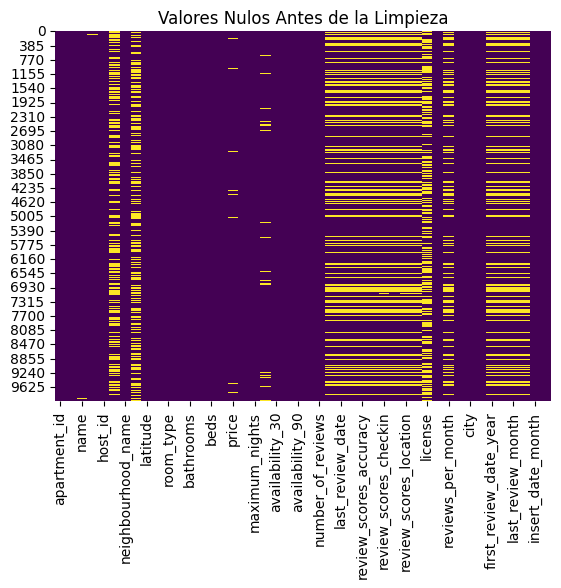

In [298]:
# Crear un mapa de calor para visualizar los valores nulos antes de la limpieza
sns.heatmap(df_alojamiento.isnull(), cbar=False, cmap='viridis')
plt.title('Valores Nulos Antes de la Limpieza')
plt.show()


## Eliminar del DF columnas no esenciales y normalizacion de columnas

In [299]:
# Convertir la columna 'apartment_id' a tipo objeto
df_alojamiento['apartment_id'] = df_alojamiento['apartment_id'].astype('object')
df_alojamiento['host_id'] = df_alojamiento['host_id'].astype('object')

In [300]:
# Normalizar las ciudades a minúsculas en df_alojamiento
df_alojamiento['city'] = df_alojamiento['city'].str.lower()

In [301]:

# Lista de columnas que quiero eliminar
columnas_nulas_eliminadas = ['neighborhood_overview','neighbourhood_district' ,'description','last_review_year','last_review_month', 'first_review_date_year','last_review_day','has_availability','insert_date','insert_date_day','insert_date_month','md5']

# Eliminar las columnas
df_alojamiento = df_alojamiento.drop(columns=columnas_nulas_eliminadas )


In [302]:
#ver cuantas filas y columnas tiene el nuevo dataframe
df_alojamiento.shape

(10000, 34)

## Eliminar del DF nulos en la variable 'precio' y otras

** observaciones **

Se decide eliminar las filas de inmuebles que no tienen precio.

In [303]:
# Eliminar las filas que tienen  en el DF la variable precio = 0
# Crear un nuevo DataFrame sin filas que tengan NaN en 'price'
df_alojamiento_sin_nan = df_alojamiento.dropna(subset=['price'])

In [304]:
df_alojamiento_sin_nan.shape

(9746, 34)

In [305]:
# Verificar si hay algún valor de precio igual a cero
tiene_precios_cero = (df_alojamiento_sin_nan['price'] == 0).any()

# Imprimir el resultado
print(f"¿El DataFrame tiene precios igual a cero? {tiene_precios_cero}")


¿El DataFrame tiene precios igual a cero? False


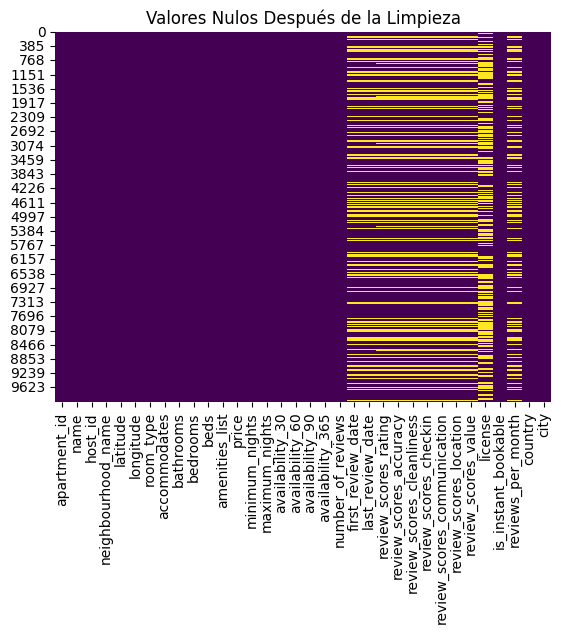

In [306]:
# Mostrar nans en valores númericos después de la limpieza
sns.heatmap(df_alojamiento_sin_nan.isnull(), cbar=False, cmap='viridis')
plt.title('Valores Nulos Después de la Limpieza')
plt.show()

In [307]:
# Despliegue de información sobre las columnas y estadísticas generales
print("Información sobre las columnas:")
print(df_alojamiento_sin_nan.info())


Información sobre las columnas:
<class 'pandas.core.frame.DataFrame'>
Index: 9746 entries, 0 to 9999
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   apartment_id                 9746 non-null   object        
 1   name                         9738 non-null   object        
 2   host_id                      9746 non-null   object        
 3   neighbourhood_name           9746 non-null   object        
 4   latitude                     9746 non-null   object        
 5   longitude                    9746 non-null   object        
 6   room_type                    9746 non-null   object        
 7   accommodates                 9746 non-null   int64         
 8   bathrooms                    9746 non-null   float64       
 9   bedrooms                     9746 non-null   float64       
 10  beds                         9746 non-null   float64       
 11  amenities_list  

In [308]:
print("Estadísticas generales del DataFrame:")
display(df_alojamiento_sin_nan.describe())

Estadísticas generales del DataFrame:


,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,...,first_review_date,last_review_date,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,9746.000000,9746.000000,9746.000000,9746.000000,9746.000000,9746.000000,9745.000000,9745.000000,9746.000000,9745.000000,...,7284,7283,7180.000000,7171.000000,7177.000000,7166.000000,7175.000000,7165.000000,7165.000000,7284.000000
mean,4.185102,1.550174,1.887441,2.903704,101.211090,4.943259,757.537814,12.928374,28.622820,45.929708,...,2017-06-12 05:01:52.685337600,2019-01-17 01:33:55.040505600,91.893315,9.449868,9.313083,9.624477,9.620906,9.545010,9.136636,1.445743
min,1.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,2010-01-02 00:00:00,2012-11-17 00:00:00,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.010000
25%,2.000000,1.000000,1.000000,1.000000,45.000000,1.000000,60.000000,0.000000,2.000000,9.000000,...,2016-06-13 00:00:00,2018-06-17 00:00:00,89.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,0.280000
50%,4.000000,1.000000,1.000000,2.000000,75.000000,2.000000,1125.000000,11.000000,29.000000,49.000000,...,2017-08-07 00:00:00,2019-04-18 00:00:00,94.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,0.860000
75%,6.000000,2.000000,3.000000,4.000000,124.000000,4.000000,1125.000000,26.000000,52.000000,79.000000,...,2018-09-16 00:00:00,2019-11-03 00:00:00,98.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,2.092500
max,19.000000,13.000000,50.000000,300.000000,500.000000,1125.000000,1125.000000,30.000000,60.000000,90.000000,...,2021-01-17 00:00:00,2021-02-21 00:00:00,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,12.910000
std,2.456895,0.893966,1.292974,4.751224,86.099548,17.540447,499.420598,11.807310,22.925644,33.694429,...,NaN,NaN,9.241044,0.946750,1.008568,0.825489,0.829386,0.763007,0.996450,1.594939


Definición Estadísticas Descriptivas:

Algunos ejemplos:

**Media, Mediana, Percentil:** Podría usar estos para entender la distribución de los precios (price), la cantidad de noches mínimas (minimum_nights), la cantidad de noches máximas (maximum_nights), la cantidad de personas que pueden ser acomodadas (accommodates), el número de baños (bathrooms), el número de habitaciones (bedrooms), y el número de camas (beds).

**Desviación Estándar, Desviación Absoluta Media:** Estos podrían ser útiles para entender la variabilidad en los precios (price), la cantidad de noches mínimas (minimum_nights), la cantidad de noches máximas (maximum_nights), la cantidad de personas que pueden ser acomodadas (accommodates), el número de baños (bathrooms), el número de habitaciones (bedrooms), y el número de camas (beds).

**Rango, Estimaciones basadas en Percentiles (IQR):** Estos podrían ser útiles para entender la dispersión de los precios (price), la cantidad de noches mínimas (minimum_nights), la cantidad de noches máximas (maximum_nights), la cantidad de personas que pueden ser acomodadas (accommodates), el número de baños (bathrooms), el número de habitaciones (bedrooms), y el número de camas (beds).

In [309]:
# Verificar datos nulos
print(df_alojamiento_sin_nan.isnull().sum())

apartment_id                      0
name                              8
host_id                           0
neighbourhood_name                0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
amenities_list                    1
price                             0
minimum_nights                    0
maximum_nights                    1
availability_30                   1
availability_60                   0
availability_90                   1
availability_365                  0
number_of_reviews                 0
first_review_date              2462
last_review_date               2463
review_scores_rating           2566
review_scores_accuracy         2575
review_scores_cleanliness      2569
review_scores_checkin          2580
review_scores_communication    2571
review_scores_location      

# 8.Análisis estadística Variables

In [310]:
import pandas as pd
# Lista de las variables a las que calcular toda la estadistica en un bucle
variables = ['price', 'minimum_nights', 'maximum_nights', 'bathrooms', 'accommodates', 'bedrooms', 'beds']
for var in variables:
    # Calcular la media, mediana, desviación estándar, MAD, rango, IQR, límites, máximo y mínimo
    mean = round(df_alojamiento_sin_nan[var].mean(), 2)  # Redondea la media a 2 decimales
    median = round(df_alojamiento_sin_nan[var].median(), 2)  # Redondea la mediana a 2 decimales
    std_dev = round(df_alojamiento_sin_nan[var].std(), 2)  # Redondea la desviación estándar a 2 decimales
    # mad = round(df_alojamiento_sin_nan[var].mad(), 2)  # Redondea la MAD a 2 decimales
    percentiles = df_alojamiento_sin_nan[var].quantile([0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
    rango = df_alojamiento_sin_nan[var].max() - df_alojamiento_sin_nan[var].min()
    IQR = df_alojamiento_sin_nan[var].quantile(0.75) - df_alojamiento_sin_nan[var].quantile(0.25)
    lower_bound = df_alojamiento_sin_nan[var].median() - 1.5*IQR
    upper_bound = df_alojamiento_sin_nan[var].median() + 1.5*IQR
    max_value = df_alojamiento_sin_nan[var].max()  # Calcula el valor máximo
    min_value = df_alojamiento_sin_nan[var].min()  # Calcula el valor mínimo

    # Imprimir los resultados
    # Imprimir los resultados
    print(f'Variable: {var}')
    print(f'Media: {mean}')
    print(f'Mediana: {median}')
    print(f'Desviación estándar: {std_dev}')
    # print(f'Desviación Absoluta Media (MAD): {mad}')
    print(f'Diferentes percentiles de la distribución: {percentiles}\n')
    print(f"Rango para '{var}': {rango}")
    print(f"IQR para '{var}': {IQR}")
    print(f"Límites para '{var}': [{lower_bound}, {upper_bound}]")
    print(f"Valor máximo para '{var}': {max_value}")
    print(f"Valor mínimo para '{var}': {min_value}\n")


Variable: price
Media: 101.21
Mediana: 75.0
Desviación estándar: 86.1
Diferentes percentiles de la distribución: 0.10     28.00
0.25     45.00
0.50     75.00
0.75    124.00
0.90    205.00
0.95    292.00
0.99    446.65
Name: price, dtype: float64

Rango para 'price': 494.0
IQR para 'price': 79.0
Límites para 'price': [-43.5, 193.5]
Valor máximo para 'price': 500.0
Valor mínimo para 'price': 6.0

Variable: minimum_nights
Media: 4.94
Mediana: 2.0
Desviación estándar: 17.54
Diferentes percentiles de la distribución: 0.10     1.0
0.25     1.0
0.50     2.0
0.75     4.0
0.90     7.0
0.95    30.0
0.99    32.0
Name: minimum_nights, dtype: float64

Rango para 'minimum_nights': 1124
IQR para 'minimum_nights': 3.0
Límites para 'minimum_nights': [-2.5, 6.5]
Valor máximo para 'minimum_nights': 1125
Valor mínimo para 'minimum_nights': 1

Variable: maximum_nights
Media: 757.54
Mediana: 1125.0
Desviación estándar: 499.42
Diferentes percentiles de la distribución: 0.10      21.0
0.25      60.0
0.50    1

### ** Observaciones para el Análisis Estadístico de Variables:**

Precio:

    Observaciones:
        Media y mediana indican un sesgo hacia la derecha.
        Desviación estándar y MAD sugieren variación significativa en los precios.
        Valores atípicos en el extremo superior podrían afectar al análisis.

    Propuestas de Acciones:
        Considerar aplicar una transformación logarítmica para reducir el sesgo.
        Evaluar la posibilidad de eliminar o ajustar los valores atípicos extremos.

Noches Mínimas:

    Observaciones:
        Media y mediana indican un sesgo hacia la derecha.
        Desviación estándar y MAD sugieren variación significativa.
        Valores atípicos en el extremo superior podrían afectar al análisis.

    Propuestas de Acciones:
        Limitar el número de noches mínimas a un valor razonable (por ejemplo, 30).
        Evaluar la necesidad de ajustar o eliminar valores atípicos.

Noches Máximas:

    Observaciones:
        Media y mediana indican un sesgo hacia la izquierda.
        Desviación estándar y MAD sugieren variación significativa.
        No hay valores atípicos fuera de los límites establecidos.

    Propuestas de Acciones:
        Evaluar si la variación en las noches máximas es adecuada para el análisis.

Baños:

    Observaciones:
        Media y mediana indican un ligero sesgo hacia la derecha.
        Desviación estándar y MAD sugieren variación moderada.
        Valores atípicos en el extremo superior podrían afectar al análisis.

    Propuestas de Acciones:
        Agrupar el número de baños en categorías (por ejemplo, “1”, “2”, “3” y “3 o más”).
        Evaluar la necesidad de ajustar o eliminar valores atípicos.

Capacidad de Alojamiento:

    Observaciones:
        Distribución bastante simétrica.
        Desviación estándar y MAD sugieren variación moderada.

    Propuestas de Acciones:
        Agrupar la capacidad de alojamiento en categorías (por ejemplo, “1-2”, “3-4”, “5-6” y “7 o más”).
        Evaluar la necesidad de transformaciones adicionales.

Dormitorios:

    Observaciones:
        Distribución bastante simétrica.
        Desviación estándar y MAD sugieren variación moderada.

    Propuestas de Acciones:
        Evaluar la necesidad de transformaciones adicionales.

Camas:

    Observaciones:
        Sesgo hacia la derecha.
        Desviación estándar y MAD sugieren variación significativa.

    Propuestas de Acciones:
        Considerar aplicar una transformación logarítmica o limitar el número de camas a un valor razonable.
        Evaluar la necesidad de ajustar o eliminar valores atípicos.

###** Conclusiones Generales:**

    Existe variación significativa en el precio, noches mínimas y máximas, y número de camas.
    Menos variación en capacidad de alojamiento, número de baños y dormitorios.

###** Hipótesis:**

Influencia  del Precio:

    Observaciones Adicionales:
        La distribución de precios muestra un sesgo hacia la derecha y una variación significativa.
    Hipótesis:
        La aplicación de una transformación logarítmica a los precios puede mitigar el sesgo y reducir la variabilidad, facilitando un análisis más robusto y una interpretación más clara.
    Acciones:
        Aplicar una transformación logarítmica a la variable de precio.
        Evaluar la distribución transformada y su impacto en el análisis.

Noches Mínimas y Máximas:

    Observaciones Adicionales:
        Las noches mínimas y máximas presentan variabilidad significativa, con valores atípicos en el extremo superior.
    Hipótesis:
        Limitar el número de noches mínimas a un valor razonable (por ejemplo, 30) puede mejorar la consistencia en las políticas de alquiler.
        Evaluar la variabilidad en las noches máximas para garantizar una experiencia de usuario coherente.
    Acciones:
        Establecer un límite razonable para las noches mínimas.
        Evaluar la distribución y variabilidad de las noches máximas y considerar ajustes.

Número de Baños y Capacidad de Alojamiento:

    Observaciones Adicionales:
        La variable de baños muestra valores atípicos en el extremo superior.
        La capacidad de alojamiento presenta una distribución simétrica con variación moderada.
    Hipótesis:
        Agrupar el número de baños en categorías (por ejemplo, “1”, “2”, “3” y “3 o más”) puede simplificar el análisis y mejorar la interpretación.
        Agrupar la capacidad de alojamiento en categorías (por ejemplo, “1-2”, “3-4”, “5-6” y “7 o más”) puede facilitar la identificación de patrones.
    Acciones:
        Crear categorías para el número de baños y capacidad de alojamiento.
        Evaluar el impacto en la interpretación y análisis.

Número de Camas:

    Observaciones Adicionales:
        La variable de camas presenta sesgo hacia la derecha y variabilidad significativa.
    Hipótesis:
        Aplicar una transformación logarítmica o limitar el número de camas puede reducir la variabilidad y mejorar la interpretación.
    Acciones:
        Evaluar la distribución logarítmica de la variable de camas.
        Limitar el número de camas a un valor razonable y evaluar su impacto.

# 9.Interpretación Estadistica y Visualizacion Outliers





#### Variable 'price':


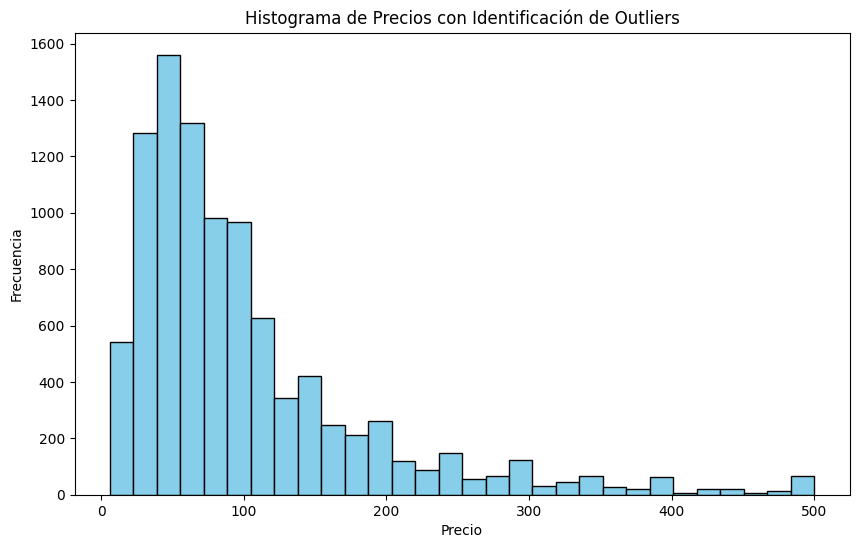

In [311]:
import matplotlib.pyplot as plt

# Histograma de 'price'
plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_nan['price'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histograma de Precios con Identificación de Outliers')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.show()

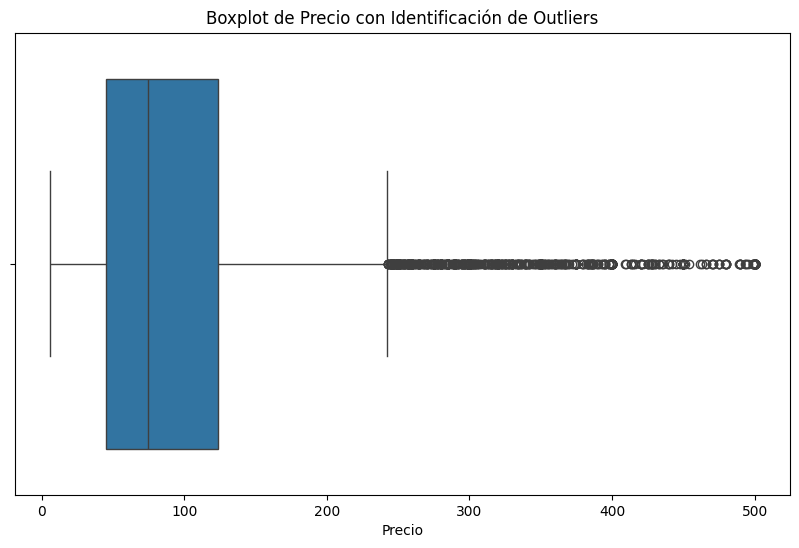

In [312]:
# Boxplot para 'price' con identificación de outliers
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_alojamiento_sin_nan['price'])
plt.title('Boxplot de Precio con Identificación de Outliers')
plt.xlabel('Precio')
plt.show()

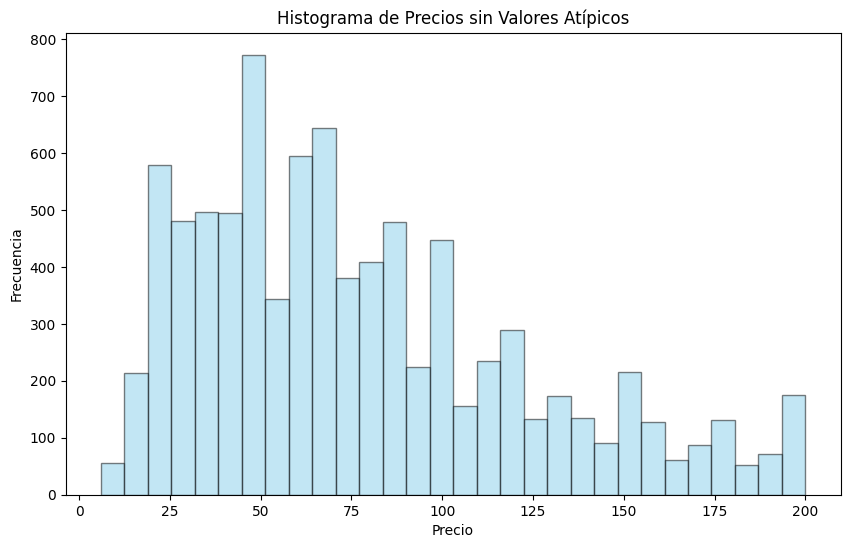

In [313]:
# Histograma de 'price' sin valores atípicos
df_alojamiento_sin_outliers_precio = df_alojamiento_sin_nan.query('price <= 200')

plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_outliers_precio['price'], bins=30, alpha=0.5, color='skyblue', edgecolor='black', label='Price')
plt.title('Histograma de Precios sin Valores Atípicos')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.show()

##### Conclusión var precios:


    - La media sugiere una distribución sesgada (cola larga hacia la derecha) hacia la derecha.Esto se debe a que la media es mayor que la mediana (76), lo que **indica que hay una mayor proporción de apartamentos con precios más altos que con precios más bajos. **
    - La desviación estándar es alta (85.0), indicando una variabilidad significativa en los precios.
    - La desviación absoluta media (MAD) de 59.39 sugiere que los precios pueden variar considerablemente respecto a la media.
    - El rango de precios es amplio (494.0), lo que indica una gran variabilidad en los datos.
    - El IQR (rango intercuartílico) es 75.0, indicando la dispersión de los datos centrales.
    -El analisis histograma sin valores atipicos, muestra que la mayoría de los alojamientos en España tienen un precio razonable. Sin embargo, hay algunos alojamientos con precios muy elevados, que podrían ser el resultado de factores como la ubicación, la calidad o la disponibilidad.


#### Variable Noches:


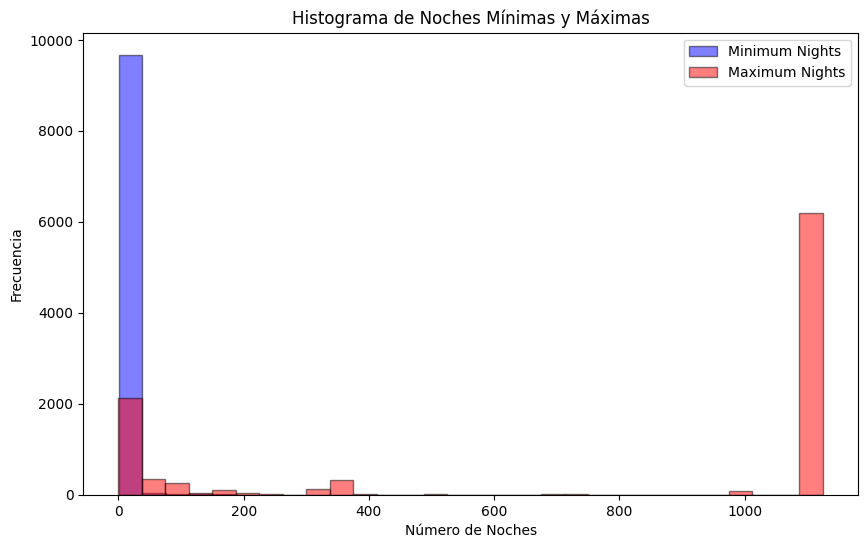

In [314]:

# Histograma de 'minimum_nights' y 'maximum_nights'
plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_nan['minimum_nights'], bins=30, alpha=0.5, color='blue', edgecolor='black', label='Minimum Nights')
plt.hist(df_alojamiento_sin_nan['maximum_nights'], bins=30, alpha=0.5, color='red', edgecolor='black', label='Maximum Nights')
plt.title('Histograma de Noches Mínimas y Máximas')
plt.xlabel('Número de Noches')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

#Cuando se superponen dos distribuciones de datos, los colores se mezclan y dan lugar a un nuevo color.

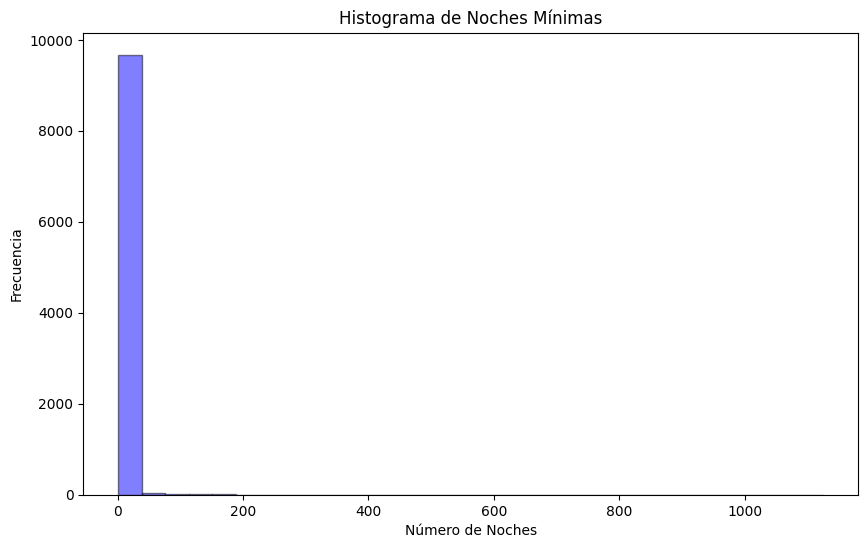

In [315]:

# Histograma de 'minimum_nights'
plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_nan['minimum_nights'], bins=30, alpha=0.5, color='blue', edgecolor='black', label='Minimum Nights')
plt.title('Histograma de Noches Mínimas')
plt.xlabel('Número de Noches')
plt.ylabel('Frecuencia')
plt.show()


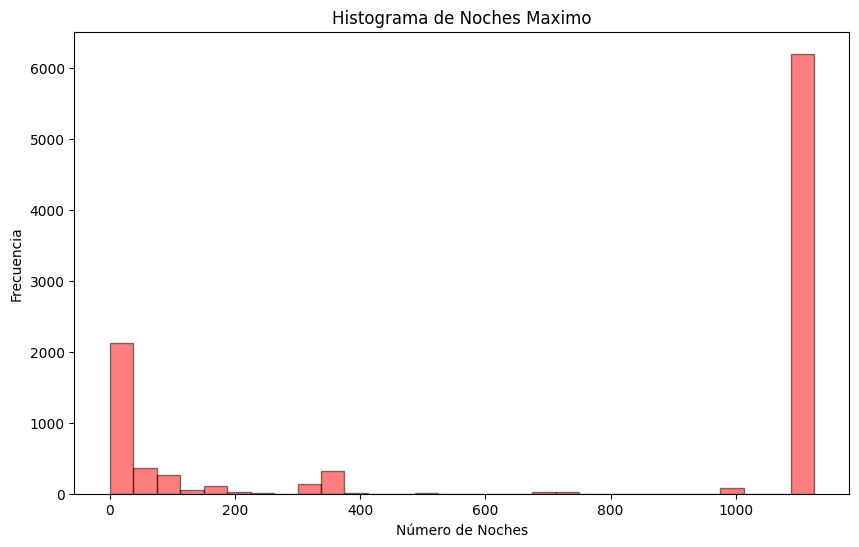

In [316]:

# Histograma de 'maximum_nights
plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_nan['maximum_nights'], bins=30, alpha=0.5, color='red', edgecolor='black', label='Maximum Nights')
plt.title('Histograma de Noches Maximo')
plt.xlabel('Número de Noches')
plt.ylabel('Frecuencia')
plt.show()

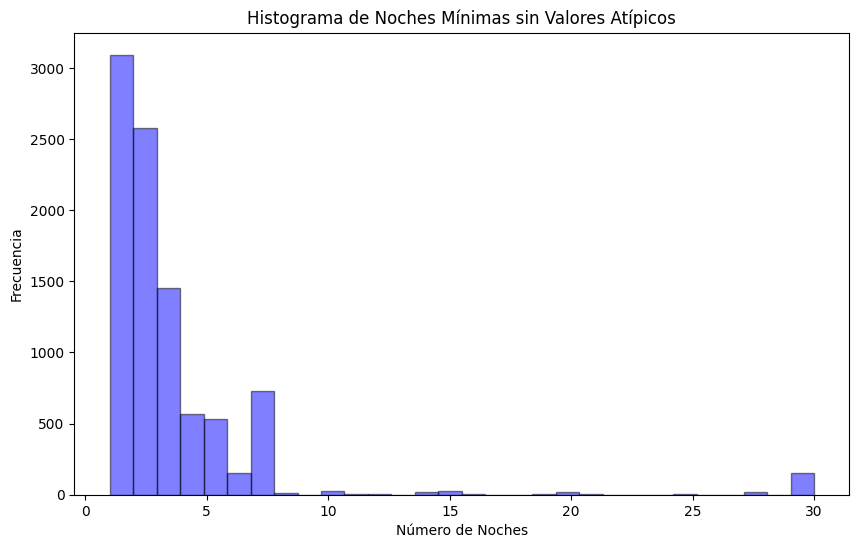

In [317]:
# Histograma de 'minimum_nights' sin valores atípicos
df_alojamiento_sin_outliers_min= df_alojamiento_sin_nan.query('minimum_nights <= 30')

plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_outliers_min['minimum_nights'], bins=30, alpha=0.5, color='blue', edgecolor='black', label='Minimum Nights')
plt.title('Histograma de Noches Mínimas sin Valores Atípicos')
plt.xlabel('Número de Noches')
plt.ylabel('Frecuencia')
plt.show()

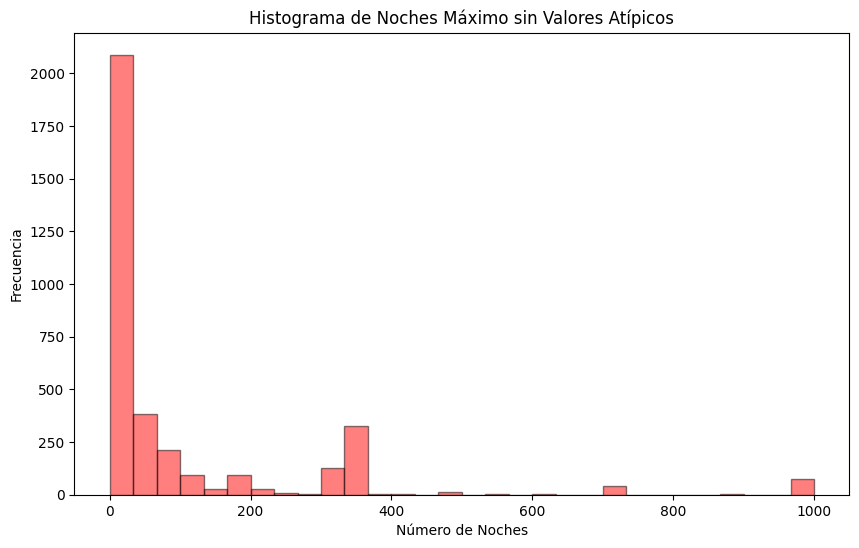

In [318]:
# Histograma de 'maximum_nights' sin valores atípicos
df_alojamiento_sin_outliers_max = df_alojamiento_sin_nan.query('maximum_nights <= 1000') #en este caso particular uso el IQR: 1063.0 como filtro porque el limite superior es demasiado elevado

plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_outliers_max['maximum_nights'], bins=30, alpha=0.5, color='red', edgecolor='black', label='Maximum Nights')
plt.title('Histograma de Noches Máximo sin Valores Atípicos')
plt.xlabel('Número de Noches')
plt.ylabel('Frecuencia')
plt.show()

##### Conclusión var noches:


Variable 'minimum_nights':
   
    La media (4.95) es mayor que la mediana (2.0), indicando una posible asimetría derecha.
    La mediana indica que el 50% de las estancias son de 2 noches
    La desviación estándar es relativamente alta (17.73), señalando una variabilidad significativa en las noches mínimas.
    El rango (1124) y el IQR (3.0) indican una amplia dispersión de datos, especialmente en los valores atípicos..
    Analisis hist sin outliers:
      El histograma muestra que la mayoría de los alojamientos en España permiten a los huéspedes reservar un número de noches razonable.
      Hay algunos alojamientos que permiten reservar un número menor de noches, que podrían ser el resultado de factores como la ubicación, la calidad o la disponibilidad.

Variable 'maximum_nights':

    La mediana (1125.0) es igual a la media, sugiriendo una distribución simétrica.
    La desviación estándar (498.42) y la desviación absoluta media (470.0) son altas, indicando alta variabilidad.
    El rango (1125.0) y el IQR (1063.0) indican que hay una amplia dispersión en los datos.
    Analisis hist sin outliers:
      La mayoría de los alojamientos en España permiten a los huéspedes reservar un número de noches razonable.
      Hay un pequeño número de alojamientos que permiten reservar un número mayor de noches, por razones que podrían ser la ubicación, la calidad o la disponibilidad.




#### Variable 'accommodates':

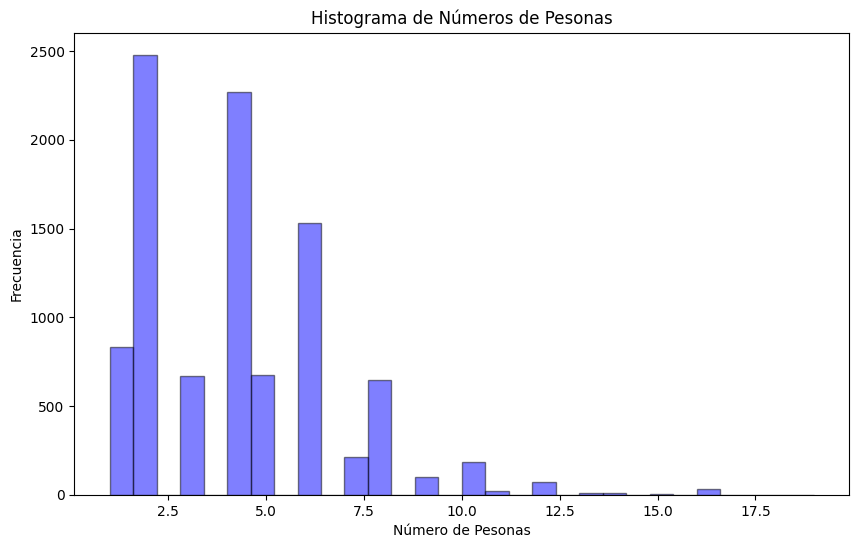

In [319]:

# Histograma de 'accomodates'
plt.figure(figsize=(10, 6))
plt.hist(df_alojamiento_sin_nan['accommodates'], bins=30, alpha=0.5, color='blue', edgecolor='black', label='accommodates')
plt.title('Histograma de Números de Pesonas')
plt.xlabel('Número de Pesonas')
plt.ylabel('Frecuencia')
plt.show()

#Cuando se superponen dos distribuciones de datos, los colores se mezclan y dan lugar a un nuevo color.

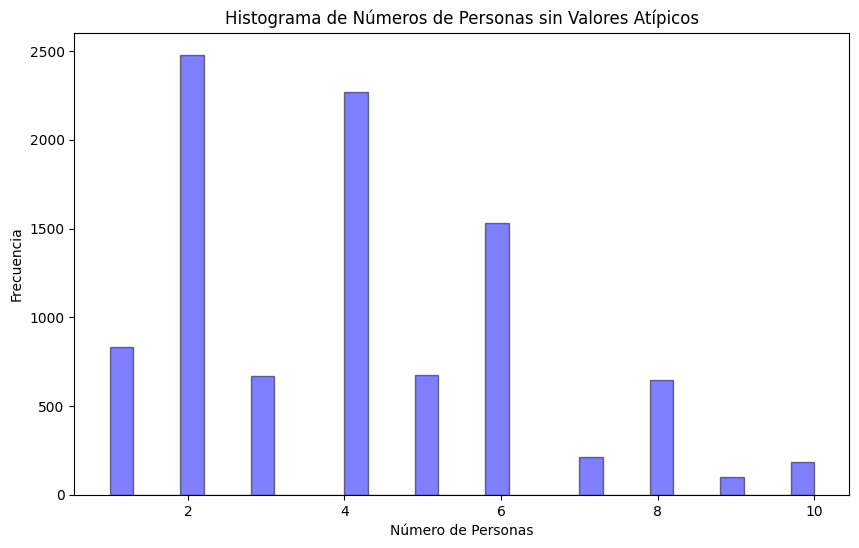

In [320]:
# Filtrar DataFrame para 'accommodates' sin outliers
df_accommodates_no_outliers = df_alojamiento_sin_nan.query('accommodates <= 10') #Límite superior del IQR

# Histograma de 'accommodates' sin outliers
plt.figure(figsize=(10, 6))
plt.hist(df_accommodates_no_outliers['accommodates'], bins=30, alpha=0.5, color='blue', edgecolor='black', label='accommodates')
plt.title('Histograma de Números de Personas sin Valores Atípicos')
plt.xlabel('Número de Personas')
plt.ylabel('Frecuencia')
plt.show()

##### Conclusión var accomodates:

    La media y la mediana son cercanas (4.27 y 4.0 respectivamente), sugiriendo una distribución más simétrica.
    La desviación estándar (2.58) y la desviación absoluta media (1.99) son relativamente bajas en comparación con otras variables.
    El rango (28) y el IQR (4.0) indican cierta variabilidad, pero no tan pronunciada.
    Analisis hist sin valores atipicos
    el histograma muestra, por ejemplo, que la distribución del número de personas que pueden alojarse es similar a la distribución del número máximo de noches. Ambas distribuciones son simétricas, con una cola corta hacia la derecha.
    Esto indica que la mayoría de los alojamientos en España tienen un número de personas que pueden alojarse y un número máximo de noches que permiten reservar razonables.
    Hay algunos alojamientos que tienen un número mayor o menor de personas que pueden alojarse o un número mayor de noches que permiten reservar, por razones que podrían ser la ubicación, la calidad o la disponibilidad.

#### Otras variables

Variable 'bathrooms':
Variable 'bedrooms':
Variable 'beds':

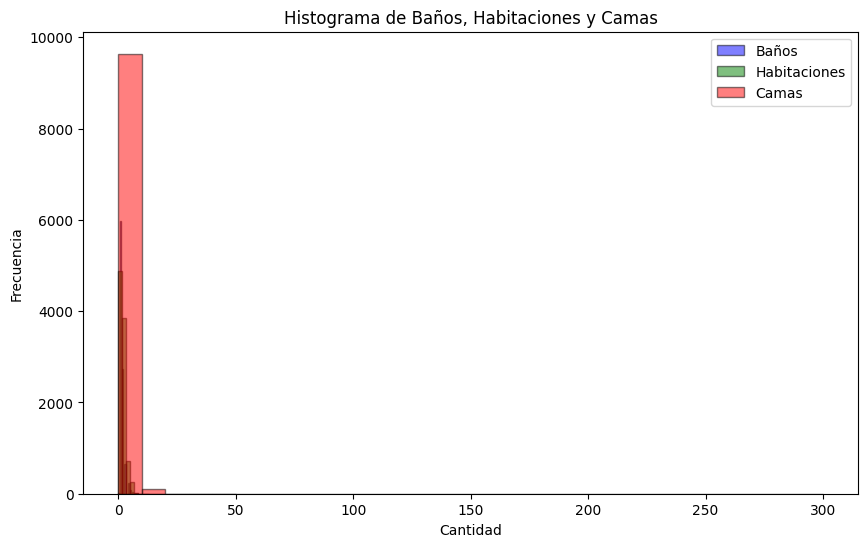

In [321]:
plt.figure(figsize=(10, 6))

# Histograma de 'bathrooms'
plt.hist(df_alojamiento_sin_nan['bathrooms'], bins=30, alpha=0.5, color='blue', edgecolor='black', label='Baños')

# Histograma de 'bedrooms'
plt.hist(df_alojamiento_sin_nan['bedrooms'], bins=30, alpha=0.5, color='green', edgecolor='black', label='Habitaciones')

# Histograma de 'beds'
plt.hist(df_alojamiento_sin_nan['beds'], bins=30, alpha=0.5, color='red', edgecolor='black', label='Camas')

plt.title('Histograma de Baños, Habitaciones y Camas')
plt.xlabel('Cantidad')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()


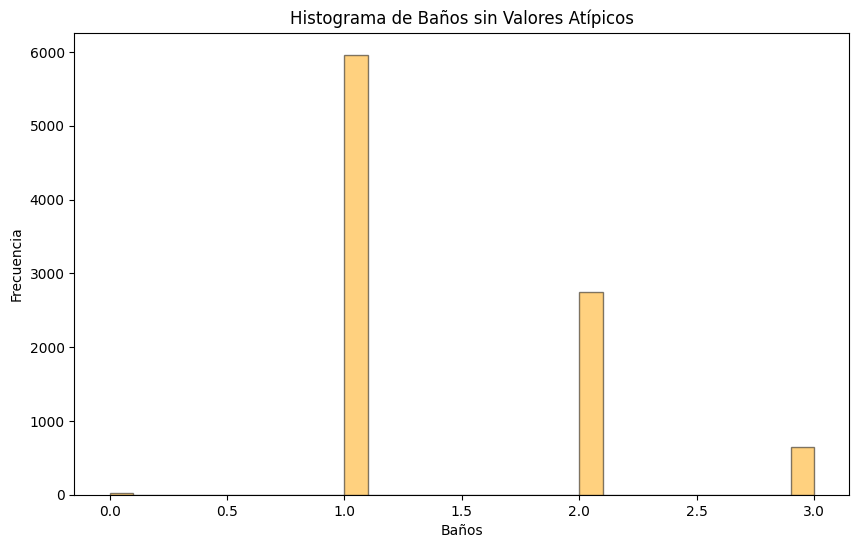

In [322]:
# Histograma de 'bathrooms' sin valores atípicos
df_alojamiento_sin_outliers_bath = df_alojamiento_sin_nan.query('bathrooms <= 3')

plt.figure(figsize=(10, 6))

# Histograma de 'bathrooms'
plt.hist(df_alojamiento_sin_outliers_bath ['bathrooms'], bins=30, alpha=0.5, color='orange', edgecolor='black', label='Baños')

plt.title('Histograma de Baños sin Valores Atípicos')
plt.xlabel('Baños')
plt.ylabel('Frecuencia')
plt.show()

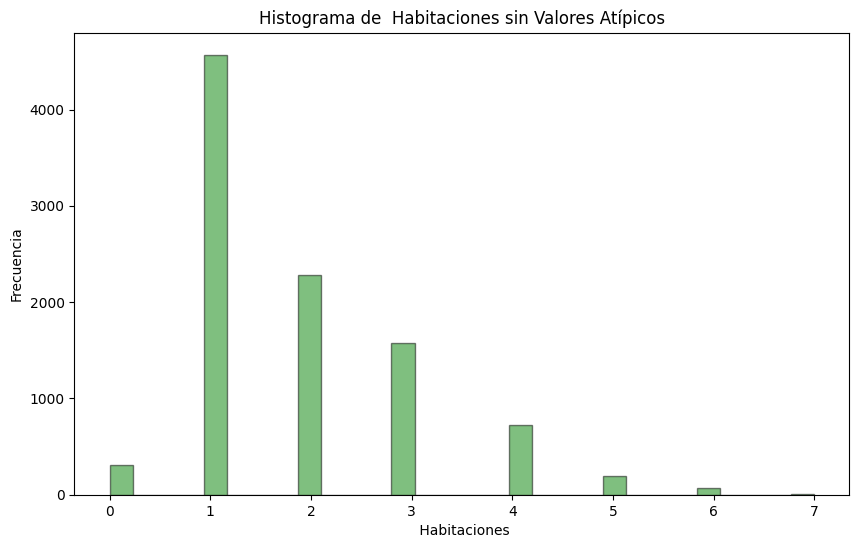

In [323]:
# # Histograma de  'bedrooms' sin valores atípicos
df_alojamiento_sin_outliers_bedr = df_alojamiento_sin_nan.query('bedrooms <= 7')

plt.figure(figsize=(10, 6))

# Histograma de 'bedrooms'
plt.hist(df_alojamiento_sin_outliers_bedr['bedrooms'], bins=30, alpha=0.5, color='green', edgecolor='black', label='Habitaciones')

plt.title('Histograma de  Habitaciones sin Valores Atípicos')
plt.xlabel(' Habitaciones')
plt.ylabel('Frecuencia')

plt.show()

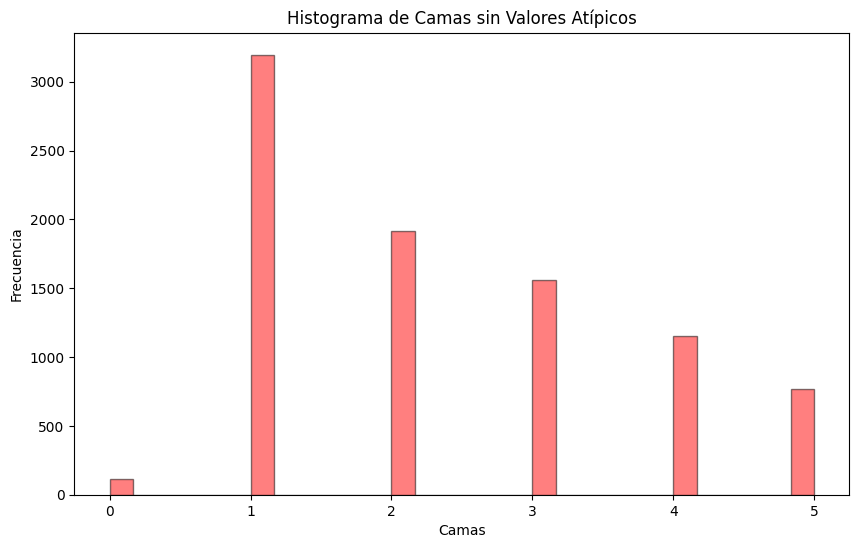

In [324]:
# # Histograma de 'beds' sin valores atípicos
df_alojamiento_sin_outliers_beds = df_alojamiento_sin_nan.query('beds <= 5')

plt.figure(figsize=(10, 6))


# Histograma de 'beds'
plt.hist(df_alojamiento_sin_outliers_beds['beds'], bins=30, alpha=0.5, color='red', edgecolor='black', label='Camas')

plt.title('Histograma de Camas sin Valores Atípicos')
plt.xlabel('Camas')
plt.ylabel('Frecuencia')
plt.show()

In [325]:
# Usar el método .loc para conocer la información dónde las beds se igual 300
df_alojamiento_sin_nan.loc[df_alojamiento_sin_nan['beds'] == 300]

#si parece que hay dos villas

,apartment_id,name,host_id,neighbourhood_name,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,is_instant_bookable,reviews_per_month,country,city
36,21616423,Villa de lujo con acceso privado a la playa.,157248245,Ciutadella de Menorca,4.000.068,380.093,Entire home/apt,10,3.0,4.0,...,8.0,9.0,9.0,9.0,9.0,NaN,True,0.63,spain,menorca
9325,37960115,HOME FAMILY,287790795,Tossa de Mar,4.172.537,293.512,Entire home/apt,6,1.0,2.0,...,10.0,10.0,10.0,8.0,8.0,HUTG-036175,True,1.00,spain,girona


##### Conclusión var otras variables:

Variable Bathroom

    La media (1.60) y la mediana (1.0) sugieren una distribución sesgada hacia la derecha.
    La desviación estándar (0.99) es moderada, indicando cierta variabilidad en el número de baños.
    El rango (13.0) y el IQR (1.0) indican variabilidad, pero no tan amplia.
    Analisis sin valores atipicos:
      El histograma muestra que la mayoría de los alojamientos en España tienen un baño, lo que es un requisito básico para la mayoría de los huéspedes. Sin embargo, hay algunos alojamientos que tienen dos o más baños, lo que podría ser el resultado de factores como el tamaño del alojamiento, la ubicación o el tipo de alojamiento.



Variable Bedsroom

    La media (1.94) y la mediana (2.0) sugieren una distribución casi simétrica.
    La desviación estándar (1.37) es moderada, indicando cierta variabilidad en el número de habitaciones.
    El rango (50.0) y el IQR (2.0) indican cierta variabilidad, especialmente con algunos valores atípicos.
    Analisis sin valores atipicos:
      La mayoría de los alojamientos en España tienen una o dos habitaciones, lo que es un requisito básico para la mayoría de los huéspedes.
      Hay un pequeño número de alojamientos que tienen tres o más habitaciones, lo que podría ser el resultado de factores como el tamaño del alojamiento, la ubicación o el tipo de alojamiento.


Variable Beds

    La media (2.98) y la mediana (2.0) sugieren una distribución sesgada hacia la derecha.
    La desviación estándar (4.77) y la desviación absoluta media (1.72) son relativamente altas.
    El rango (300.0) y el IQR (3.0) indican una amplia dispersión de datos, especialmente en los valores atípicos.
    Analisis sin valores atipicos:
      La mayoría de los alojamientos en España tienen una o dos camas, lo que es un requisito básico para la mayoría de los huéspedes.
      Hay un pequeño número de alojamientos que tienen tres o más camas, lo que podría ser el resultado de factores como el tamaño del alojamiento, la ubicación o el tipo de alojamiento.


# 10.Crear un Nuevo DF tras análisis estadístico- "df_transformado"

In [326]:
import numpy as np

# Crear un nuevo DataFrame a partir del original
df_transformado = df_alojamiento_sin_nan.copy()

# Aplicar la transformación logarítmica a 'price' y 'beds' . Sigo indicaciones
df_transformado['price_log'] = np.log1p(df_transformado['price']) #se ha creado una nueva columna
df_transformado['beds_log'] = np.log1p(df_transformado['beds'])#se ha creado una nueva columna

# Agrupar el número de baños en categorías
bins = [0, 1, 2, 3, np.inf]
labels = ['0-1', '2-3', '4-5', '6+']
df_transformado['bathrooms_cat'] = pd.cut(df_transformado['bathrooms'], bins=bins, labels=labels)

# Agrupar el número de bedrooms en categorías
bins = [0, 1, 2, 3, np.inf]
labels = ['0-1', '2-3', '4-5', '6+']
df_transformado['bedrooms_cat'] = pd.cut(df_transformado['bedrooms'], bins=bins, labels=labels)

# Agrupar el número de bed en categorías
bins = [0, 1, 2, 3, np.inf]
labels = ['0-1', '2-3', '4-5', '6+']
df_transformado['beds_cat'] = pd.cut(df_transformado['beds'], bins=bins, labels=labels)


# Agrupar la capacidad de alojamiento en categorías
bins = [0, 3, 6, 9, np.inf]
labels = ['1-3', '4-6', '7-9', '10+']
df_transformado['accommodates_cat'] = pd.cut(df_transformado['accommodates'], bins=bins, labels=labels)


# Agrupar los review_scores_rating_cat en categorías
bins = [0, 30, 60, 90, np.inf]
labels = ['0-30', '40-60', '70-90', '100']
df_transformado['review_scores_rating_cat'] = pd.cut(df_transformado['review_scores_rating'], bins=bins, labels=labels)

# Agrupar los number_of_reviews en categorías
bins = [0, 100, 200, 300, 400, np.inf]
labels = ['0-100', '100-200', '200-300', '300-400', '400+']
df_transformado['number_of_reviews_cat'] = pd.cut(df_transformado['number_of_reviews'], bins=bins, labels=labels)


# Agrupar los price en categorías
bins = [0, 100, 200, 300, 400, np.inf]
labels = ['0-100', '100-200', '200-300', '300-400', '400+']
df_transformado['price_cat'] = pd.cut(df_transformado['price'], bins=bins, labels=labels)



In [327]:
# Verificar datos nulos
print(df_transformado.isnull().sum())

apartment_id                      0
name                              8
host_id                           0
neighbourhood_name                0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
amenities_list                    1
price                             0
minimum_nights                    0
maximum_nights                    1
availability_30                   1
availability_60                   0
availability_90                   1
availability_365                  0
number_of_reviews                 0
first_review_date              2462
last_review_date               2463
review_scores_rating           2566
review_scores_accuracy         2575
review_scores_cleanliness      2569
review_scores_checkin          2580
review_scores_communication    2571
review_scores_location      

In [328]:
df_transformado["price"].max()

500.0

In [329]:
df_transformado["number_of_reviews_cat"].value_counts()

number_of_reviews_cat
0-100      6574
100-200     524
200-300     125
300-400      40
400+         24
Name: count, dtype: int64

In [330]:
df_transformado["beds_cat"].value_counts()

beds_cat
0-1    3197
6+     2953
2-3    1918
4-5    1562
Name: count, dtype: int64

In [331]:
df_transformado["bedrooms_cat"].value_counts()

bedrooms_cat
0-1    4569
2-3    2282
4-5    1571
6+     1017
Name: count, dtype: int64

In [332]:
df_transformado["bathrooms_cat"].value_counts()

bathrooms_cat
0-1    5964
2-3    2743
4-5     649
6+      370
Name: count, dtype: int64

In [333]:
df_transformado["accommodates_cat"].value_counts()

accommodates_cat
4-6    4473
1-3    3980
7-9     957
10+     336
Name: count, dtype: int64

In [334]:
df_transformado["review_scores_rating_cat"].value_counts()

review_scores_rating_cat
100      4871
70-90    2163
40-60     128
0-30       18
Name: count, dtype: int64

In [335]:
df_transformado.shape

(9746, 43)

#11.Visualización de distribuciones

## Gráfico Variables categóricas (tipo 'object')

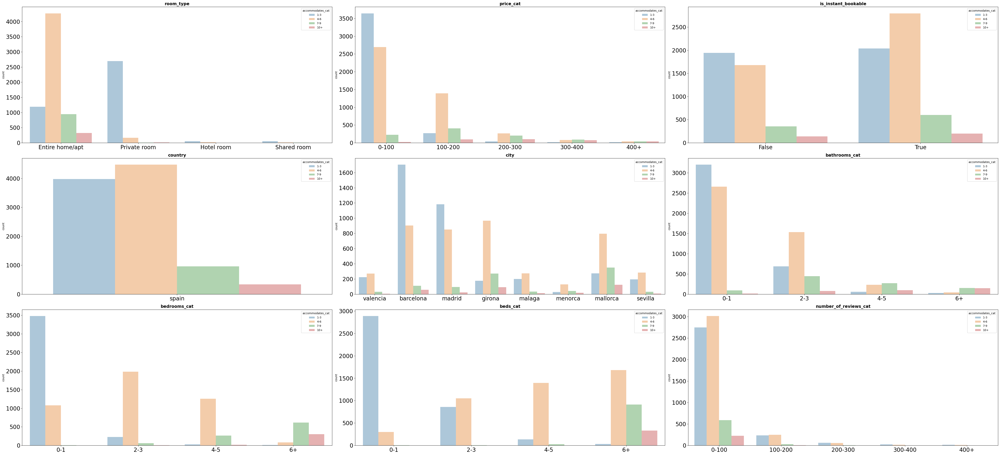

In [416]:
import matplotlib.pyplot as plt
import seaborn as sns

columnas_cat = ['room_type','price_cat','is_instant_bookable', 'country', 'city','bathrooms_cat','bedrooms_cat','beds_cat','number_of_reviews_cat']

fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (50, 30)) # Ajustamos el número de filas a 4
axes = axes.flat # Con esta función .flat conseguimos aplanar las dimensiones de arriba

for i, colum in enumerate(columnas_cat):
    sns.countplot(
        data = df_transformado,
        x = colum,
        hue = "accommodates_cat", #room_type o is_instant_bookable o country o city:
        alpha = 0.4,
        ax = axes[i])

    axes[i].set_title(colum, fontsize = 15, fontweight = "bold")
    axes[i].tick_params(labelsize = 20)
    axes[i].set_xlabel("")

# Eliminamos los ejes vacíos
for i in range(len(columnas_cat), len(axes)):
    fig.delaxes(axes[i])

fig.tight_layout();



### ** observaciones **

*   *apartment_id y host_id:* Son identificadores únicos y no proporcionan información significativa sobre las tendencias de los datos.
*   *accommodates, bathrooms, bedrooms:* Indican que la mayoría de los apartamentos pueden alojar a un número pequeño de personas y tienen pocas instalaciones, lo que sugiere que son adecuados para estancias individuales o en pareja.
*   *price:* La mayoría de los apartamentos tienen precios bajos, lo que indica que son asequibles para la mayoría de los usuarios.**Sin embargo, sería útil identificar si hay valores atípicos (outliers) con precios significativamente altos y analizar sus características**
* minimum_nights, maximum_nights:* La mayoría de los apartamentos requieren estancias cortas, lo que sugiere que son populares para viajes de corta duración. ***Sin embargo, podrían existir outliers que requieran estancias más largas. Sería útil entender por qué.***
*   *availability_30, availability_60, availability_90, availability_365* Estas variables muestran una distribución sesgada hacia un extremo, lo que indica que la mayoría de los apartamentos tienen alta disponibilidad**. Podría ser interesante analizar la relación entre la disponibilidad y otros factores como el precio o la ubicación.**

*   *number_of_reviews*: La mayoría de los apartamentos tienen pocos comentarios, lo que puede sugerir que son nuevos en el mercado o no son muy populares.**Podría ser útil analizar las características comunes de estos apartamentos populares.**
*   *review_scores_*…: La mayoría de los apartamentos tienen altas puntuaciones de revisión, lo que indica que los usuarios generalmente están satisfechos con su estancia.



# 12.Análisis de la Variable Precio

## Comparación entre variables categorticas

<Axes: xlabel='room_type'>

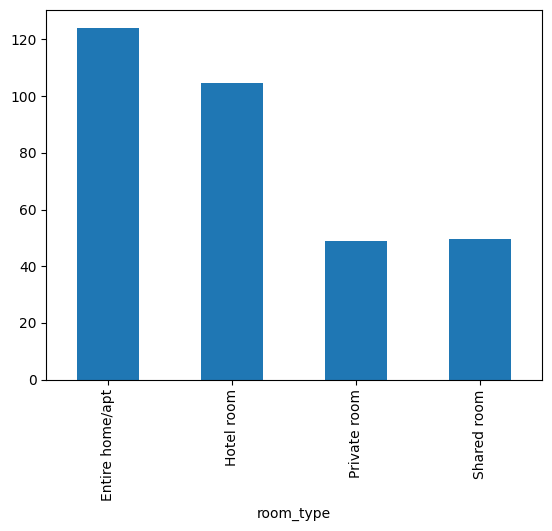

In [372]:
df_transformado.groupby('room_type')['price'].mean().plot.bar()

<Axes: xlabel='city'>

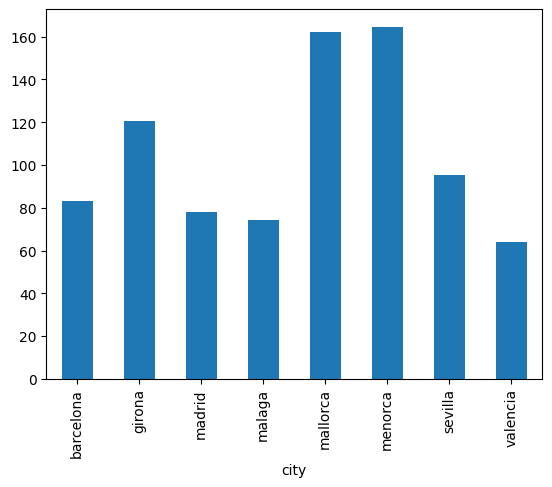

In [373]:
df_transformado.groupby('city')['price'].mean().plot.bar()

<Axes: xlabel='number_of_reviews_cat'>

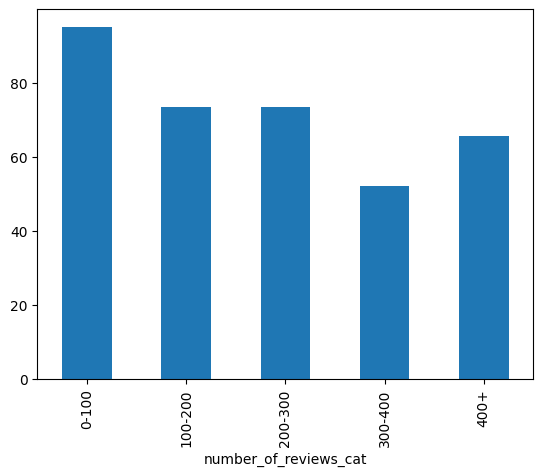

In [374]:
df_transformado.groupby('number_of_reviews_cat')['price'].mean().plot.bar()

## Investigar el precio más a fondo los valores atípicos con precios altos

---



Para entender las características de estos apartamentos,  examinar otras variables como ‘room_type’, ‘amenities_list’, etc. para estos valores atípicos

* ‘amenities_list’: Los servicios adicionales que ofrece un apartamento pueden influir en su precio. Voy a investigar si ciertos servicios están más asociados con precios más altos.También, investigar la correlación entre los servicios adicionales y el precio. Por ejemplo,  crear una matriz de correlación o utilizar un modelo de regresión lineal para ver cómo los diferentes servicios afectan al precio.

* ‘neighbourhood_name’: La ubicación de un apartamento puede tener un gran impacto en su precio. Voy a investigar si ciertos barrios tienen una mayor proporción de precios atípicos.

* ‘availability_365’: Los apartamentos que están disponibles para ser alquilados durante más días al año podrían tener precios más altos debido a una mayor demanda. Dividir esta variable en categorías (por ejemplo, baja, media, alta disponibilidad) y luego comparar los precios medios de cada categoría.

* ‘review_scores_rating’: Los apartamentos con calificaciones de revisión más altas podrían tener precios más altos.También.investigar si los apartamentos con calificaciones más altas tienen más servicios o están en ubicaciones más deseables.

* ‘bedrooms’, ‘bathrooms’, ‘beds’: El número de habitaciones, baños y camas en un apartamento también podría influir en su precio. Investigar si los apartamentos con más habitaciones, baños o camas tienen más servicios

* ‘is_instant_bookable’: Los apartamentos que se pueden reservar instantáneamente podrían tener precios más altos debido a la conveniencia que ofrecen.

* ‘last_review_date’: Investigar si los apartamentos con revisiones más recientes tienen precios más altos. Esto podría indicar que los apartamentos más populares o más demandados tienen precios más altos.

* ‘number_of_reviews’: Investigar si los apartamentos con más revisiones tienen precios más altos. Esto podría indicar que los apartamentos más populares o más demandados tienen precios más altos.

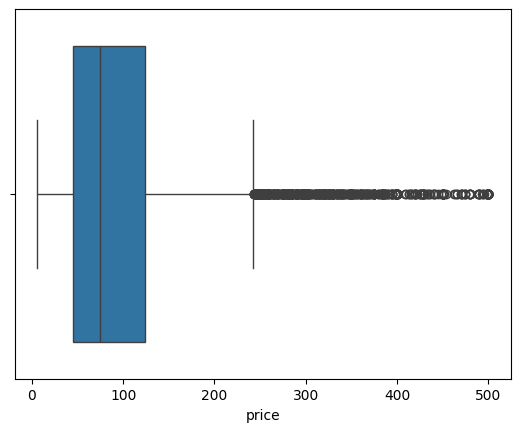

In [377]:
# boxplot
sns.boxplot(x=df_transformado['price'])
plt.show()


In [378]:
#1. Definir valores atípicos

Q1 = df_transformado['price'].quantile(0.25)
Q3 = df_transformado['price'].quantile(0.75)
IQR = Q3 - Q1

outlier_threshold = Q3 + 1.5 * IQR


In [379]:
#2. Filtrar el DF por los preciosque sean solo los valores atípicos.
outliers_df = df_transformado[df_transformado['price'] > outlier_threshold]


** variables a investigar **

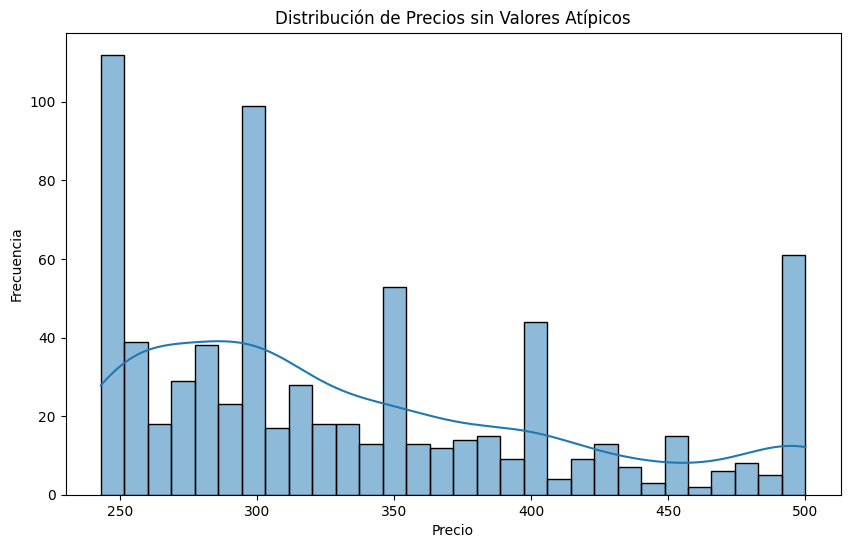

In [380]:
#Los precios atípicos con valores significativamente altos están asociados con características particulares.**

# Histograma de la variable 'price' sin valores atípicos
plt.figure(figsize=(10, 6))
sns.histplot(outliers_df['price'], bins=30, kde=True)
plt.title('Distribución de Precios sin Valores Atípicos')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.show()


In [381]:
# Filtrar el DataFrame para quedarse solo con los precios altos
df_precios_altos = df_transformado[df_transformado['price'] > df_transformado['price'].median()]

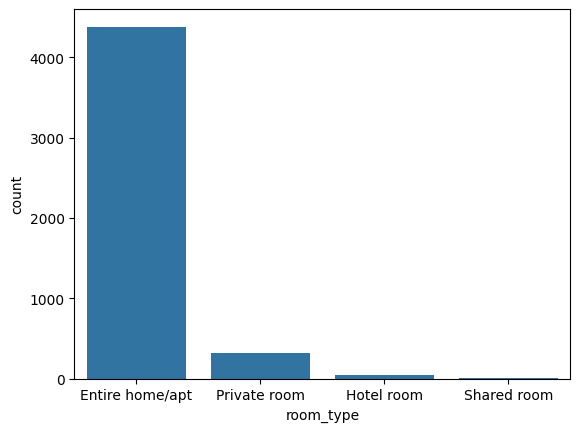

In [382]:
# @title Variable a investigar room_type
sns.countplot(x=df_precios_altos['room_type'])
plt.show()


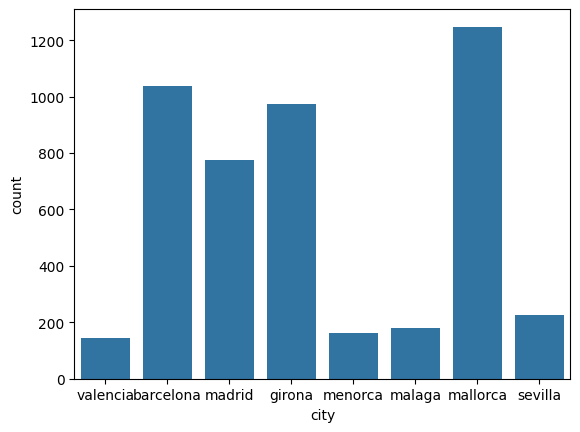

In [383]:

# @title Variable a investigar city
sns.countplot(x=df_precios_altos['city'])
plt.show()


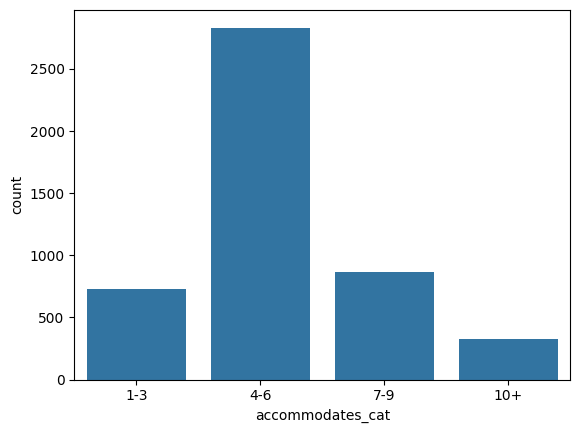

In [384]:
# @title Variable a investigar accommodates_cat

sns.countplot(x=df_precios_altos['accommodates_cat'])
plt.show()


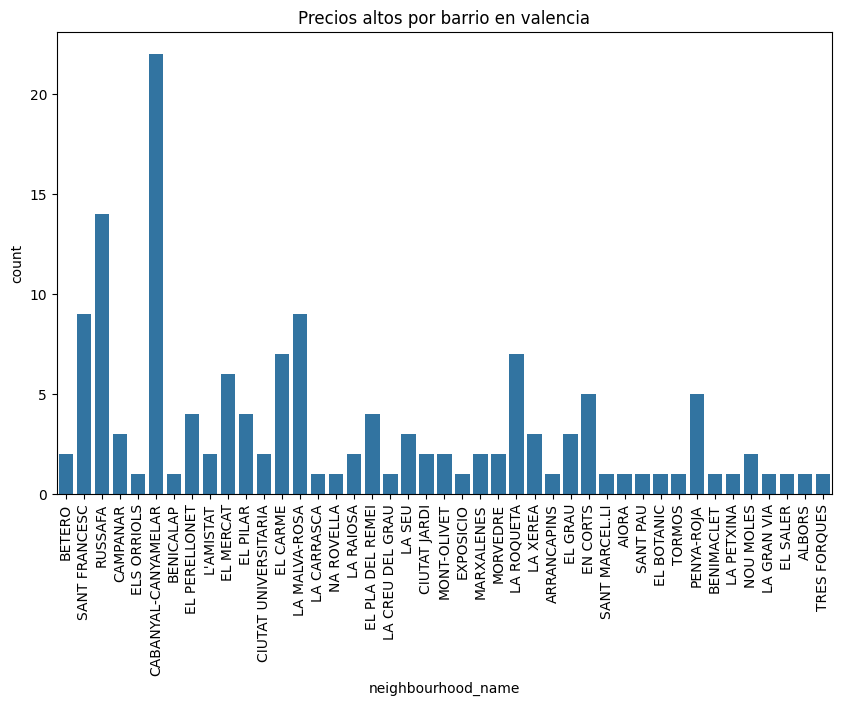

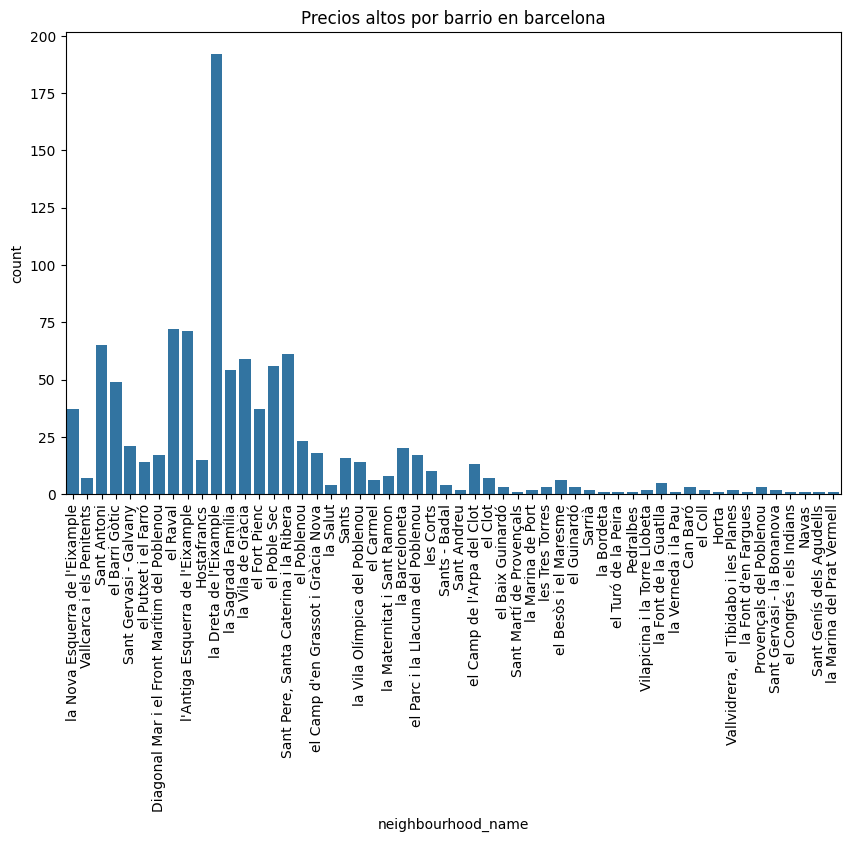

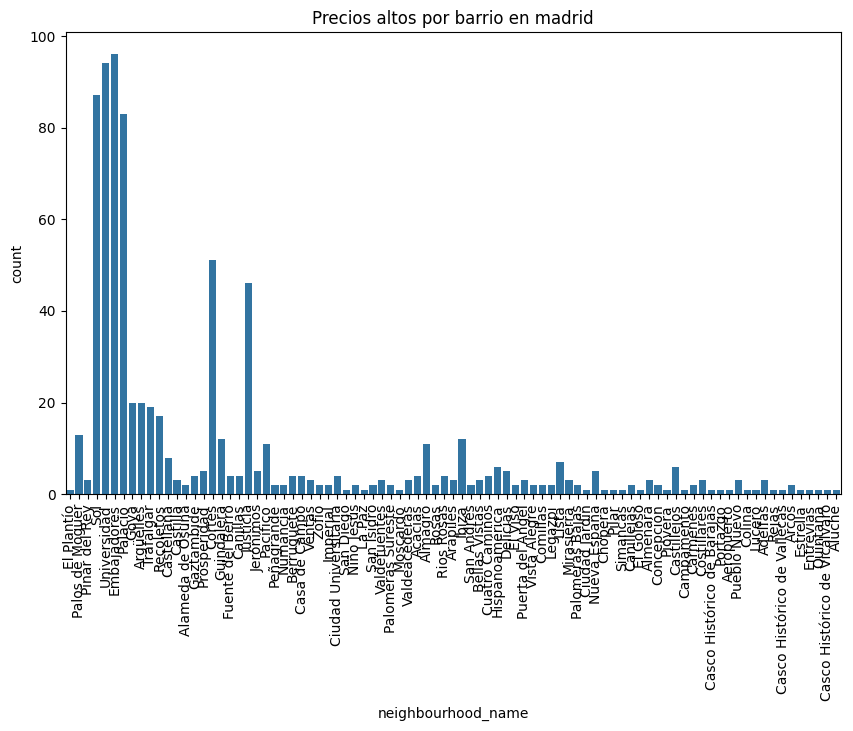

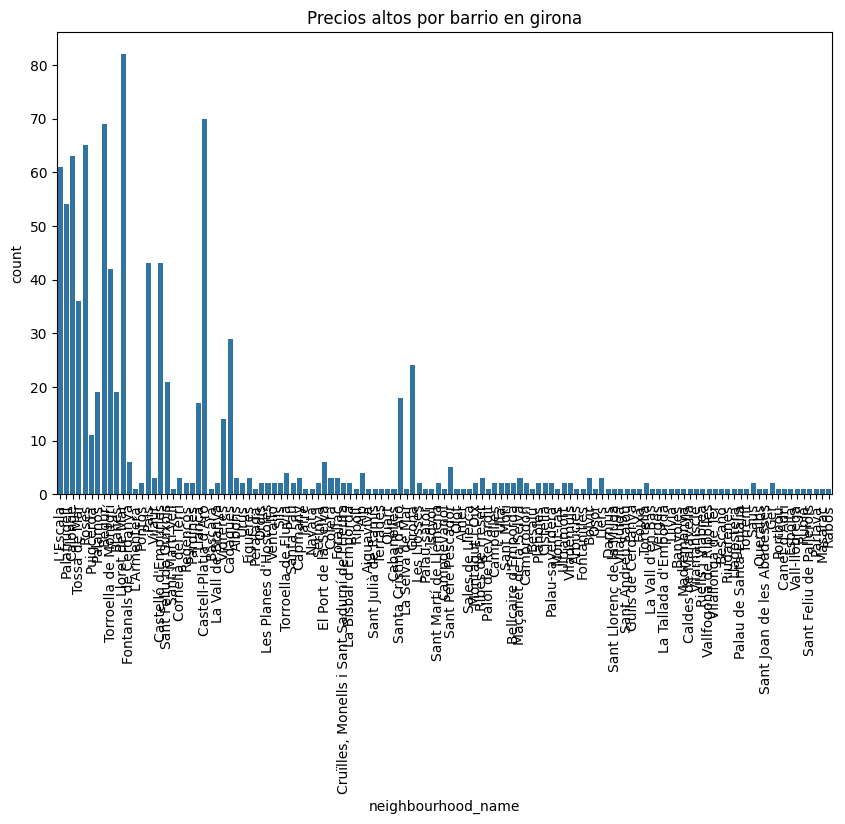

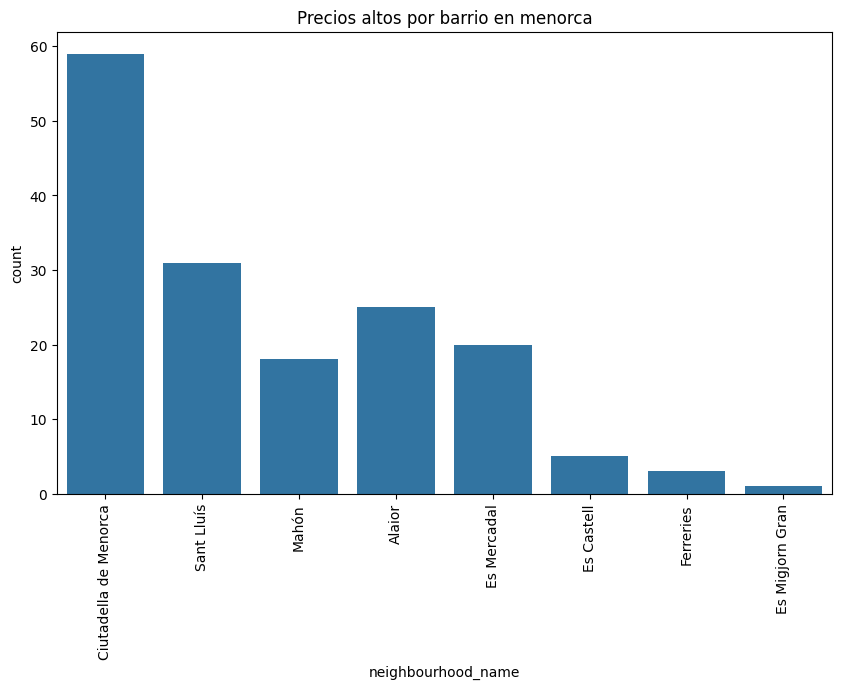

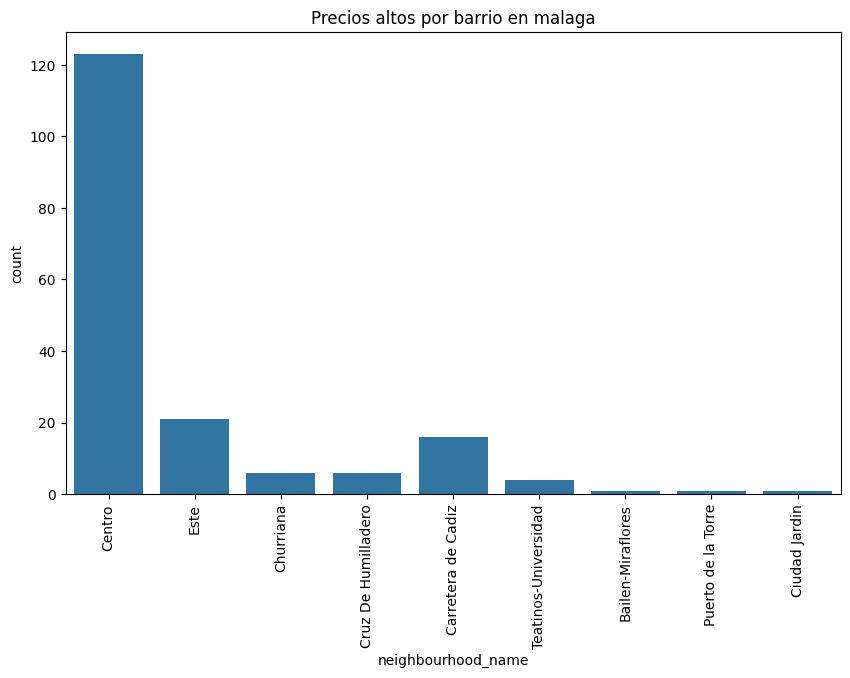

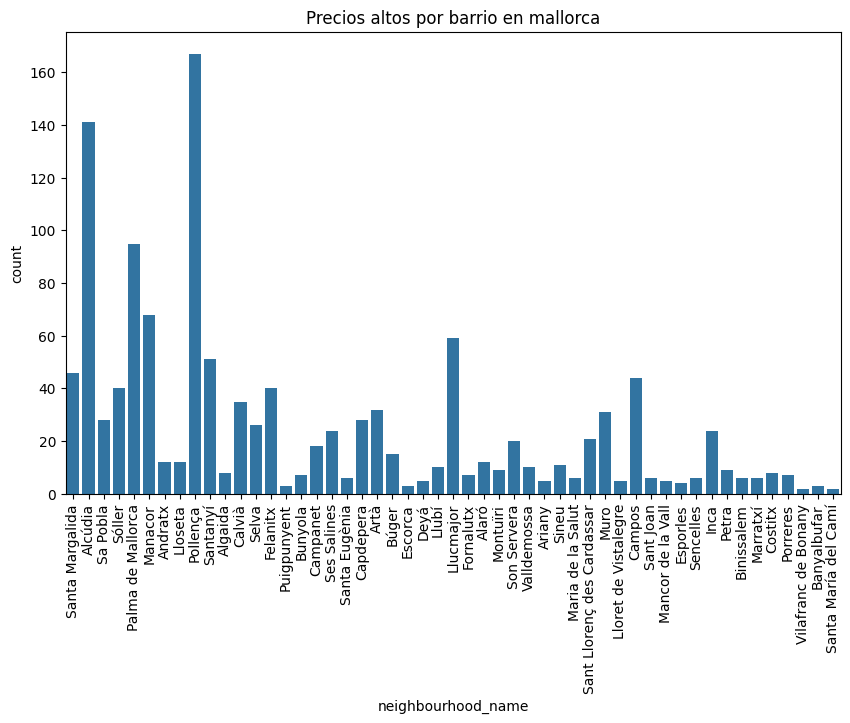

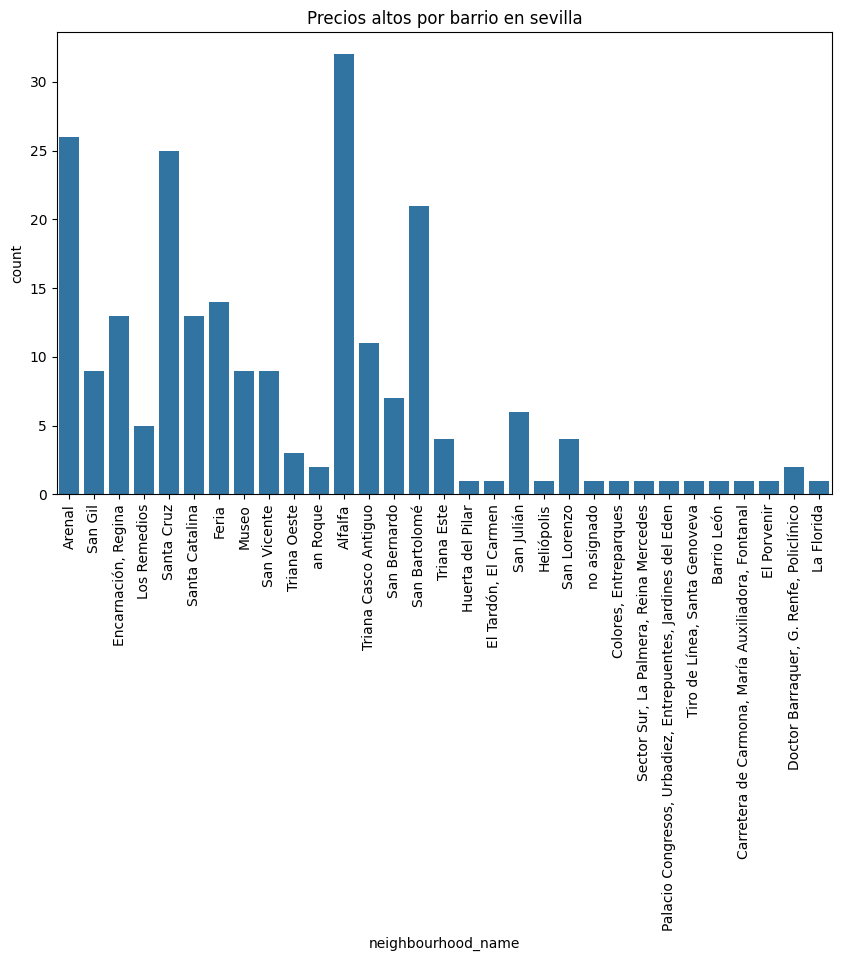

In [385]:
# @title Variable a investigar neighbourhood_name

ciudades = df_precios_altos['city'].unique()

for ciudad in ciudades:
    df_ciudad = df_precios_altos[df_precios_altos['city'] == ciudad]

    if not df_ciudad.empty:
        plt.figure(figsize=(10,6))
        sns.countplot(x=df_ciudad['neighbourhood_name'])
        plt.title(f"Precios altos por barrio en {ciudad}")
        plt.xticks(rotation=90)  # Añadido para mejorar la legibilidad de las etiquetas del eje x
        plt.show()
    else:
        print(f"No hay precios altos en {ciudad}.")

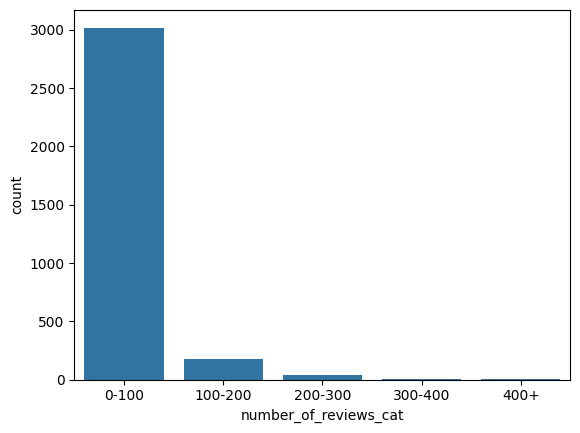

In [387]:
# @title Variable a investigar  number_of_reviews
sns.countplot(x=df_precios_altos['number_of_reviews_cat'])
plt.show()


La correlación entre el número de revisiones y el precio es -0.13572786508693502


<Axes: xlabel='number_of_reviews', ylabel='price'>

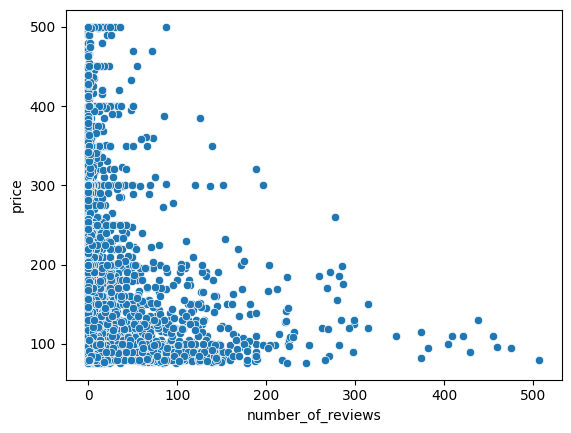

In [388]:
correlation = df_precios_altos['number_of_reviews'].corr(df_precios_altos['price'])

print(f"La correlación entre el número de revisiones y el precio es {correlation}")

# Para visualizar la relación puedes usar una gráfica de dispersión
sns.scatterplot(x='number_of_reviews', y='price', data=df_precios_altos)

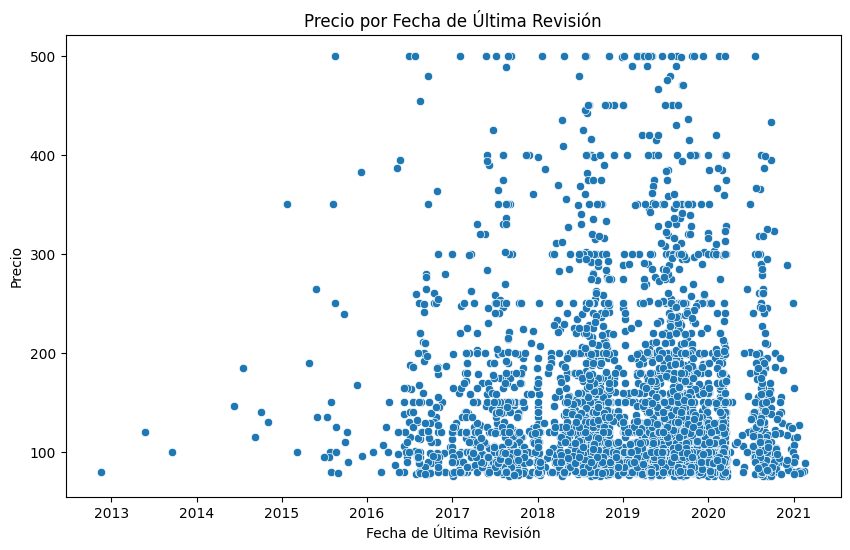

In [389]:
# @title Variable a investigar last_review_date

plt.figure(figsize=(10,6))
sns.scatterplot(x='last_review_date', y='price', data=df_precios_altos)
plt.title('Precio por Fecha de Última Revisión')
plt.xlabel('Fecha de Última Revisión')
plt.ylabel('Precio')
plt.show()


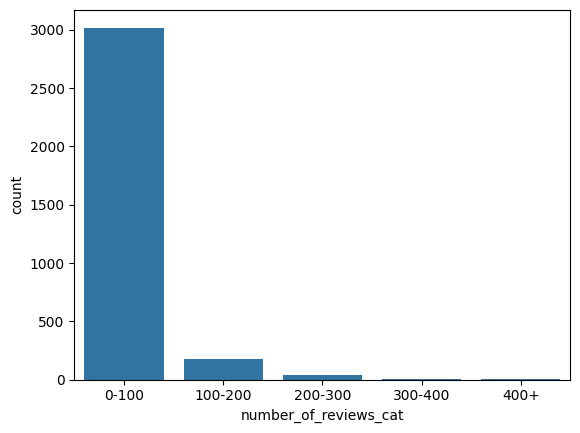

In [390]:
# @title Variable a investigar  number_of_reviews
sns.countplot(x=df_precios_altos['number_of_reviews_cat'])
plt.show()

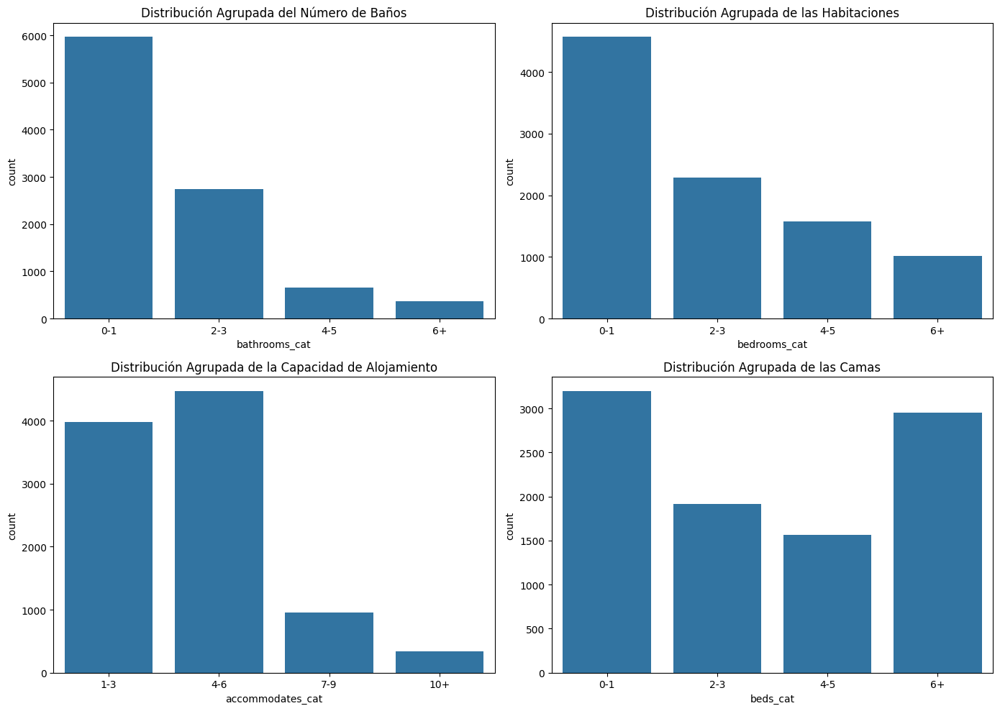

In [392]:
#@title Variables 'accommodates', 'bathrooms', 'bedrooms' y 'beds'

# Visualizar la distribución agrupada
fig, axes = plt.subplots(2, 2, figsize=(14, 10)) # Ajustamos el número de filas a 2

sns.countplot(x='bathrooms_cat', data=df_transformado, ax=axes[0, 0])
axes[0, 0].set_title('Distribución Agrupada del Número de Baños')

sns.countplot(x='bedrooms_cat', data=df_transformado, ax=axes[0, 1])
axes[0, 1].set_title('Distribución Agrupada de las Habitaciones')

sns.countplot(x='accommodates_cat', data=df_transformado, ax=axes[1, 0])
axes[1, 0].set_title('Distribución Agrupada de la Capacidad de Alojamiento')

sns.countplot(x='beds_cat', data=df_transformado, ax=axes[1, 1])
axes[1, 1].set_title('Distribución Agrupada de las Camas')

plt.tight_layout()
plt.show()

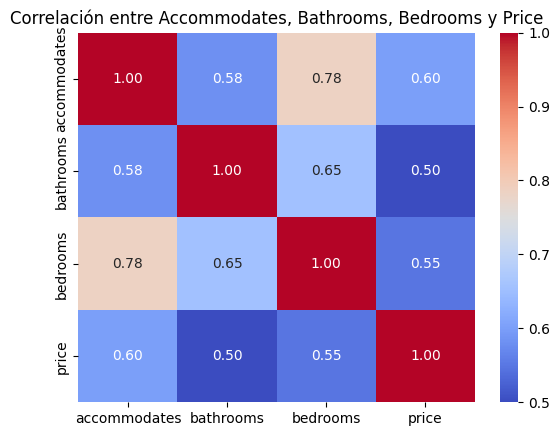

In [393]:
# Visualizar la correlación entre 'accommodates', 'bathrooms', 'bedrooms' y 'price'
corr_matrix = df_transformado[['accommodates', 'bathrooms', 'bedrooms', 'price']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlación entre Accommodates, Bathrooms, Bedrooms y Price')
plt.show()

# 13.Análisis de Hispotesis planteadas

### ** Hipotesis  **

* H1: price: s investigar más a fondo los valores atípicos con precios significativamente altos. ¿Qué características tienen estos apartamentos que justifican su alto precio? Esto podría implicar un análisis más detallado o incluso un estudio de caso. *(punto Investigar el precio más a fondo...)*

* H2:minimum_nights, maximum_nights:analizar los outliers que requieren estancias más largas. ¿Estos apartamentos ofrecen algún tipo de descuento para estancias largas? ¿Están ubicados en áreas turísticas donde los visitantes tienden a quedarse más tiempo?

* H3:number_of_reviews: analizar las características comunes de los apartamentos con muchas reseñas. ¿Estos apartamentos tienen alguna característica única que los haga populares?


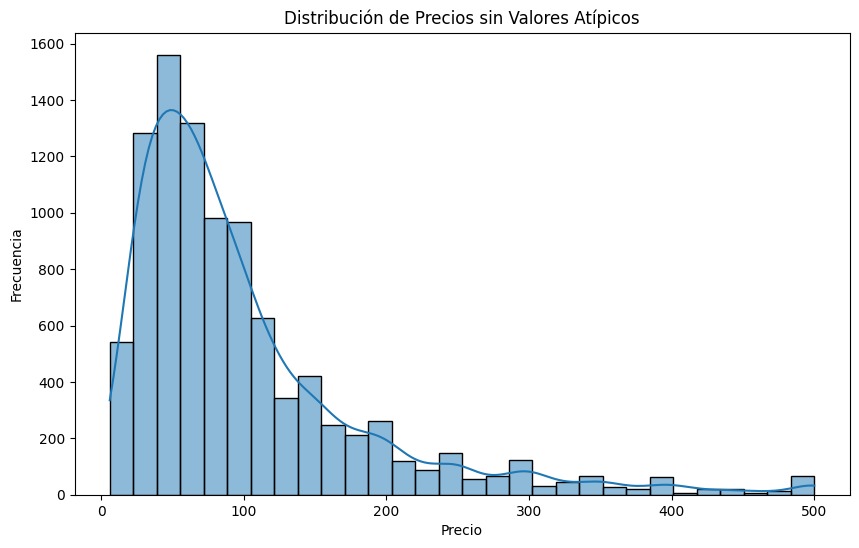

In [394]:
# @title # Hipótesis 1 Análisis de distribución de apartamentos con precios altos

#Los precios atípicos con valores significativamente altos están asociados con características particulares.**


df_precios_altos = df_transformado[df_transformado['price'] > df_transformado['price'].quantile(0.99)]
# Histograma de la variable 'price' sin valores atípicos
plt.figure(figsize=(10, 6))
sns.histplot(df_transformado['price'], bins=30, kde=True)
plt.title('Distribución de Precios sin Valores Atípicos')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.show()


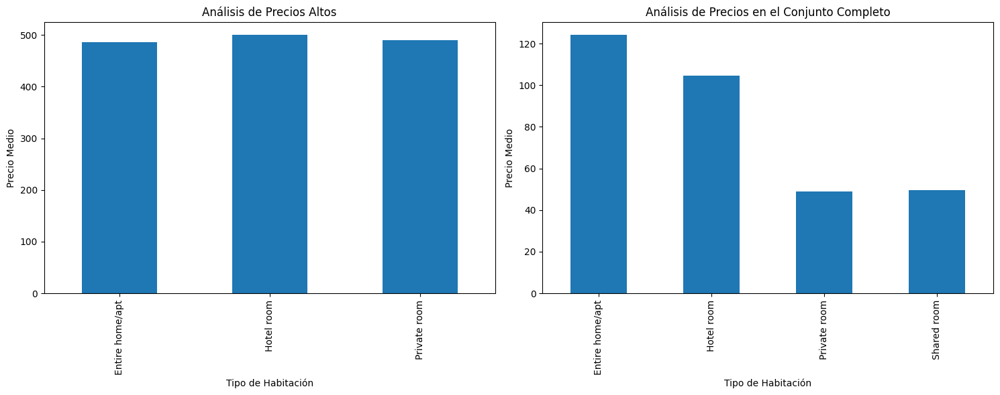

In [395]:
#Análisis de características asociadas a los precios altos
# Crear una figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico 1: Análisis de precios altos
df_precios_altos.groupby('room_type')['price'].mean().plot.bar(ax=axes[0])
axes[0].set_title('Análisis de Precios Altos')
axes[0].set_ylabel('Precio Medio')
axes[0].set_xlabel('Tipo de Habitación')

# Gráfico 2: Análisis de precios en el conjunto completo
df_transformado.groupby('room_type')['price'].mean().plot.bar(ax=axes[1])
axes[1].set_title('Análisis de Precios en el Conjunto Completo')
axes[1].set_ylabel('Precio Medio')
axes[1].set_xlabel('Tipo de Habitación')

# Ajustar el diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()


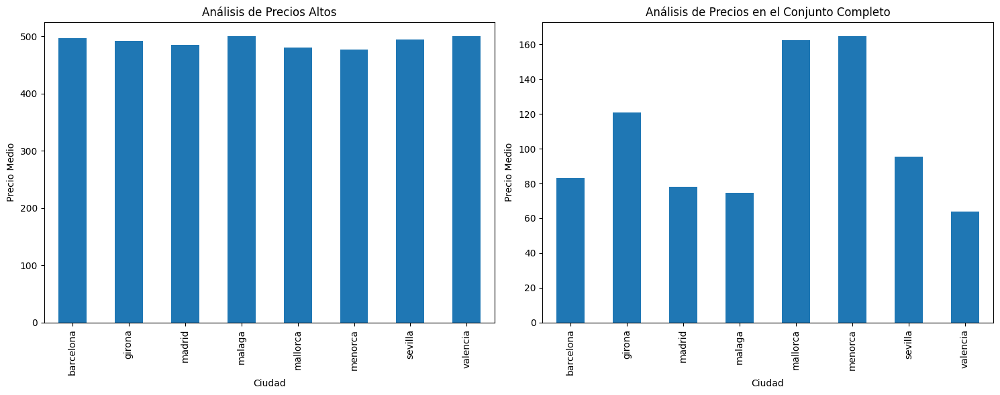

In [398]:



#Análisis de características asociadas a los precios altos
# Crear una figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico 1: Análisis de precios altos
df_precios_altos.groupby('city')['price'].mean().plot.bar(ax=axes[0])
axes[0].set_title('Análisis de Precios Altos')
axes[0].set_ylabel('Precio Medio')
axes[0].set_xlabel('Ciudad')

# Gráfico 2: Análisis de precios en el conjunto completo
df_transformado.groupby('city')['price'].mean().plot.bar(ax=axes[1])
axes[1].set_title('Análisis de Precios en el Conjunto Completo')
axes[1].set_ylabel('Precio Medio')
axes[1].set_xlabel('Ciudad')

# Ajustar el diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()

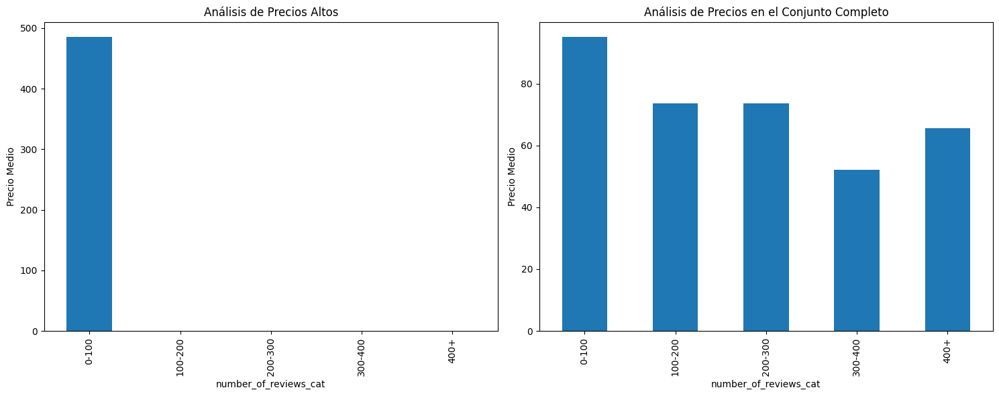

In [399]:

#Análisis de características asociadas a los precios altos
# Crear una figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico 1: Análisis de precios altos
df_precios_altos.groupby('number_of_reviews_cat')['price'].mean().plot.bar(ax=axes[0])
axes[0].set_title('Análisis de Precios Altos')
axes[0].set_ylabel('Precio Medio')
axes[0].set_xlabel('number_of_reviews_cat')

# Gráfico 2: Análisis de precios en el conjunto completo
df_transformado.groupby('number_of_reviews_cat')['price'].mean().plot.bar(ax=axes[1])
axes[1].set_title('Análisis de Precios en el Conjunto Completo')
axes[1].set_ylabel('Precio Medio')
axes[1].set_xlabel('number_of_reviews_cat')

# Ajustar el diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()

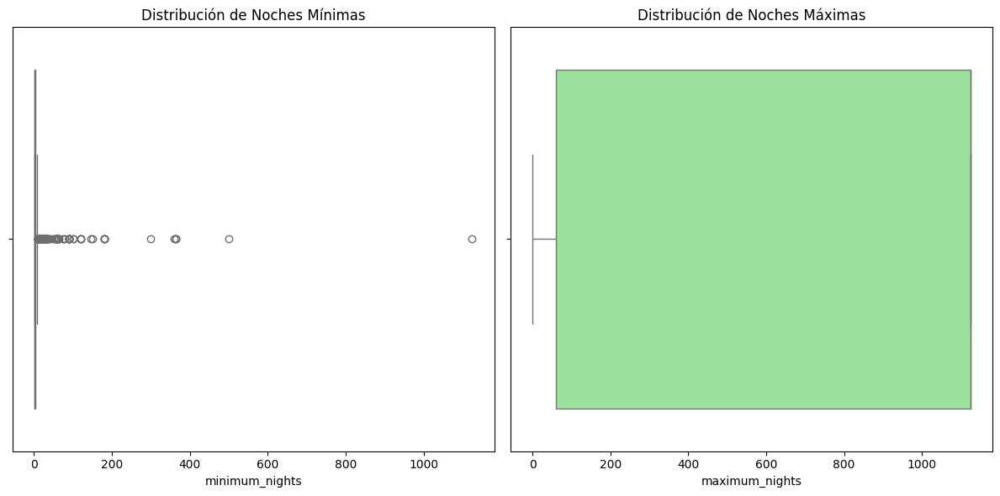

In [402]:
# @title Hipótesis 2 Noches

#Los apartamentos que requieren estancias más largas podrían ofrecer descuentos o estar ubicados en áreas turísticas.**

estancias_largas = df_transformado[(df_transformado['maximum_nights'] > df_transformado['maximum_nights'].quantile(0.99)) |
                        (df_alojamiento_sin_outliers_min['minimum_nights'] > df_alojamiento_sin_outliers_min['minimum_nights'].quantile(0.99))]

# Mostrar detalles de los outliers que requieren estancias más largas
print("Detalles de los outliers que requieren estancias más largas:")
# Gráfico que muestra la distribución de las noches mínimas y máximas
plt.figure(figsize=(12, 6))

# Noches mínimas
plt.subplot(1, 2, 1)
sns.boxplot(x='minimum_nights', data=df_transformado, color='skyblue')
plt.title('Distribución de Noches Mínimas')

# Noches máximas
plt.subplot(1, 2, 2)
sns.boxplot(x='maximum_nights', data=df_transformado, color='lightgreen')
plt.title('Distribución de Noches Máximas')

plt.tight_layout()
plt.show()

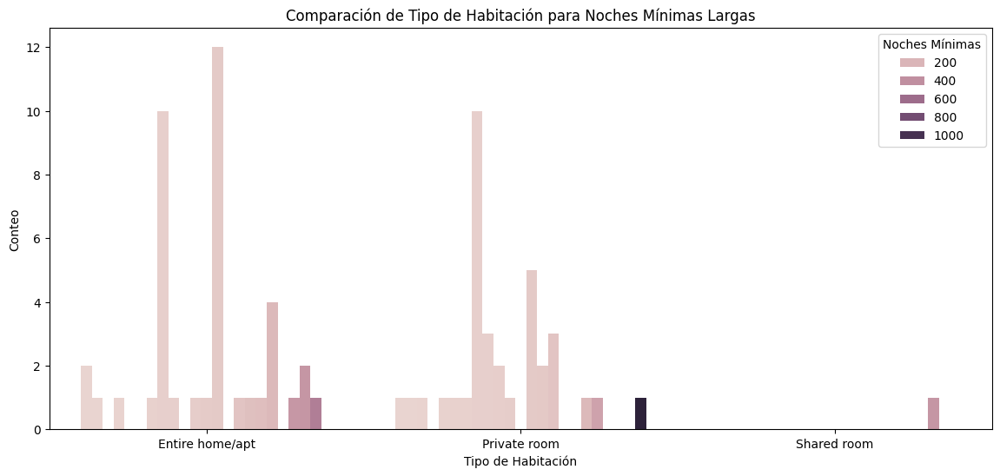

In [403]:
#Análisis Comparativo

# Comparación de características para apartamentos con noches mínimas largas
long_stay_apartments = df_transformado[df_transformado['minimum_nights'] > df_transformado['minimum_nights'].quantile(0.99)]
regular_apartments = df_transformado[df_transformado['minimum_nights'] <= df_transformado['minimum_nights'].quantile(0.99)]

# Visualización de comparación de características
plt.figure(figsize=(14, 6))
sns.countplot(x='room_type', hue='minimum_nights', data=long_stay_apartments)
plt.title('Comparación de Tipo de Habitación para Noches Mínimas Largas')
plt.xlabel('Tipo de Habitación')
plt.ylabel('Conteo')
plt.legend(title='Noches Mínimas')
plt.show()



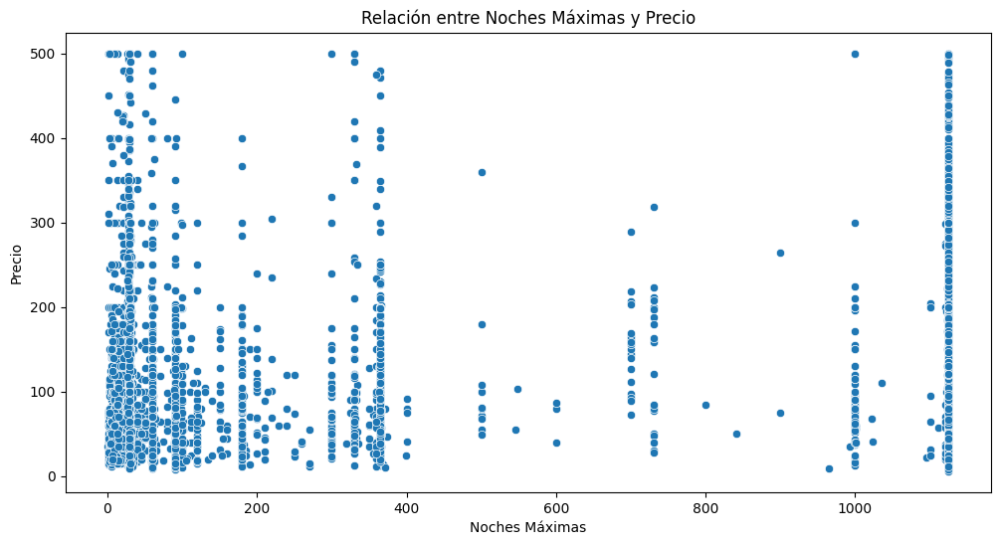

In [404]:

# Relación entre 'maximum_nights' y 'price'
plt.figure(figsize=(12, 6))
sns.scatterplot(x='maximum_nights', y='price', data=df_transformado)
plt.title('Relación entre Noches Máximas y Precio')
plt.xlabel('Noches Máximas')
plt.ylabel('Precio')
plt.show()

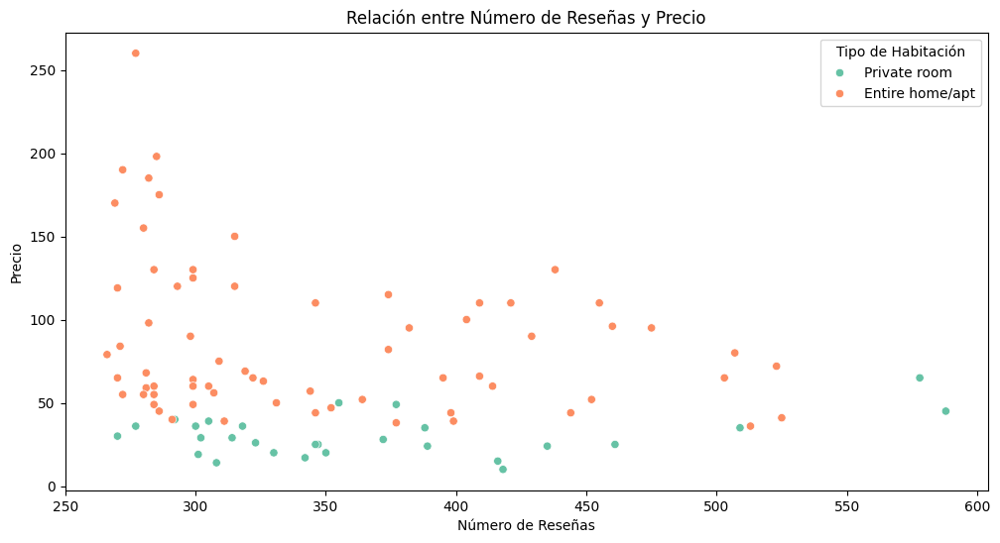

In [406]:
#@title Hipótesis 4 Número de reseñas

# Los apartamentos con muchas reseñas tienen características comunes que los hacen populares.**
# Utilizando la lista de apartamentos identificados en la hipótesis 5
popular_apartments = df_transformado[df_transformado['number_of_reviews'] > df_transformado['number_of_reviews'].quantile(0.99)]

# Gráfico para visualizar la relación entre el número de reseñas y el precio
plt.figure(figsize=(12, 6))
sns.scatterplot(x='number_of_reviews', y='price', data=popular_apartments, hue='room_type', palette='Set2')
plt.title('Relación entre Número de Reseñas y Precio')
plt.xlabel('Número de Reseñas')
plt.ylabel('Precio')
plt.legend(title='Tipo de Habitación')
plt.show()


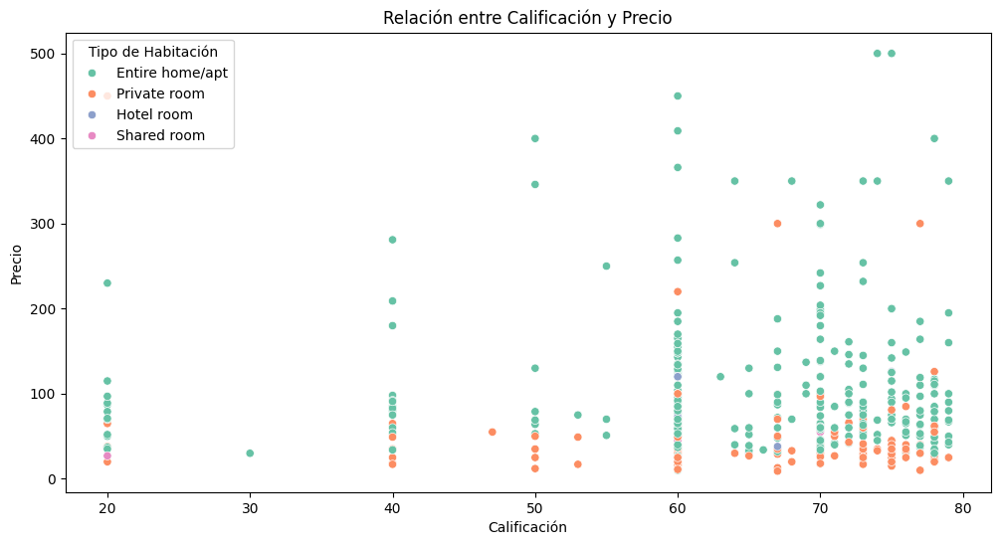

In [407]:
# @title Hipótesis 5 Ratings

# Los apartamentos con calificaciones bajas podrían tener características específicas que resultan en insatisfacción.**
# Utilizando la lista de apartamentos identificados en la hipótesis 6
low_rating_apartments = df_transformado[df_transformado['review_scores_rating'] < df_transformado['review_scores_rating'].quantile(0.1)]

# Gráfico para visualizar la relación entre la calificación y el precio
plt.figure(figsize=(12, 6))
sns.scatterplot(x='review_scores_rating', y='price', data=low_rating_apartments, hue='room_type', palette='Set2')
plt.title('Relación entre Calificación y Precio')
plt.xlabel('Calificación')
plt.ylabel('Precio')
plt.legend(title='Tipo de Habitación')
plt.show()

# 14.Análisis Hipotesis Planteadas (Correlación Precio)

In [336]:
#@title Crear un nuevo DF para analizar hipotesis planteadas
df_transformado_hipotesis=df_transformado.copy()

In [337]:
#@title  Crear columnas one-hot para room_type
room_type_dummies = pd.get_dummies(df_transformado_hipotesis['room_type'], prefix='room_type')

# Añadir las nuevas columnas a tus datos
df_transformado_hipotesis = pd.concat([df_transformado_hipotesis, room_type_dummies], axis=1)


In [338]:
#@title   Crear columnas one-hot para la ciudad
city_dummies = pd.get_dummies(df_transformado_hipotesis['city'], prefix='city')

# Añadir las nuevas columnas a tus datos
df_transformado_hipotesis = pd.concat([df_transformado_hipotesis, city_dummies], axis=1)


In [340]:
#Haremos un análisis de correlación de estos campos con el de precio, para ver si nuestra hipotesis es correcta


# Agrupar en una lista las columnas que me interesan
parametros_precio = ['accommodates', 'bathrooms', 'bedrooms', 'beds','city_barcelona','city_girona','city_madrid','city_malaga','city_mallorca','city_menorca','city_sevilla','city_valencia','room_type_Entire home/apt','room_type_Hotel room','room_type_Private room','room_type_Shared room', 'number_of_reviews','review_scores_rating', 'price']

#nota: 'room_type' al ser un objeto como no puede hacer la correlación no me la cuenta. Podrias crear una columna nueva para y darle un valor númerico a cada tipo para que así me cuente las columnas. Lo mismo me pasa con 'amenities_list','neighbourhood_name', 'neighbourhood_district. Lo hago antes de crear la variable parametro

# Crea un nuevo DataFrame con estas columnas
df_precio= df_transformado_hipotesis[parametros_precio]

# Analisis correlación df_precio
df_precio.corr()

,accommodates,bathrooms,bedrooms,beds,city_barcelona,city_girona,city_madrid,city_malaga,city_mallorca,city_menorca,city_sevilla,city_valencia,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,number_of_reviews,review_scores_rating,price
accommodates,1.000000,0.580202,0.783670,0.404486,-0.237718,0.243429,-0.190751,-0.010987,0.276232,0.099569,-0.024529,-0.039808,0.587147,-0.043079,-0.577544,-0.051637,-0.090165,-0.006697,0.601412
bathrooms,0.580202,1.000000,0.654877,0.271479,-0.152793,0.064353,-0.123557,-0.059575,0.328296,0.082283,-0.045052,-0.050763,0.182805,-0.023608,-0.182895,0.010714,-0.108237,0.048533,0.499915
bedrooms,0.783670,0.654877,1.000000,0.350441,-0.182123,0.176028,-0.196886,-0.047213,0.317119,0.100944,-0.057386,-0.030199,0.415373,-0.040680,-0.402514,-0.058800,-0.116350,0.028230,0.548412
beds,0.404486,0.271479,0.350441,1.000000,-0.098908,0.115311,-0.099171,-0.018854,0.124809,0.088997,-0.020959,-0.024532,0.213926,-0.016158,-0.213366,-0.002581,-0.053652,-0.015872,0.252781
city_barcelona,-0.237718,-0.152793,-0.182123,-0.098908,1.000000,-0.269520,-0.335769,-0.149636,-0.273641,-0.094310,-0.149179,-0.150548,-0.323719,-0.006640,0.324560,0.026158,0.061527,-0.086340,-0.133770
city_girona,0.243429,0.064353,0.176028,0.115311,-0.269520,1.000000,-0.227334,-0.101312,-0.185270,-0.063853,-0.101002,-0.101929,0.228655,-0.000368,-0.225545,-0.033254,-0.134875,-0.041046,0.096504
city_madrid,-0.190751,-0.123557,-0.196886,-0.099171,-0.335769,-0.227334,1.000000,-0.126215,-0.230809,-0.079548,-0.125829,-0.126983,-0.091484,-0.017020,0.088713,0.038781,0.074685,0.044276,-0.143575
city_malaga,-0.010987,-0.059575,-0.047213,-0.018854,-0.149636,-0.101312,-0.126215,1.000000,-0.102861,-0.035451,-0.056076,-0.056591,0.056246,0.000885,-0.056406,-0.004196,0.025388,0.009206,-0.073600
city_mallorca,0.276232,0.328296,0.317119,0.124809,-0.273641,-0.185270,-0.230809,-0.102861,1.000000,-0.064829,-0.102546,-0.103487,0.187446,0.011819,-0.187792,-0.023933,-0.126369,0.042823,0.307825
city_menorca,0.099569,0.082283,0.100944,0.088997,-0.094310,-0.063853,-0.079548,-0.035451,-0.064829,1.000000,-0.035343,-0.035667,0.069864,-0.012896,-0.066022,-0.012805,-0.051555,0.021972,0.110081


###Respuesta Hipotesis

* Hipótesis 1: Ubicación y precio
* Hipótesis 2: Tipo de habitación y precio
* 	Hipótesis 3: Número de servicios y precio
* Hipótesis 5: Capacidad de alojamiento y número de baños/dormitorios/camas
* 	Hipótesis 6: Disponibilidad alta y precio más bajo
* 	Hipótesis 7: Disponibilidad inmediata y precio


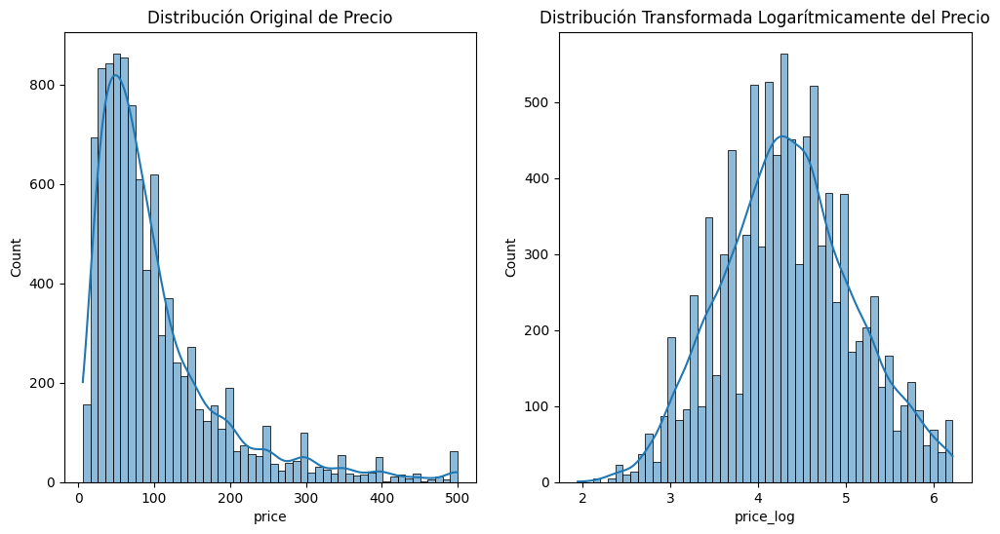

In [341]:
#@title Influencia Precio: transformación logarítmica al precio

# Visualizar la distribución antes y después de la transformación
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df_transformado_hipotesis['price'], bins=50, kde=True)
plt.title('Distribución Original de Precio')

plt.subplot(1, 2, 2)
sns.histplot(df_transformado_hipotesis['price_log'], bins=50, kde=True)
plt.title('Distribución Transformada Logarítmicamente del Precio')

plt.show()


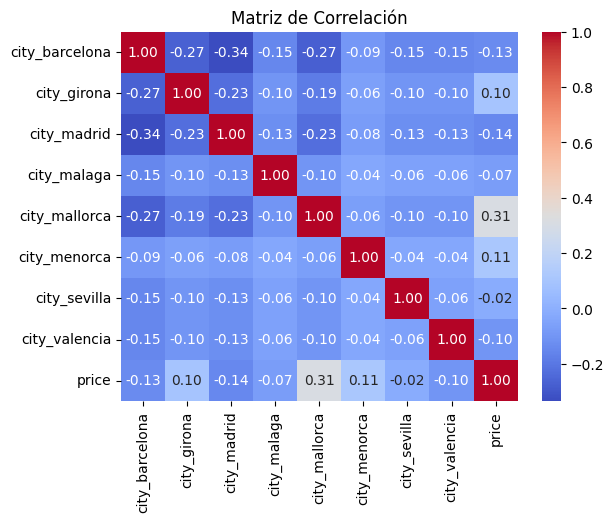

In [342]:
# @title Hipótesis 1: ¿ Las capitales tienden a tener apartamentos más caros?
# Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix_city = df_transformado_hipotesis[['city_barcelona','city_girona','city_madrid','city_malaga','city_mallorca','city_menorca','city_sevilla','city_valencia','price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix_city, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')
plt.show()

Las ciudades con mayor correlación con el precio son Mallorca, Menorca, y Girona

<Axes: xlabel='city'>

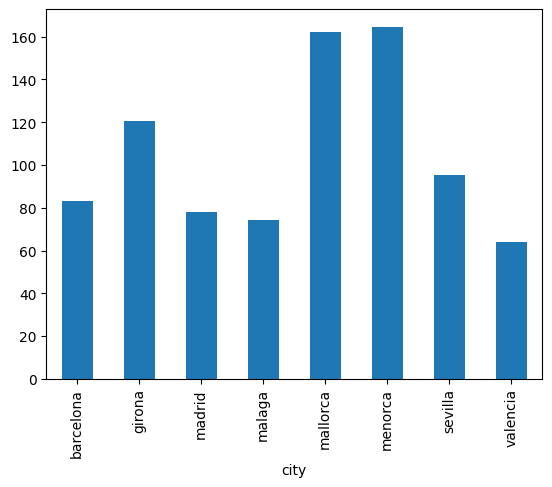

In [343]:
df_transformado_hipotesis.groupby('city')['price'].mean().plot.bar()

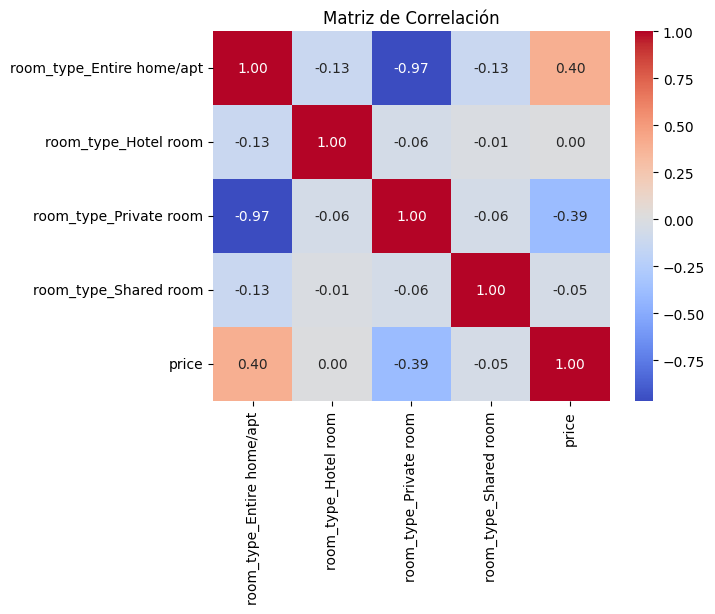

In [344]:
# @title Hipótesis 2: Qué  tipo de habitación tiene mayor precio

# Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix_roomtype = df_transformado_hipotesis[['room_type_Entire home/apt','room_type_Hotel room','room_type_Private room','room_type_Shared room','price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix_roomtype, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')
plt.show()

La correlación más fuerte es  tipo de habitación Entire home/apt con el precio

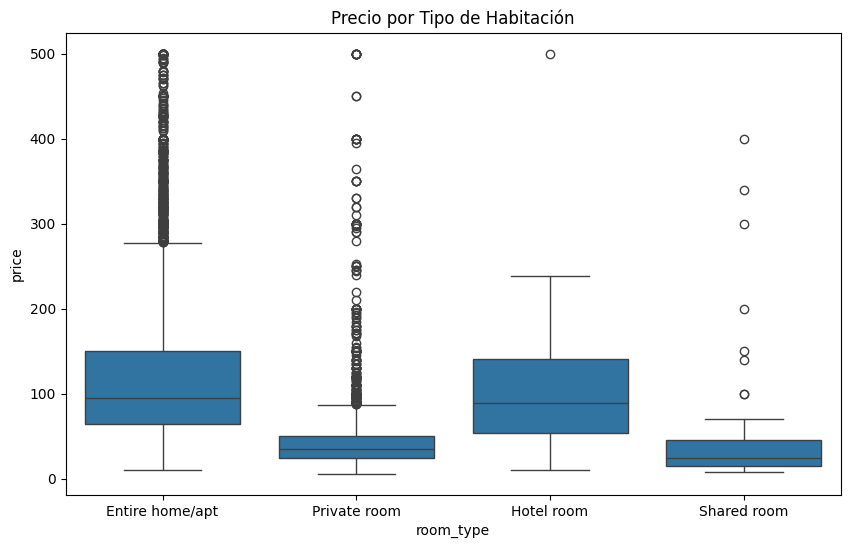

In [345]:
#Tipo de habitación y precio
plt.figure(figsize=(10,6))
sns.boxplot(x='room_type', y='price', data=df_transformado_hipotesis)
plt.title('Precio por Tipo de Habitación')
plt.show()

<Axes: xlabel='room_type'>

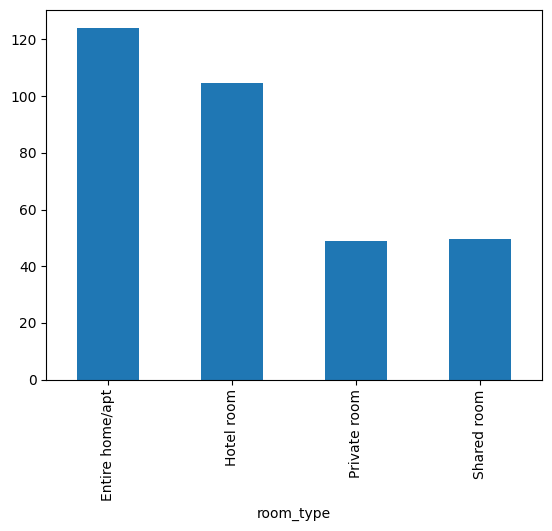

In [346]:
df_transformado_hipotesis.groupby('room_type')['price'].mean().plot.bar()

Text(0.5, 1.0, 'Matriz de Correlación')

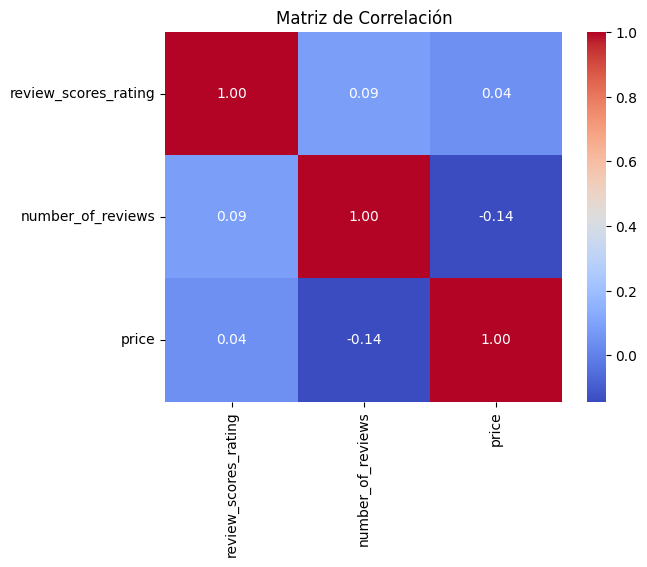

In [348]:
# @title Hipótesis 3: A mayor número de reseñas mayor es el precio: Popularidad
# Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix_reviews = df_transformado_hipotesis[['review_scores_rating','number_of_reviews','price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix_reviews, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')

In [349]:
correlation_matrix_reviews

,review_scores_rating,number_of_reviews,price
review_scores_rating,1.000000,0.085415,0.043338
number_of_reviews,0.085415,1.000000,-0.142438
price,0.043338,-0.142438,1.000000


la calificación de las revisiones y la cantidad de revisiones parecen tener una relación débil con el precio, y en el caso de la cantidad de revisiones, esta relación es negativa pero moderada.

<Axes: xlabel='number_of_reviews_cat'>

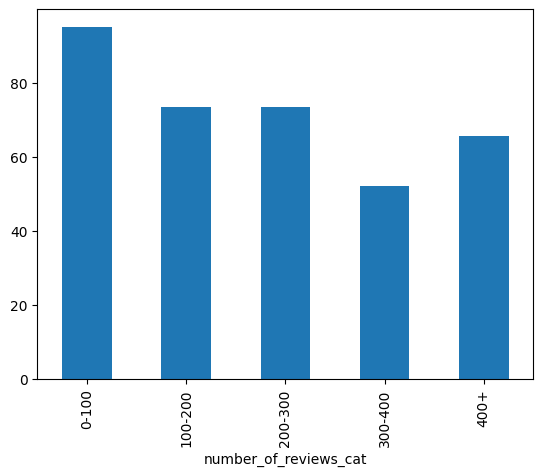

In [350]:
df_transformado_hipotesis.groupby('number_of_reviews_cat')['price'].mean().plot.bar()

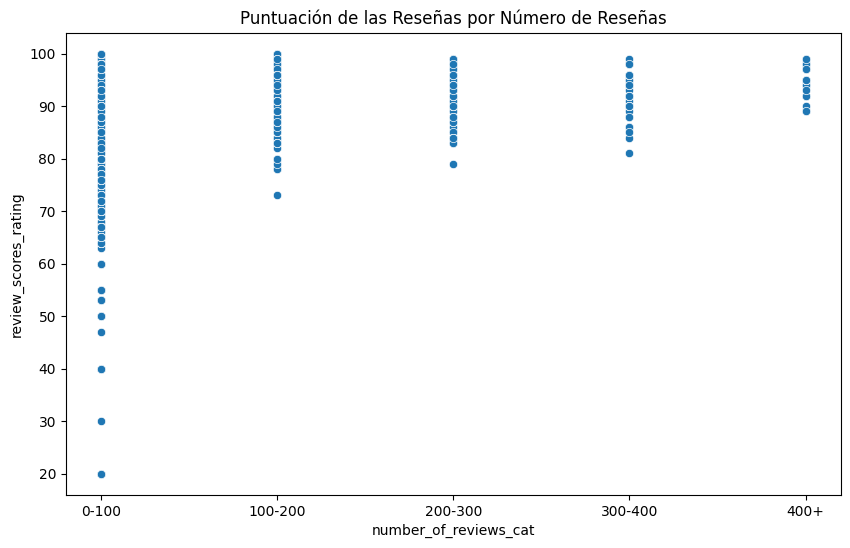

In [351]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='number_of_reviews_cat', y='review_scores_rating', data=df_transformado)
plt.title('Puntuación de las Reseñas por Número de Reseñas')
plt.show()

<Axes: xlabel='review_scores_rating_cat'>

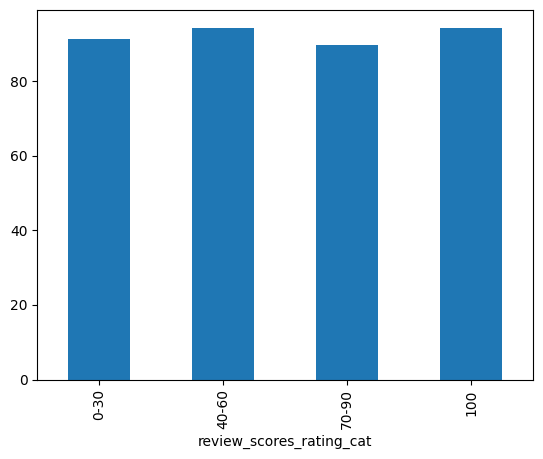

In [352]:
df_transformado_hipotesis.groupby(['review_scores_rating_cat'])['price'].mean().plot.bar()

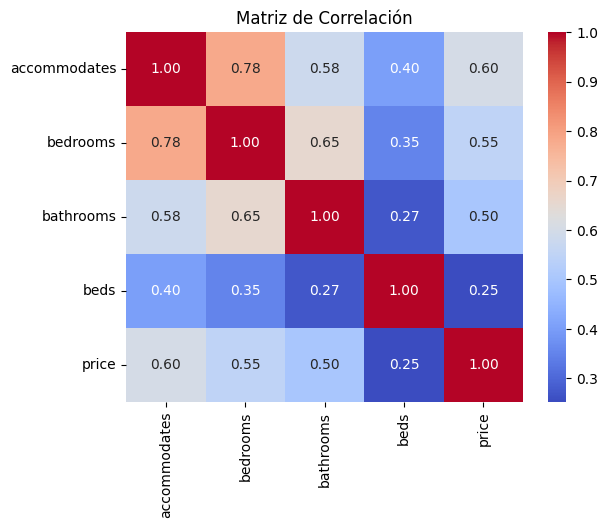

In [353]:
# @title Hipótesis 4: Los alojamientos con mayor capacidad de alojamiento,  número de baños/dormitorios/camas son más caros
# Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix = df_transformado_hipotesis[['accommodates', 'bedrooms','bathrooms', 'beds','price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')
plt.show()

Bedrooms y Price:
○	Correlación positiva: Los alojamientos con más habitaciones tienden a tener precios más altos.
○	Accommodates y Price:
○	Correlación positiva: Los alojamientos con mayor capacidad tienden a ser más caros.

Beds y Price:
○	Correlación positiva: Los alojamientos con más camas tienden a tener precios más altos.

Bathrroms y Price:
○	Correlación positiva: Los alojamientos con más baños tienden a tener precios más altos.

○	Bedrooms, Beds, Bathrroms y Accommodates:
○	Correlación positiva:Los alojamientos con más distribución tienden a tener mayor capacidad, por tanto suelen ser más carosos alojamientos con una distribución más amplia de dormitorios, camas y baños tiendan a tener mayor capacidad y, por lo tanto, tiendan a ser más caros.



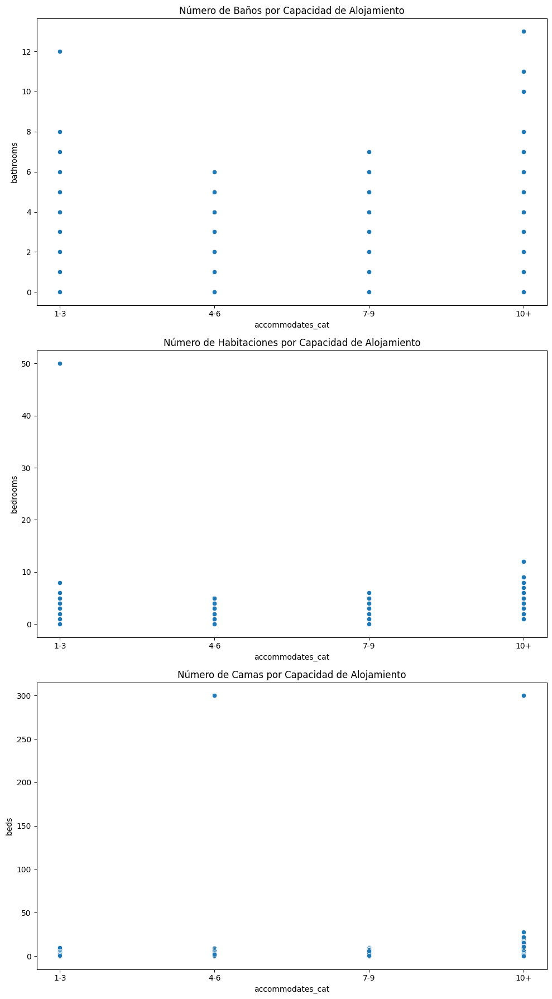

In [354]:
fig, axes = plt.subplots(3, 1, figsize=(10,18))
sns.scatterplot(x='accommodates_cat', y='bathrooms', data=df_transformado, ax=axes[0])
axes[0].set_title('Número de Baños por Capacidad de Alojamiento')
sns.scatterplot(x='accommodates_cat', y='bedrooms', data=df_transformado, ax=axes[1])
axes[1].set_title('Número de Habitaciones por Capacidad de Alojamiento')
sns.scatterplot(x='accommodates_cat', y='beds', data=df_transformado, ax=axes[2])
axes[2].set_title('Número de Camas por Capacidad de Alojamiento')
plt.tight_layout()
plt.show()

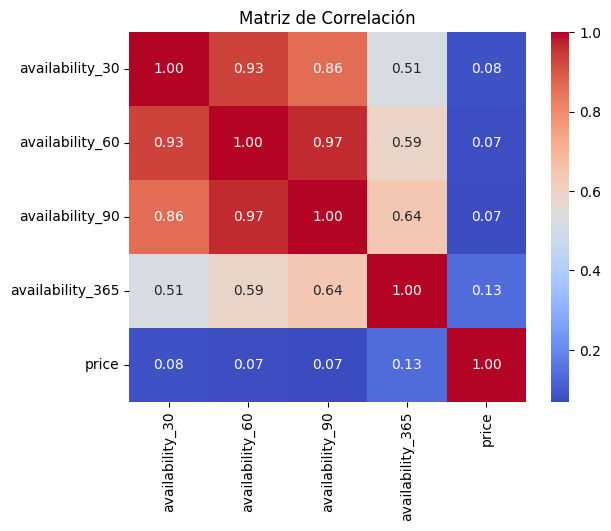

In [355]:
# @title Hipótesis 5: Un apartamento con disponibilidad alta tiene precio más bajo
# Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix_availability = df_transformado_hipotesis[['availability_30','availability_60','availability_90','availability_365','price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix_availability, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')
plt.show()

In [356]:
correlation_matrix_availability

,availability_30,availability_60,availability_90,availability_365,price
availability_30,1.000000,0.931408,0.859273,0.513574,0.083661
availability_60,0.931408,1.000000,0.966186,0.586310,0.074971
availability_90,0.859273,0.966186,1.000000,0.640753,0.069222
availability_365,0.513574,0.586310,0.640753,1.000000,0.134883
price,0.083661,0.074971,0.069222,0.134883,1.000000


la disponibilidad para diferentes períodos parece tener correlaciones débiles a moderadas con el precio, lo que sugiere que la relación no es muy fuerte.

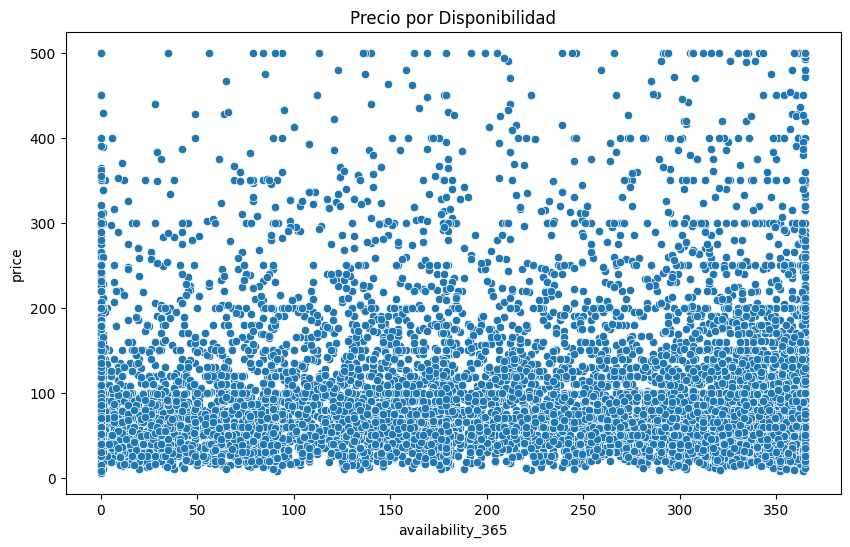

In [357]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='availability_365', y='price', data=df_transformado)
plt.title('Precio por Disponibilidad')
plt.show()

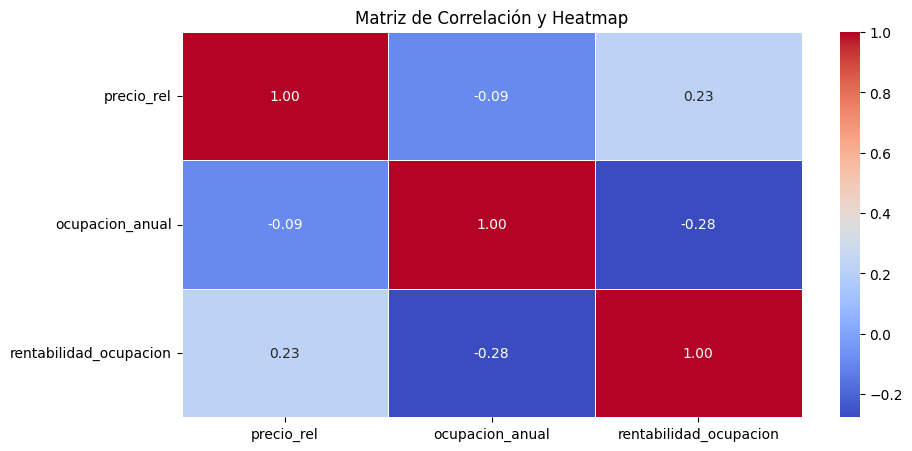

In [358]:
#@title Hipotesis 6 Apartamentos más rentables según ocupación

# Evaluar la rentabilidad considerando la ocupación del inmueble. Por ejemplo,  calcular la proporción de días ocupados en un año.

# Precio relativo:

#     Comparar el precio de alquiler con el precio promedio en la región para identificar inmuebles que ofrezcan una buena relación calidad-precio.

df_transformado_hipotesis['precio_rel'] = df_transformado_hipotesis['price'] / df_transformado_hipotesis['price'].mean()


# Análisis de ocupación:

    # Evaluar la rentabilidad considerando la ocupación del inmueble. Por ejemplo,  calcular la proporción de días ocupados en un año.

# Filtrar valores en los que availability_365 no es igual a cero ni igual a 365
df_filtrado = df_transformado_hipotesis[(df_transformado_hipotesis['availability_365'] != 0) & (df_transformado_hipotesis['availability_365'] != 365)]
# Cálculo de la rentabilidad por ocupación
df_filtrado['ocupacion_anual'] = 365 - df_filtrado['availability_365']
# Asegurarse de que no haya divisiones por cero
constante_pequena = 1e-10
df_filtrado['rentabilidad_ocupacion'] = df_filtrado['price'] / (df_filtrado['ocupacion_anual'] + constante_pequena)


# Selecciona las columnas relevantes para la matriz de correlación
columnas_correlacion = ['precio_rel', 'ocupacion_anual', 'rentabilidad_ocupacion']


# Crea una submatriz de correlación
matriz_correlacion = df_filtrado[columnas_correlacion].corr()

# Crea un heatmap usando seaborn
plt.figure(figsize=(10, 5))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Matriz de Correlación y Heatmap')
plt.show()


* Precio Relativo (precio_rel):
    Hay una correlación positiva moderada (0.23) con la rentabilidad por ocupación. Esto sugiere que, en general, los alojamientos con un precio relativo más alto tienden a tener una rentabilidad por ocupación más alta.

* Ocupación Anual (ocupacion_anual):
    Existe una correlación negativa moderada (-0.28) con la rentabilidad por ocupación. Esto indica que, en general, los alojamientos con una mayor proporción de días ocupados en un año tienden a tener una rentabilidad por ocupación más baja.

* Rentabilidad por Ocupación (rentabilidad_ocupacion):
    La rentabilidad por ocupación está positivamente correlacionada con el precio relativo. Sin embargo, tiene una correlación negativa con la ocupación anual. Esto sugiere que la rentabilidad por ocupación puede estar influenciada tanto por el precio relativo como por la ocupación anual.

Text(0.5, 1.0, 'Matriz de Correlación')

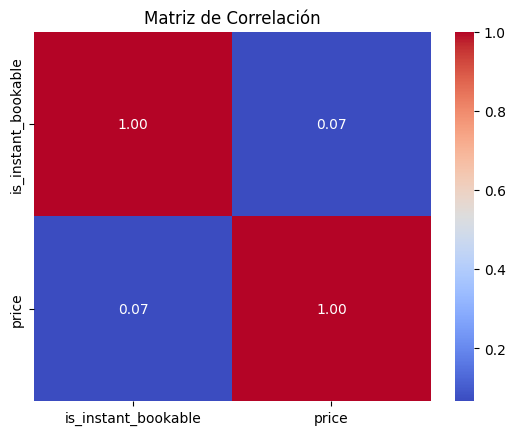

In [359]:
# @title Hipotesis 7: Los apartamentos con disponibilidad inmediata tienden a ser más caros
# Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix = df_transformado_hipotesis[['is_instant_bookable','price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')

 la disponibilidad inmediata de un apartamento no parece tener una fuerte influencia en su precio s

In [360]:
print(correlation_matrix)

                     is_instant_bookable    price
is_instant_bookable              1.00000  0.06648
price                            0.06648  1.00000


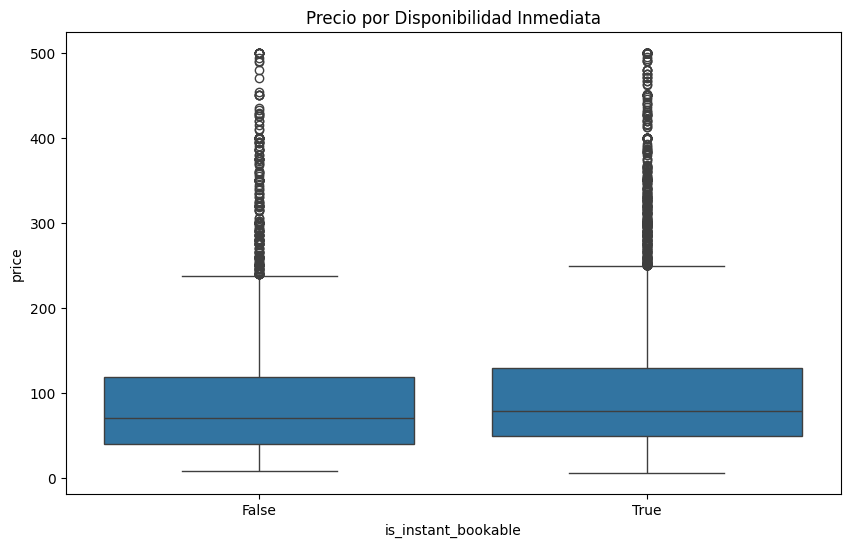

In [361]:

plt.figure(figsize=(10,6))
sns.boxplot(x='is_instant_bookable', y='price', data=df_transformado)
plt.title('Precio por Disponibilidad Inmediata')
plt.show()

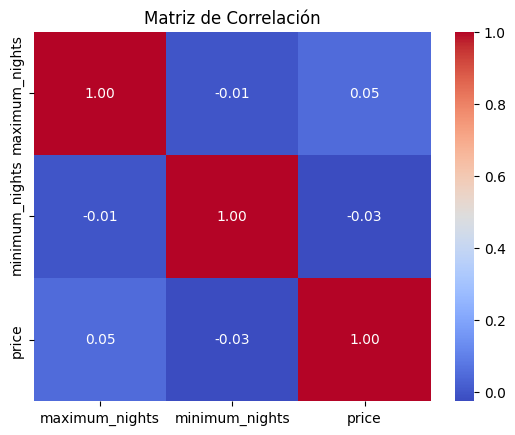

In [362]:
# @title Hipotesis 8: las varibles noches tienen relación con el precio

#  Crear la matrix de correlación.es una tabla que muestra la correlación entre todas las variables del conjunto de datos. solo variables numericas
correlation_matrix_nights = df_transformado_hipotesis[['maximum_nights','minimum_nights','price']].corr()
# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix_nights, annot=True, cmap='coolwarm', fmt=".2f") #2f"para que nos muestre los numeros con dos decimales.
plt.title('Matriz de Correlación')
plt.show()

In [363]:
correlation_matrix_nights

,maximum_nights,minimum_nights,price
maximum_nights,1.000000,-0.005718,0.048738
minimum_nights,-0.005718,1.000000,-0.026357
price,0.048738,-0.026357,1.000000


 la disponibilidad inmediata de un apartamento no parece tener una fuerte influencia en su precio s

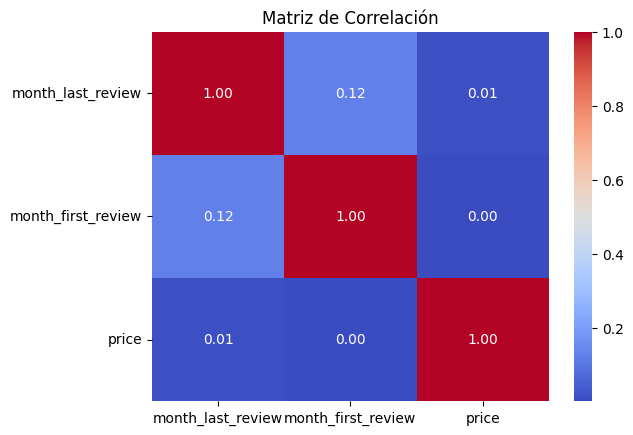

In [364]:
# @title Hipotesis 9. La temporada en que se reciben las primeras o últimas revisiones tiene alguna relación con el precio


# Crear la matrix de correlación.
# Extraer el mes de la fecha de revisión
df_transformado_hipotesis['month_last_review'] = df_transformado_hipotesis['last_review_date'].dt.month
df_transformado_hipotesis['month_first_review'] = df_transformado_hipotesis['first_review_date'].dt.month

# Ahora puedes calcular la matriz de correlación
correlation_matrix_first_last_review_date = df_transformado_hipotesis[['month_last_review', 'month_first_review', 'price']].corr()

# Visualizar la matriz de correlación
sns.heatmap(correlation_matrix_first_last_review_date, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

In [365]:
correlation_matrix_first_last_review_date

,month_last_review,month_first_review,price
month_last_review,1.000000,0.123145,0.012450
month_first_review,0.123145,1.000000,0.001244
price,0.012450,0.001244,1.000000


 no hay relaciones lineales fuertes entre estos tres atributos.

In [366]:
#@title Hipotesis 10 Según el vencidario el precio es más elevado

In [367]:
from sklearn.preprocessing import LabelEncoder

# Crear una instancia de LabelEncoder
label_encoder = LabelEncoder()

# Aplicar Label Encoding a 'neighbourhood_name' y crear una nueva columna 'neighbourhood_name_encod'
df_transformado['neighbourhood_name_encod'] = label_encoder.fit_transform(df_transformado['neighbourhood_name'])

In [368]:
# Aplicar One-Hot Encoding a 'neighbourhood_name'
df_transformado_hipotesis = pd.concat([df_transformado_hipotesis, pd.get_dummies(df_transformado_hipotesis['neighbourhood_name'], prefix='neighbourhood')], axis=1) #mantenemos así las dos variables


In [369]:
print(df_transformado.isnull().sum())

apartment_id                      0
name                              8
host_id                           0
neighbourhood_name                0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
amenities_list                    1
price                             0
minimum_nights                    0
maximum_nights                    1
availability_30                   1
availability_60                   0
availability_90                   1
availability_365                  0
number_of_reviews                 0
first_review_date              2462
last_review_date               2463
review_scores_rating           2566
review_scores_accuracy         2575
review_scores_cleanliness      2569
review_scores_checkin          2580
review_scores_communication    2571
review_scores_location      

Realmente esto no me sirve, ya que lo ideal sería clasificar los barrios por Altos, Bajos pero para eso necesito conocer el mercado

In [409]:
df_transformado.shape

(9746, 44)

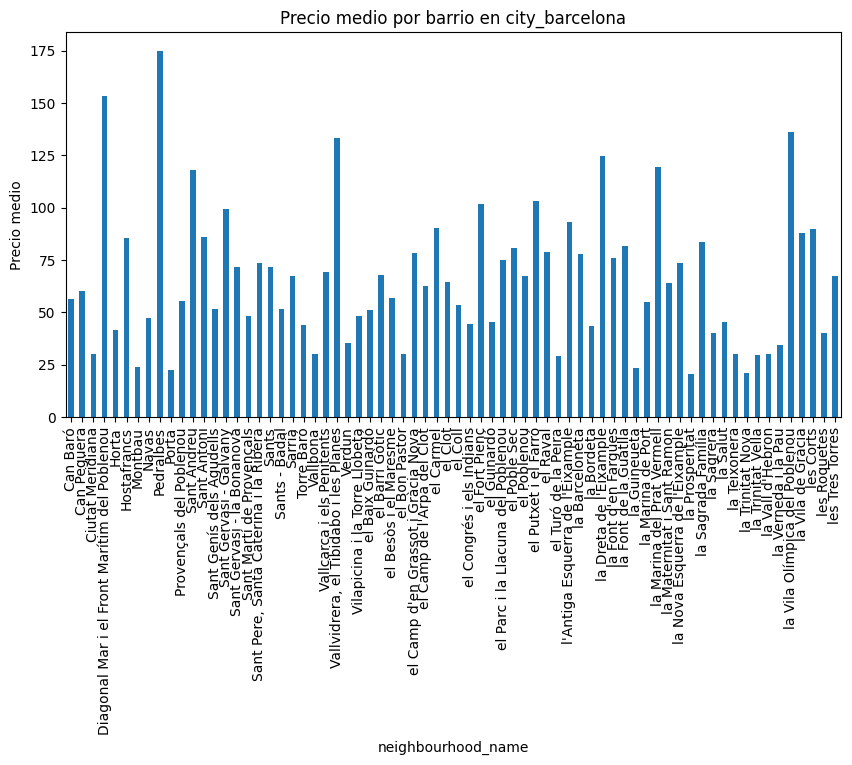

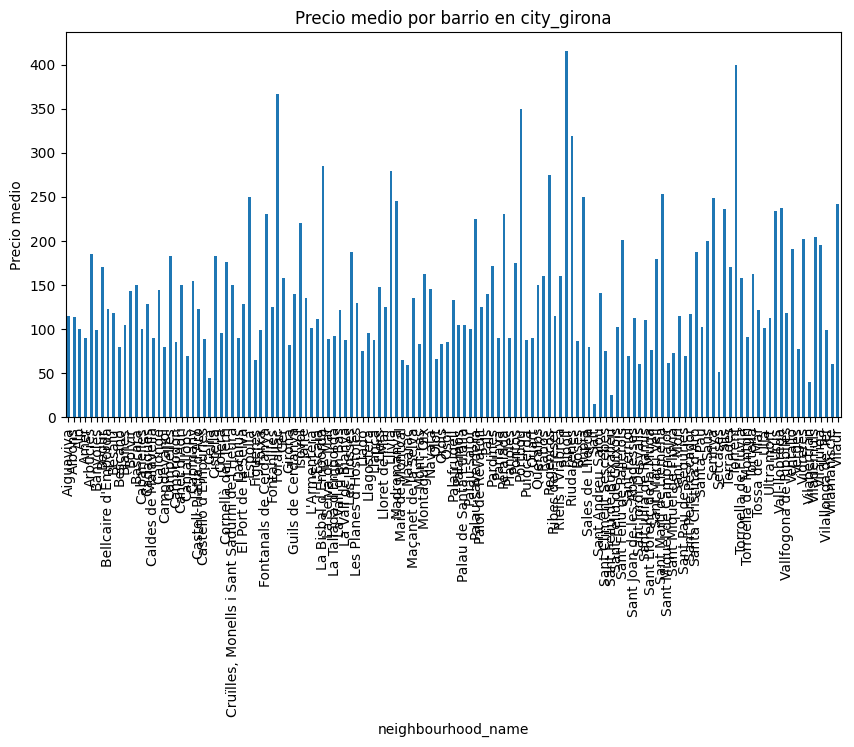

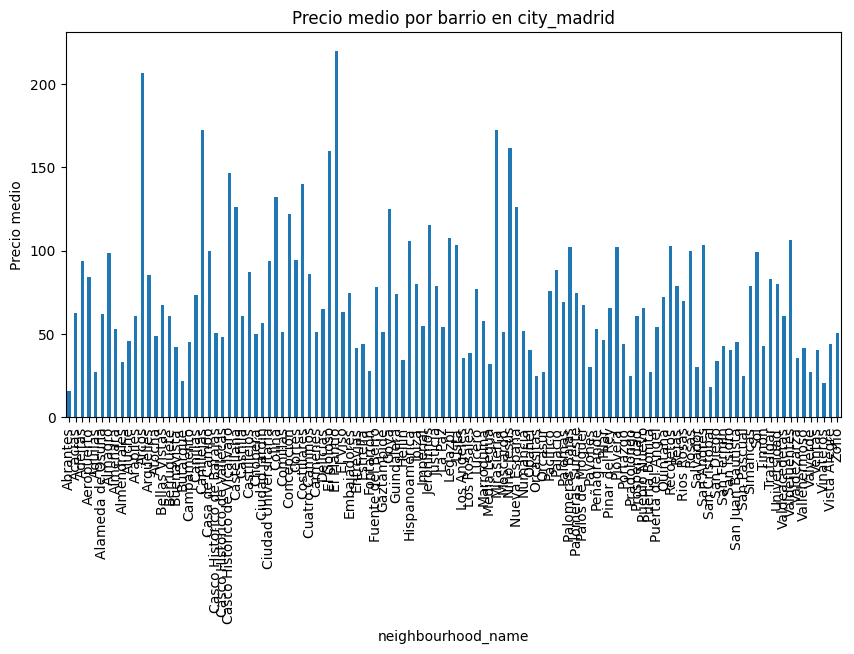

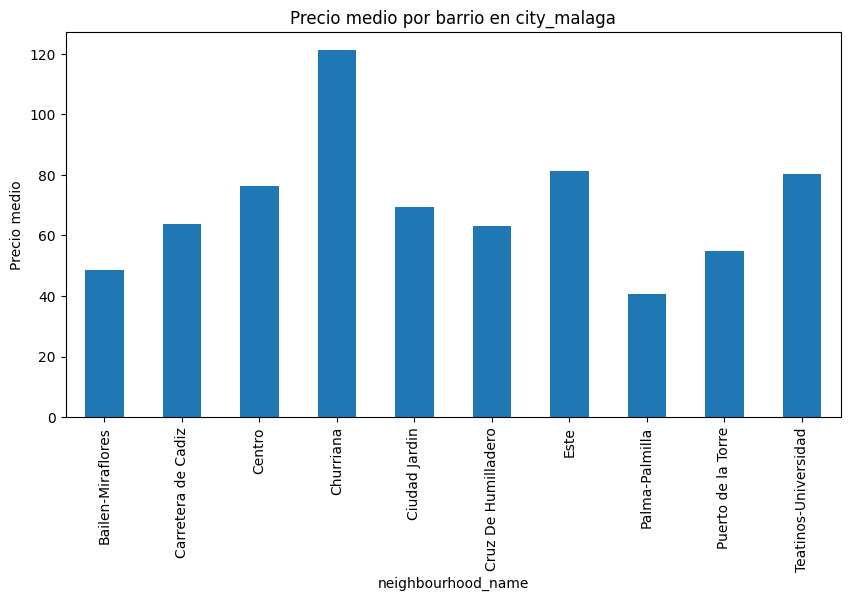

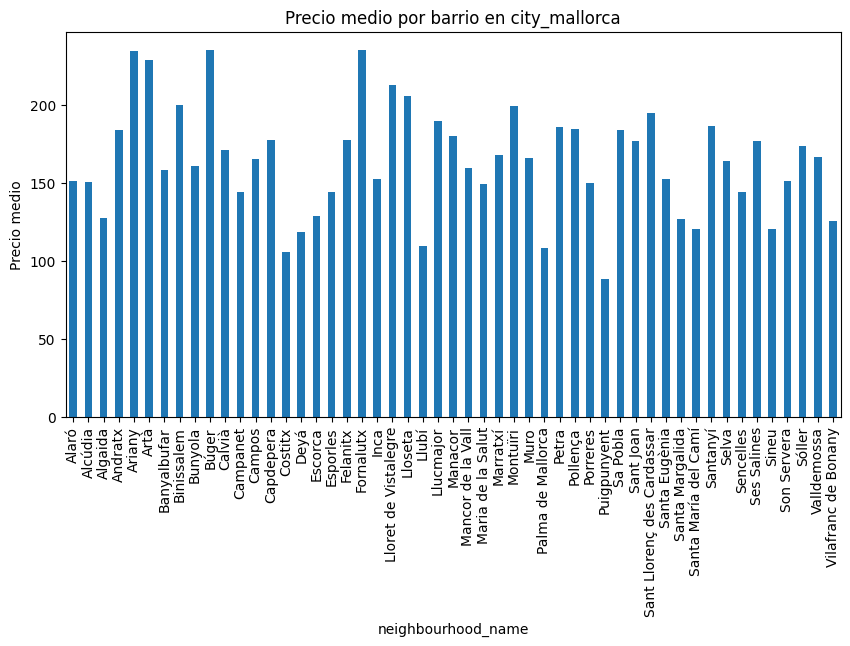

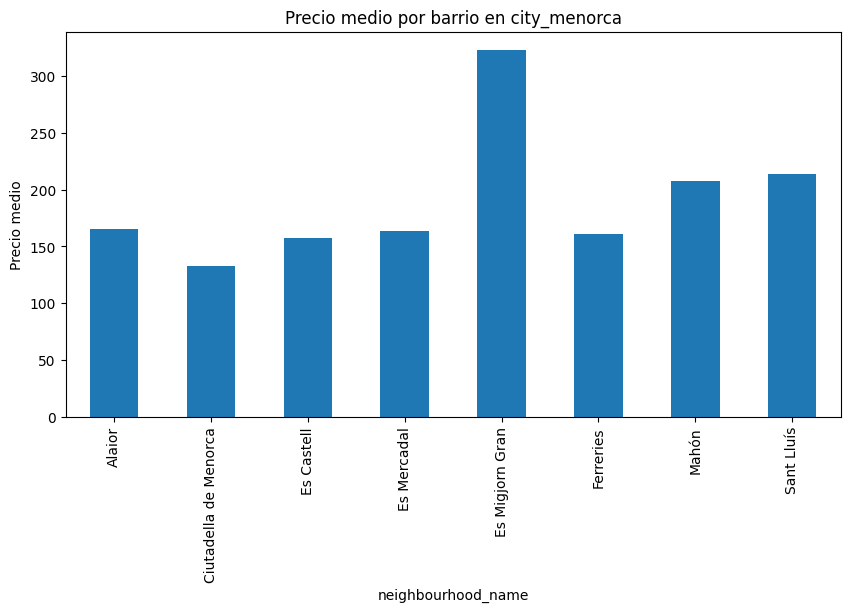

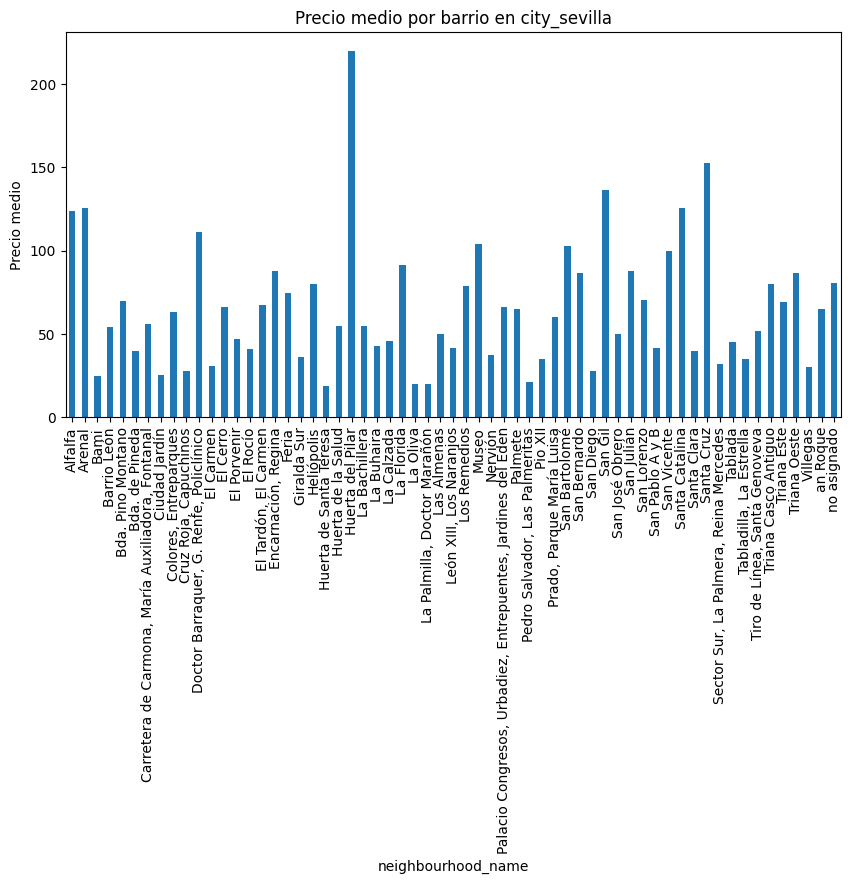

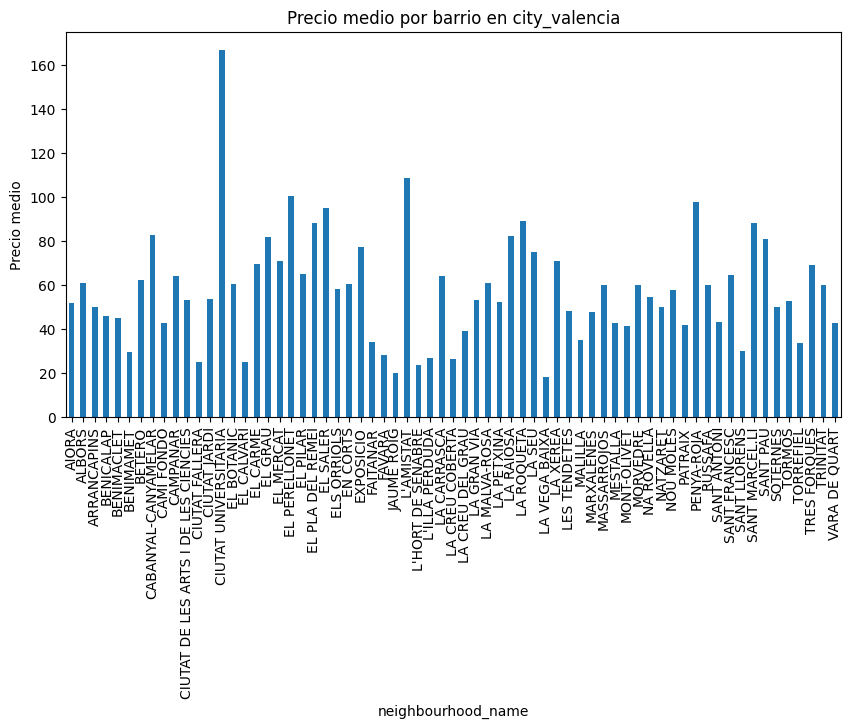

In [410]:
import matplotlib.pyplot as plt

ciudades = ['city_barcelona', 'city_girona', 'city_madrid', 'city_malaga', 'city_mallorca', 'city_menorca', 'city_sevilla', 'city_valencia']

for ciudad in ciudades:
    df_ciudad = df_transformado_hipotesis[df_transformado_hipotesis[ciudad] == 1]
    mean_prices = df_ciudad.groupby('neighbourhood_name')['price'].mean()

    plt.figure(figsize=(10,5))
    mean_prices.plot(kind='bar')
    plt.title(f"Precio medio por barrio en {ciudad}")
    plt.ylabel('Precio medio')
    plt.show()

In [411]:
df_transformado_hipotesis.shape

(9746, 576)

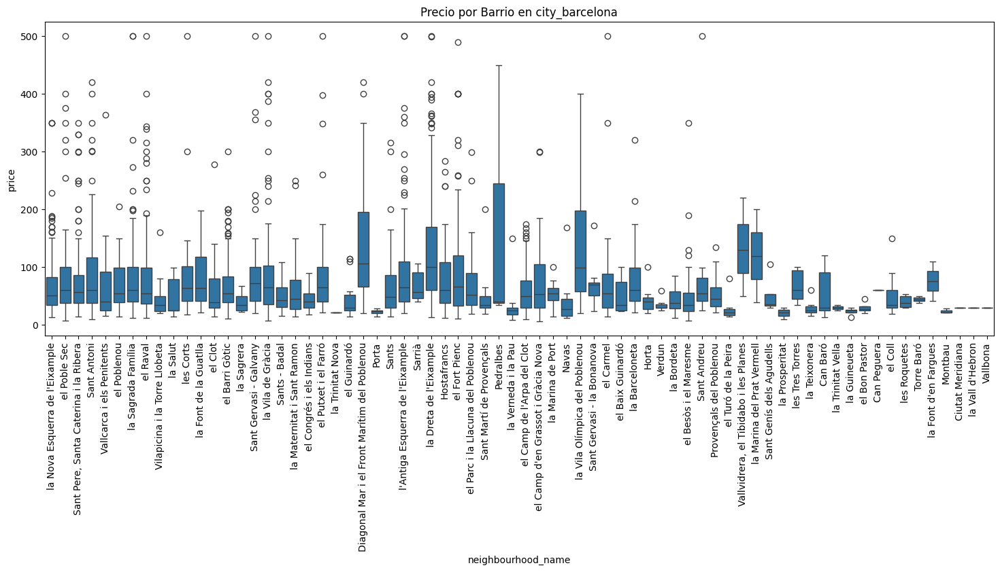

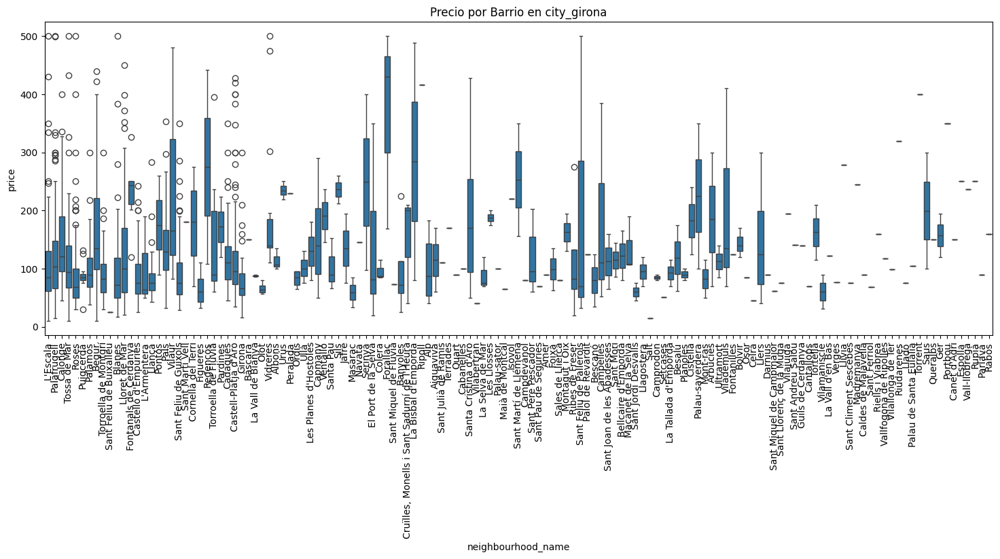

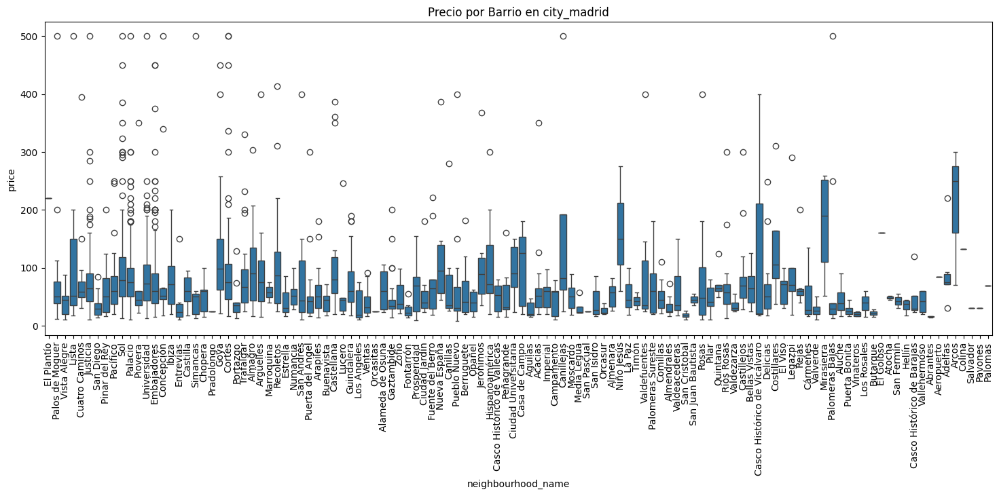

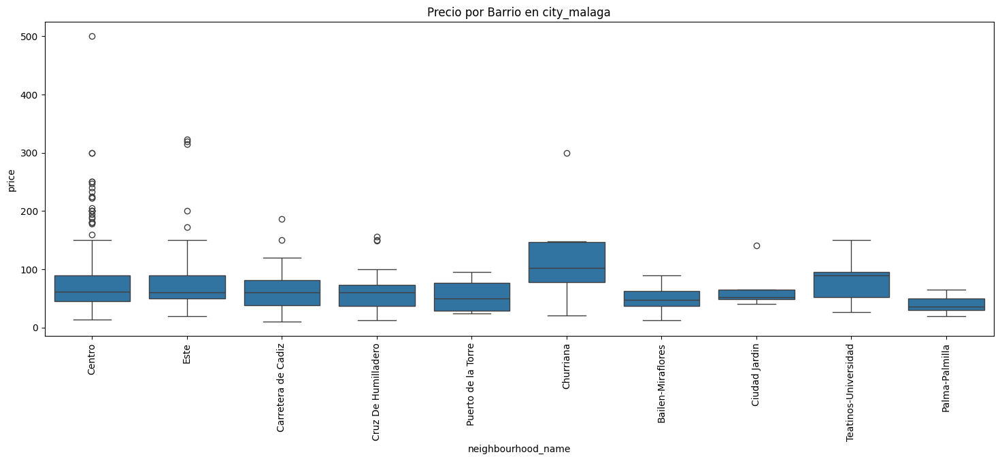

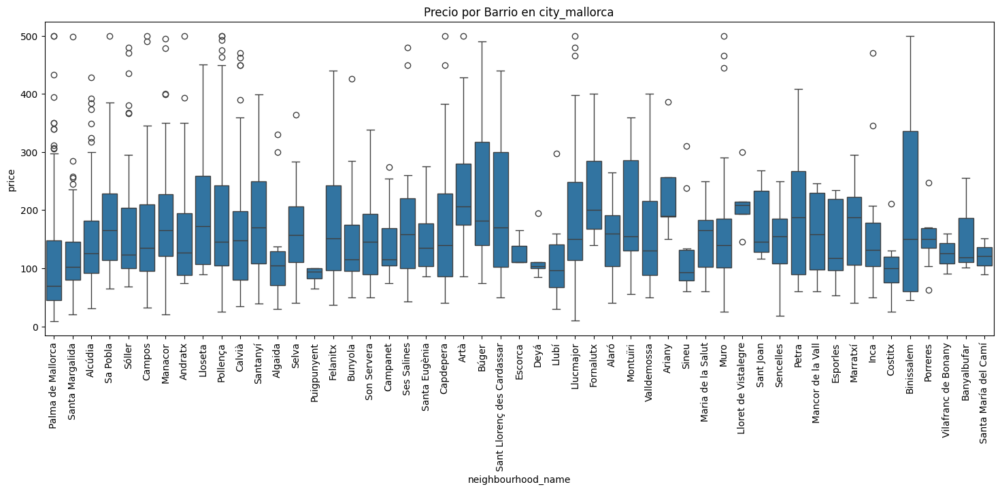

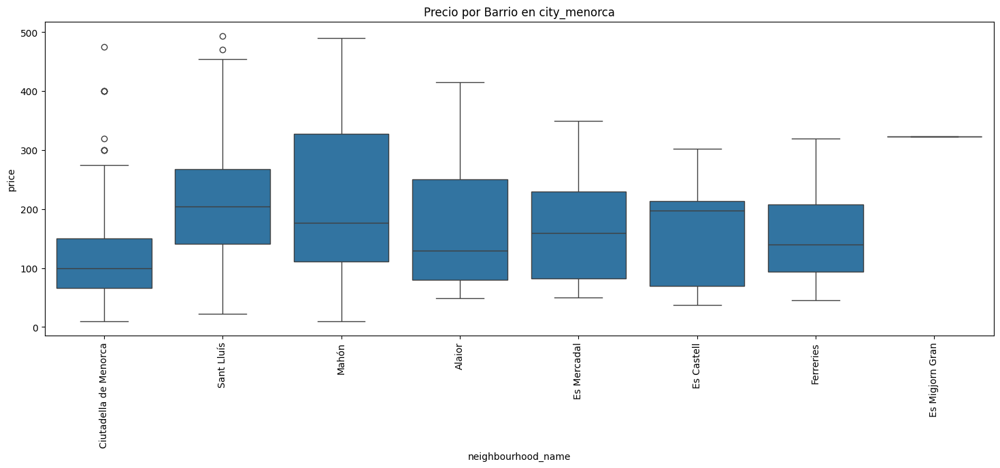

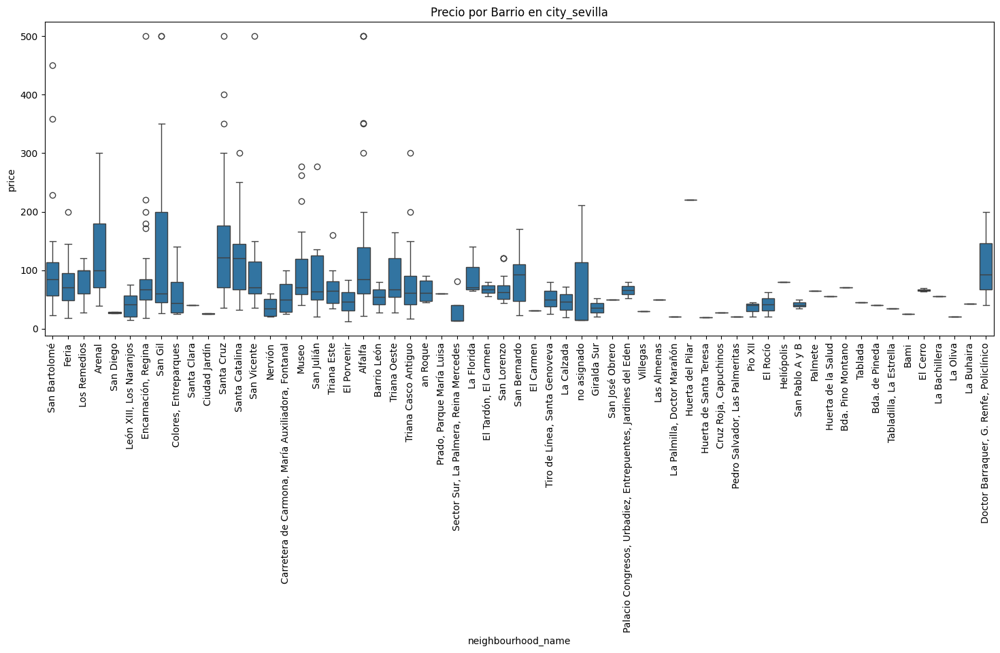

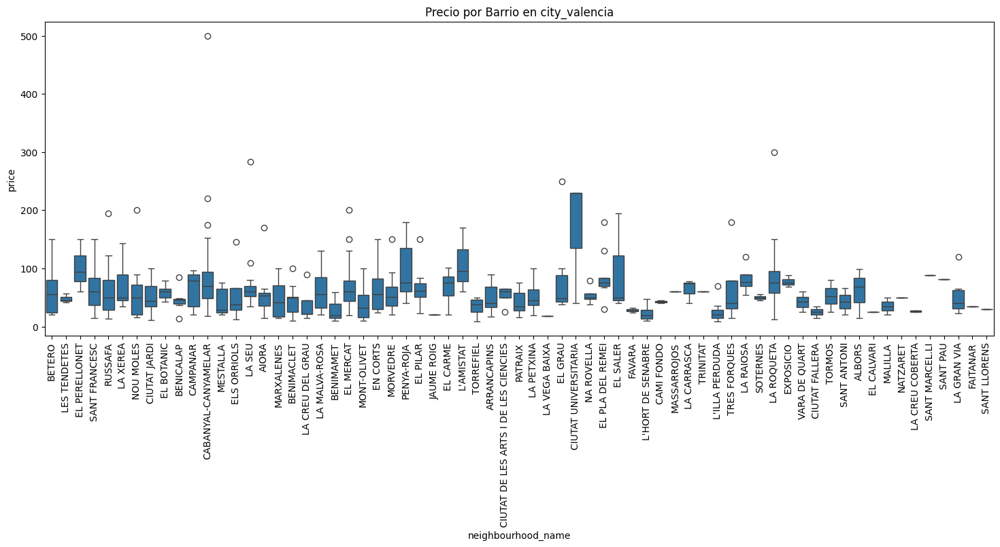

In [412]:

ciudades = ['city_barcelona', 'city_girona', 'city_madrid', 'city_malaga', 'city_mallorca', 'city_menorca', 'city_sevilla', 'city_valencia']

for ciudad in ciudades:
    df_ciudad = df_transformado[df_transformado_hipotesis[ciudad] == 1]
    plt.figure(figsize=(18,6))
    sns.boxplot(x='neighbourhood_name', y='price', data=df_ciudad)  # Usar df_ciudad en lugar de df_transformado
    plt.xticks(rotation=90)  # Rotar las etiquetas para mejorar la legibilidad del eje x
    plt.title(f'Precio por Barrio en {ciudad}')
    plt.show()

In [413]:
#Columnas del DF

print('Nombre columnas:', df_transformado_hipotesis.columns)

Nombre columnas: Index(['apartment_id', 'name', 'host_id', 'neighbourhood_name', 'latitude',
       'longitude', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       ...
       'neighbourhood_la Trinitat Nova', 'neighbourhood_la Trinitat Vella',
       'neighbourhood_la Vall d'Hebron', 'neighbourhood_la Verneda i la Pau',
       'neighbourhood_la Vila Olímpica del Poblenou',
       'neighbourhood_la Vila de Gràcia', 'neighbourhood_les Corts',
       'neighbourhood_les Roquetes', 'neighbourhood_les Tres Torres',
       'neighbourhood_no asignado'],
      dtype='object', length=576)


# 15.Variables rentababilidad por Ciudad

In [417]:
# Calcular estadísticas descriptivas para el precio en cada ciudad
estadisticas = df_transformado_hipotesis.groupby('city')['price'].describe()

# Mostrar las estadísticas
print(estadisticas)

            count        mean         std   min   25%    50%    75%    max
city                                                                      
barcelona  2775.0   82.957323   75.416997   6.0  35.0   60.0  100.0  500.0
girona     1504.0  120.660904   85.370676  10.0  65.0   94.0  144.0  500.0
madrid     2151.0   77.983728   69.731615   8.0  35.0   60.0   91.0  500.0
malaga      519.0   74.493256   52.629904  10.0  42.0   60.0   90.0  500.0
mallorca   1543.0  162.317285  101.939014   9.0  89.0  136.0  210.0  500.0
menorca     213.0  164.615023  110.446914  10.0  80.0  138.0  230.0  494.0
sevilla     516.0   95.562016   82.732473  12.0  49.0   70.0  115.0  500.0
valencia    525.0   63.788838   45.630560   9.0  35.0   56.0   79.0  500.0


In [ ]:
#Crear una nueva variable que contenga las ciudades
df_transformado['city_1'] = df_transformado_hipotesis[['city_barcelona', 'city_girona', 'city_madrid', 'city_malaga', 'city_mallorca', 'city_menorca', 'city_sevilla', 'city_valencia']].idxmax(axis=1)

# Crear un groupby con 'neighbourhood_name' y calcular la media de 'price'
mean_price_by_city = df_transformado.groupby(['city_1'])['price'].mean().reset_index()

# Visualizar un gráfico interactivo
fig = px.line(mean_price_by_city, x='city_1', y='price', height=400)
# Muestra el gráfico
fig.show()

#no olvidar quitar los filtros de las leyendas

In [418]:
#Crear una nueva variable que contenga las ciudades
df_transformado_hipotesis['city_2'] = df_transformado_hipotesis[['city_barcelona', 'city_girona', 'city_madrid', 'city_malaga', 'city_mallorca', 'city_menorca', 'city_sevilla', 'city_valencia']].idxmax(axis=1)

# Crear un groupby con 'neighbourhood_name' y calcular la media de 'price'
mean_price_by_city_neighbourhood = df_transformado_hipotesis.groupby(['city_2', 'neighbourhood_name'])['price'].mean().reset_index()

# Visualizar un gráfico interactivo
fig = px.line(mean_price_by_city_neighbourhood, x='neighbourhood_name', y='price', color='city_2', height=1000)
# Muestra el gráfico
fig.show()

#no olvidar quitar los filtros de las leyendas

#16.Comprobación final total filas y columnas data

In [421]:
#Total de filas y columnas de nuestro DF

print('Cantidad de Filas y columnas:', df_transformado.shape)

Cantidad de Filas y columnas: (9746, 44)


# 17.Guardar df en formato CSV

In [420]:
#Guardar el DataFrame en un archivo CSV
from google.colab import files

df_hosting= pd.DataFrame(df_transformado)


# Ruta donde deseas guardar el archivo CSV en Google Drive (nombre único con marca de tiempo)
nombre_archivo_1 = f'df_hosting.csv'
ruta_guardado_1 = f'/content/drive/MyDrive/Hosting/Hosting/Power BI/{nombre_archivo_1}'


# Guardar el DataFrame en un archivo CSV único basado en la marca de tiempo en Google Drive
df_hosting.to_csv('df_hosting.csv', index=False,encoding='utf-8')
print(f"Archivo CSV único con marca de tiempo guardado en: {ruta_guardado_1}")

Archivo CSV único con marca de tiempo guardado en: /content/drive/MyDrive/Hosting/Hosting/Power BI/df_hosting.csv
